This file contains the Custom trained YOLOv8 model trained on 35 Images predicting on the CARPK and PUCPR Dataset.

The RMSE and MAE values can be reduced even further if we apply NMS (Non Maximum Suppression) as there are images where the annotations are overlapping.


In [ ]:
!pip install ultralytics
import ultralytics
from ultralytics import YOLO

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.9/757.9 kB 10.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

In [ ]:
!pip install matplotlib

In [ ]:
!unzip -P hsieh_iccv17 /content/drive/MyDrive/datasets.zip

Archive:  /content/drive/MyDrive/datasets.zip
   creating: datasets/
   creating: datasets/CARPK_devkit/
   creating: datasets/CARPK_devkit/data/
   creating: datasets/CARPK_devkit/data/ImageSets/
  inflating: datasets/CARPK_devkit/data/ImageSets/train.txt  
  inflating: datasets/CARPK_devkit/data/ImageSets/test.txt  
   creating: datasets/CARPK_devkit/data/Images/
  inflating: datasets/CARPK_devkit/data/Images/20161029_NTU_00045.png  
  inflating: datasets/CARPK_devkit/data/Images/20161225_TPZ_00060.png  
  inflating: datasets/CARPK_devkit/data/Images/20161030_GF1_00153.png  
  inflating: datasets/CARPK_devkit/data/Images/20161225_TPZ_00179.png  
  inflating: datasets/CARPK_devkit/data/Images/20160524_GF2_00130.png  
  inflating: datasets/CARPK_devkit/data/Images/20161225_TPZ_00004.png  
  inflating: datasets/CARPK_devkit/data/Images/20161030_GF1_00045.png  
  inflating: datasets/CARPK_devkit/data/Images/20161029_NTU_00017.png  
  inflating: datasets/CARPK_devkit/data/Images/20160331_

###PUCPR dataset

In [ ]:
!yolo predict model='/content/Carpk_Custom_YOLOv8.pt' source='/content/datasets/PUCPR_devkit/data/Images'

Ultralytics YOLOv8.2.6 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/125 /content/datasets/PUCPR_devkit/data/Images/0_Cloudy.jpg: 384x640 3 Carss, 163.5ms
image 2/125 /content/datasets/PUCPR_devkit/data/Images/0_Rainy.jpg: 384x640 138 Carss, 7.2ms
image 3/125 /content/datasets/PUCPR_devkit/data/Images/0_Sunny.jpg: 384x640 201 Carss, 6.4ms
image 4/125 /content/datasets/PUCPR_devkit/data/Images/1063_Cloudy.jpg: 384x640 300 Carss, 7.6ms
image 5/125 /content/datasets/PUCPR_devkit/data/Images/1064_Cloudy.jpg: 384x640 7 Carss, 6.7ms
image 6/125 /content/datasets/PUCPR_devkit/data/Images/1065_Cloudy.jpg: 384x640 (no detections), 6.1ms
image 7/125 /content/datasets/PUCPR_devkit/data/Images/1066_Cloudy.jpg: 384x640 6 Carss, 6.1ms
image 8/125 /content/datasets/PUCPR_devkit/data/Images/1067_Cloudy.jpg: 384x640 10 Carss, 6.3ms
image 9/125 /content/datasets/PUCPR_devkit/data/Images/1068_Cloudy.j

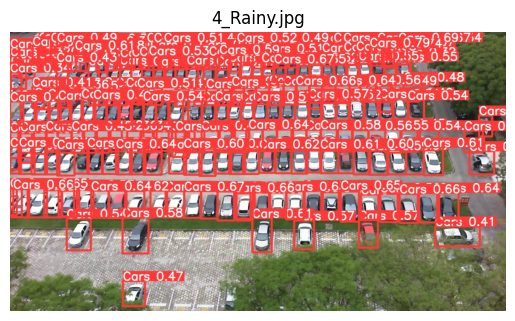

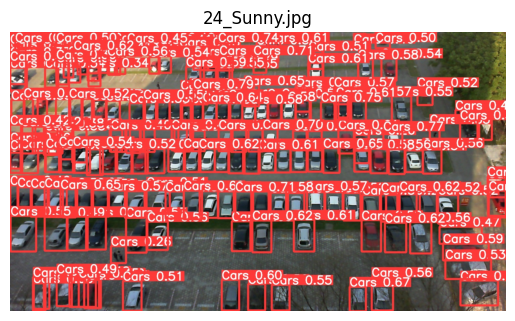

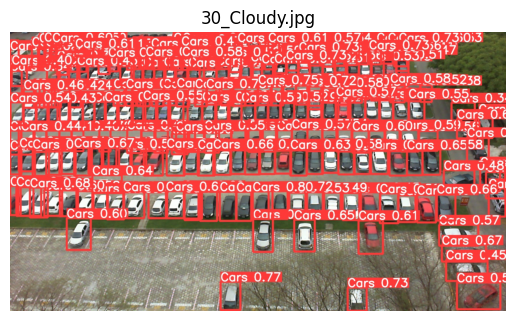

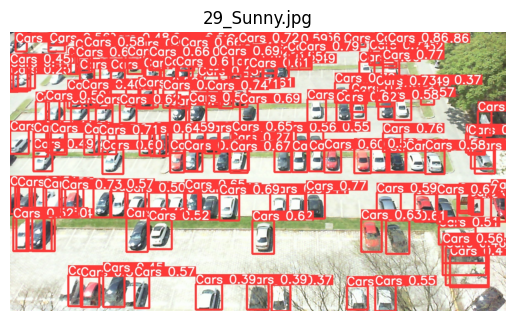

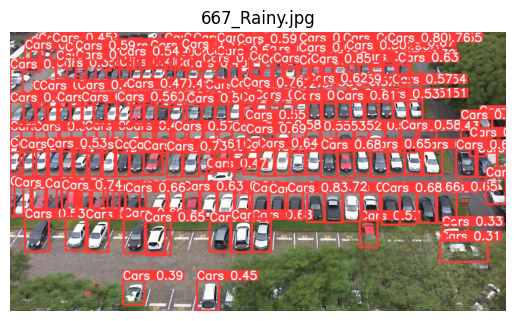

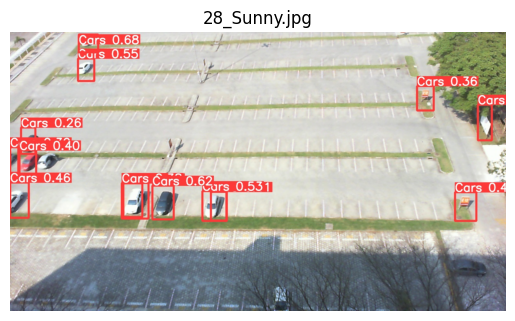

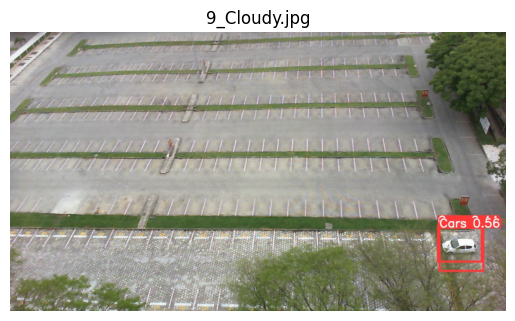

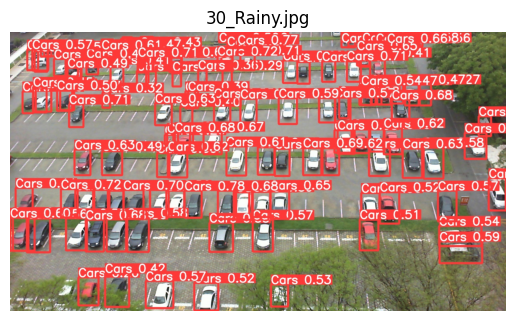

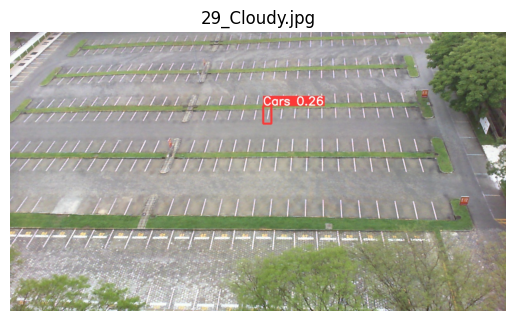

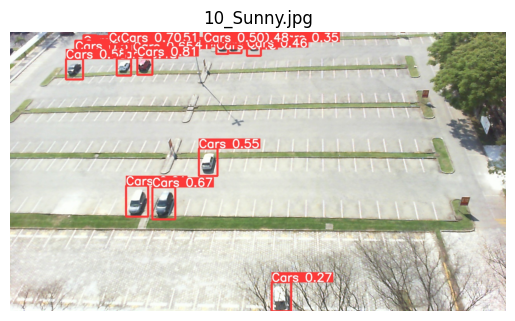

In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

def display_images_from_folder(folder_path, limit=15):
    # Get a list of files in the folder
    files = os.listdir(folder_path)

    # Filter out non-image files if needed
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # Limit the number of displayed images
    image_files = image_files[:limit]

    # Display each image
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = imread(image_path)
        plt.imshow(image)
        plt.title(image_file)
        plt.axis('off')  # Hide axis
        plt.show()

# Example usage
folder_path = "/content/runs/detect/predict"
display_images_from_folder(folder_path, limit=10)



In [ ]:
import os
import re

def parse_yolov8_output(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            match = re.search(r'\d+\sCars', parts[1])
            if match:
                num_cars = int(match.group(0).split(' ')[0])
                predictions[os.path.basename(image_path)] = num_cars
    return predictions

def write_predictions_to_file(predictions, output_file):
    with open(output_file, 'w') as f:
        for image_name, count in predictions.items():
            f.write(f"{image_name}: {count}\n")

# Example usage
yolov8_output = """
image 1/125 /content/datasets/PUCPR_devkit/data/Images/0_Cloudy.jpg: 384x640 3 Carss, 163.5ms
image 2/125 /content/datasets/PUCPR_devkit/data/Images/0_Rainy.jpg: 384x640 138 Carss, 7.2ms
image 3/125 /content/datasets/PUCPR_devkit/data/Images/0_Sunny.jpg: 384x640 201 Carss, 6.4ms
image 4/125 /content/datasets/PUCPR_devkit/data/Images/1063_Cloudy.jpg: 384x640 300 Carss, 7.6ms
image 5/125 /content/datasets/PUCPR_devkit/data/Images/1064_Cloudy.jpg: 384x640 7 Carss, 6.7ms
image 6/125 /content/datasets/PUCPR_devkit/data/Images/1065_Cloudy.jpg: 384x640 (no detections), 6.1ms
image 7/125 /content/datasets/PUCPR_devkit/data/Images/1066_Cloudy.jpg: 384x640 6 Carss, 6.1ms
image 8/125 /content/datasets/PUCPR_devkit/data/Images/1067_Cloudy.jpg: 384x640 10 Carss, 6.3ms
image 9/125 /content/datasets/PUCPR_devkit/data/Images/1068_Cloudy.jpg: 384x640 (no detections), 6.3ms
image 10/125 /content/datasets/PUCPR_devkit/data/Images/1069_Cloudy.jpg: 384x640 300 Carss, 6.0ms
image 11/125 /content/datasets/PUCPR_devkit/data/Images/1070_Cloudy.jpg: 384x640 300 Carss, 6.8ms
image 12/125 /content/datasets/PUCPR_devkit/data/Images/10_Cloudy.jpg: 384x640 3 Carss, 6.6ms
image 13/125 /content/datasets/PUCPR_devkit/data/Images/10_Rainy.jpg: 384x640 105 Carss, 6.2ms
image 14/125 /content/datasets/PUCPR_devkit/data/Images/10_Sunny.jpg: 384x640 26 Carss, 6.7ms
image 15/125 /content/datasets/PUCPR_devkit/data/Images/11_Cloudy.jpg: 384x640 185 Carss, 6.5ms
image 16/125 /content/datasets/PUCPR_devkit/data/Images/11_Rainy.jpg: 384x640 210 Carss, 7.9ms
image 17/125 /content/datasets/PUCPR_devkit/data/Images/11_Sunny.jpg: 384x640 300 Carss, 6.8ms
image 18/125 /content/datasets/PUCPR_devkit/data/Images/12_Cloudy.jpg: 384x640 12 Carss, 6.9ms
image 19/125 /content/datasets/PUCPR_devkit/data/Images/12_Rainy.jpg: 384x640 4 Carss, 7.1ms
image 20/125 /content/datasets/PUCPR_devkit/data/Images/12_Sunny.jpg: 384x640 230 Carss, 6.7ms
image 21/125 /content/datasets/PUCPR_devkit/data/Images/13_Cloudy.jpg: 384x640 2 Carss, 10.9ms
image 22/125 /content/datasets/PUCPR_devkit/data/Images/13_Rainy.jpg: 384x640 168 Carss, 6.7ms
image 23/125 /content/datasets/PUCPR_devkit/data/Images/13_Sunny.jpg: 384x640 25 Carss, 6.8ms
image 24/125 /content/datasets/PUCPR_devkit/data/Images/14_Cloudy.jpg: 384x640 300 Carss, 6.8ms
image 25/125 /content/datasets/PUCPR_devkit/data/Images/14_Rainy.jpg: 384x640 300 Carss, 6.7ms
image 26/125 /content/datasets/PUCPR_devkit/data/Images/14_Sunny.jpg: 384x640 5 Carss, 6.4ms
image 27/125 /content/datasets/PUCPR_devkit/data/Images/15_Cloudy.jpg: 384x640 (no detections), 6.8ms
image 28/125 /content/datasets/PUCPR_devkit/data/Images/15_Rainy.jpg: 384x640 300 Carss, 6.2ms
image 29/125 /content/datasets/PUCPR_devkit/data/Images/15_Sunny.jpg: 384x640 300 Carss, 6.6ms
image 30/125 /content/datasets/PUCPR_devkit/data/Images/16_Cloudy.jpg: 384x640 195 Carss, 6.7ms
image 31/125 /content/datasets/PUCPR_devkit/data/Images/16_Rainy.jpg: 384x640 204 Carss, 6.8ms
image 32/125 /content/datasets/PUCPR_devkit/data/Images/16_Sunny.jpg: 384x640 1 Cars, 6.6ms
image 33/125 /content/datasets/PUCPR_devkit/data/Images/17_Cloudy.jpg: 384x640 174 Carss, 7.1ms
image 34/125 /content/datasets/PUCPR_devkit/data/Images/17_Rainy.jpg: 384x640 269 Carss, 6.5ms
image 35/125 /content/datasets/PUCPR_devkit/data/Images/17_Sunny.jpg: 384x640 300 Carss, 6.5ms
image 36/125 /content/datasets/PUCPR_devkit/data/Images/1852_Sunny.jpg: 384x640 244 Carss, 9.9ms
image 37/125 /content/datasets/PUCPR_devkit/data/Images/1853_Sunny.jpg: 384x640 300 Carss, 6.6ms
image 38/125 /content/datasets/PUCPR_devkit/data/Images/1854_Sunny.jpg: 384x640 300 Carss, 6.7ms
image 39/125 /content/datasets/PUCPR_devkit/data/Images/1855_Sunny.jpg: 384x640 137 Carss, 7.9ms
image 40/125 /content/datasets/PUCPR_devkit/data/Images/1856_Sunny.jpg: 384x640 50 Carss, 6.6ms
image 41/125 /content/datasets/PUCPR_devkit/data/Images/1857_Sunny.jpg: 384x640 1 Cars, 7.1ms
image 42/125 /content/datasets/PUCPR_devkit/data/Images/1858_Sunny.jpg: 384x640 58 Carss, 6.8ms
image 43/125 /content/datasets/PUCPR_devkit/data/Images/1859_Sunny.jpg: 384x640 128 Carss, 6.3ms
image 44/125 /content/datasets/PUCPR_devkit/data/Images/18_Cloudy.jpg: 384x640 1 Cars, 6.6ms
image 45/125 /content/datasets/PUCPR_devkit/data/Images/18_Rainy.jpg: 384x640 279 Carss, 6.3ms
image 46/125 /content/datasets/PUCPR_devkit/data/Images/18_Sunny.jpg: 384x640 209 Carss, 6.8ms
image 47/125 /content/datasets/PUCPR_devkit/data/Images/19_Cloudy.jpg: 384x640 251 Carss, 8.3ms
image 48/125 /content/datasets/PUCPR_devkit/data/Images/19_Rainy.jpg: 384x640 300 Carss, 6.9ms
image 49/125 /content/datasets/PUCPR_devkit/data/Images/19_Sunny.jpg: 384x640 170 Carss, 6.8ms
image 50/125 /content/datasets/PUCPR_devkit/data/Images/1_Cloudy.jpg: 384x640 9 Carss, 6.5ms
image 51/125 /content/datasets/PUCPR_devkit/data/Images/1_Rainy.jpg: 384x640 211 Carss, 6.7ms
image 52/125 /content/datasets/PUCPR_devkit/data/Images/1_Sunny.jpg: 384x640 4 Carss, 11.5ms
image 53/125 /content/datasets/PUCPR_devkit/data/Images/20_Cloudy.jpg: 384x640 230 Carss, 7.4ms
image 54/125 /content/datasets/PUCPR_devkit/data/Images/20_Rainy.jpg: 384x640 195 Carss, 6.6ms
image 55/125 /content/datasets/PUCPR_devkit/data/Images/20_Sunny.jpg: 384x640 138 Carss, 7.0ms
image 56/125 /content/datasets/PUCPR_devkit/data/Images/21_Cloudy.jpg: 384x640 2 Carss, 7.4ms
image 57/125 /content/datasets/PUCPR_devkit/data/Images/21_Rainy.jpg: 384x640 300 Carss, 10.7ms
image 58/125 /content/datasets/PUCPR_devkit/data/Images/21_Sunny.jpg: 384x640 300 Carss, 7.0ms
image 59/125 /content/datasets/PUCPR_devkit/data/Images/22_Cloudy.jpg: 384x640 194 Carss, 6.5ms
image 60/125 /content/datasets/PUCPR_devkit/data/Images/22_Rainy.jpg: 384x640 173 Carss, 6.5ms
image 61/125 /content/datasets/PUCPR_devkit/data/Images/22_Sunny.jpg: 384x640 6 Carss, 6.5ms
image 62/125 /content/datasets/PUCPR_devkit/data/Images/23_Cloudy.jpg: 384x640 137 Carss, 6.4ms
image 63/125 /content/datasets/PUCPR_devkit/data/Images/23_Rainy.jpg: 384x640 16 Carss, 6.5ms
image 64/125 /content/datasets/PUCPR_devkit/data/Images/23_Sunny.jpg: 384x640 190 Carss, 6.2ms
image 65/125 /content/datasets/PUCPR_devkit/data/Images/24_Cloudy.jpg: 384x640 1 Cars, 6.4ms
image 66/125 /content/datasets/PUCPR_devkit/data/Images/24_Rainy.jpg: 384x640 300 Carss, 6.1ms
image 67/125 /content/datasets/PUCPR_devkit/data/Images/24_Sunny.jpg: 384x640 229 Carss, 25.7ms
image 68/125 /content/datasets/PUCPR_devkit/data/Images/25_Cloudy.jpg: 384x640 53 Carss, 6.9ms
image 69/125 /content/datasets/PUCPR_devkit/data/Images/25_Rainy.jpg: 384x640 6 Carss, 6.6ms
image 70/125 /content/datasets/PUCPR_devkit/data/Images/25_Sunny.jpg: 384x640 300 Carss, 6.5ms
image 71/125 /content/datasets/PUCPR_devkit/data/Images/26_Cloudy.jpg: 384x640 8 Carss, 7.1ms
image 72/125 /content/datasets/PUCPR_devkit/data/Images/26_Rainy.jpg: 384x640 217 Carss, 7.9ms
image 73/125 /content/datasets/PUCPR_devkit/data/Images/26_Sunny.jpg: 384x640 47 Carss, 6.4ms
image 74/125 /content/datasets/PUCPR_devkit/data/Images/27_Cloudy.jpg: 384x640 300 Carss, 6.4ms
image 75/125 /content/datasets/PUCPR_devkit/data/Images/27_Rainy.jpg: 384x640 300 Carss, 6.9ms
image 76/125 /content/datasets/PUCPR_devkit/data/Images/27_Sunny.jpg: 384x640 (no detections), 9.6ms
image 77/125 /content/datasets/PUCPR_devkit/data/Images/28_Cloudy.jpg: 384x640 (no detections), 9.0ms
image 78/125 /content/datasets/PUCPR_devkit/data/Images/28_Rainy.jpg: 384x640 34 Carss, 12.3ms
image 79/125 /content/datasets/PUCPR_devkit/data/Images/28_Sunny.jpg: 384x640 14 Carss, 11.2ms
image 80/125 /content/datasets/PUCPR_devkit/data/Images/29_Cloudy.jpg: 384x640 1 Cars, 8.7ms
image 81/125 /content/datasets/PUCPR_devkit/data/Images/29_Rainy.jpg: 384x640 265 Carss, 58.7ms
image 82/125 /content/datasets/PUCPR_devkit/data/Images/29_Sunny.jpg: 384x640 212 Carss, 9.4ms
image 83/125 /content/datasets/PUCPR_devkit/data/Images/2_Cloudy.jpg: 384x640 300 Carss, 12.5ms
image 84/125 /content/datasets/PUCPR_devkit/data/Images/2_Rainy.jpg: 384x640 270 Carss, 10.2ms
image 85/125 /content/datasets/PUCPR_devkit/data/Images/2_Sunny.jpg: 384x640 (no detections), 14.6ms
image 86/125 /content/datasets/PUCPR_devkit/data/Images/30_Cloudy.jpg: 384x640 300 Carss, 8.6ms
image 87/125 /content/datasets/PUCPR_devkit/data/Images/30_Rainy.jpg: 384x640 133 Carss, 8.7ms
image 88/125 /content/datasets/PUCPR_devkit/data/Images/30_Sunny.jpg: 384x640 225 Carss, 8.6ms
image 89/125 /content/datasets/PUCPR_devkit/data/Images/31_Cloudy.jpg: 384x640 (no detections), 8.6ms
image 90/125 /content/datasets/PUCPR_devkit/data/Images/31_Rainy.jpg: 384x640 224 Carss, 8.3ms
image 91/125 /content/datasets/PUCPR_devkit/data/Images/31_Sunny.jpg: 384x640 50 Carss, 13.0ms
image 92/125 /content/datasets/PUCPR_devkit/data/Images/32_Cloudy.jpg: 384x640 1 Cars, 9.4ms
image 93/125 /content/datasets/PUCPR_devkit/data/Images/32_Rainy.jpg: 384x640 269 Carss, 9.2ms
image 94/125 /content/datasets/PUCPR_devkit/data/Images/32_Sunny.jpg: 384x640 1 Cars, 11.5ms
image 95/125 /content/datasets/PUCPR_devkit/data/Images/33_Cloudy.jpg: 384x640 (no detections), 11.7ms
image 96/125 /content/datasets/PUCPR_devkit/data/Images/3_Cloudy.jpg: 384x640 4 Carss, 13.6ms
image 97/125 /content/datasets/PUCPR_devkit/data/Images/3_Rainy.jpg: 384x640 65 Carss, 11.9ms
image 98/125 /content/datasets/PUCPR_devkit/data/Images/3_Sunny.jpg: 384x640 158 Carss, 6.9ms
image 99/125 /content/datasets/PUCPR_devkit/data/Images/4_Cloudy.jpg: 384x640 7 Carss, 6.7ms
image 100/125 /content/datasets/PUCPR_devkit/data/Images/4_Rainy.jpg: 384x640 300 Carss, 6.1ms
image 101/125 /content/datasets/PUCPR_devkit/data/Images/4_Sunny.jpg: 384x640 146 Carss, 7.3ms
image 102/125 /content/datasets/PUCPR_devkit/data/Images/5_Cloudy.jpg: 384x640 1 Cars, 7.2ms
image 103/125 /content/datasets/PUCPR_devkit/data/Images/5_Rainy.jpg: 384x640 300 Carss, 6.9ms
image 104/125 /content/datasets/PUCPR_devkit/data/Images/5_Sunny.jpg: 384x640 213 Carss, 6.6ms
image 105/125 /content/datasets/PUCPR_devkit/data/Images/665_Rainy.jpg: 384x640 160 Carss, 6.2ms
image 106/125 /content/datasets/PUCPR_devkit/data/Images/666_Rainy.jpg: 384x640 126 Carss, 6.5ms
image 107/125 /content/datasets/PUCPR_devkit/data/Images/667_Rainy.jpg: 384x640 300 Carss, 6.2ms
image 108/125 /content/datasets/PUCPR_devkit/data/Images/668_Rainy.jpg: 384x640 31 Carss, 6.3ms
image 109/125 /content/datasets/PUCPR_devkit/data/Images/669_Rainy.jpg: 384x640 270 Carss, 10.3ms
image 110/125 /content/datasets/PUCPR_devkit/data/Images/670_Rainy.jpg: 384x640 300 Carss, 6.5ms
image 111/125 /content/datasets/PUCPR_devkit/data/Images/671_Rainy.jpg: 384x640 300 Carss, 6.8ms
image 112/125 /content/datasets/PUCPR_devkit/data/Images/672_Rainy.jpg: 384x640 300 Carss, 7.6ms
image 113/125 /content/datasets/PUCPR_devkit/data/Images/673_Rainy.jpg: 384x640 300 Carss, 6.7ms
image 114/125 /content/datasets/PUCPR_devkit/data/Images/6_Cloudy.jpg: 384x640 199 Carss, 6.8ms
image 115/125 /content/datasets/PUCPR_devkit/data/Images/6_Rainy.jpg: 384x640 187 Carss, 7.7ms
image 116/125 /content/datasets/PUCPR_devkit/data/Images/6_Sunny.jpg: 384x640 300 Carss, 6.2ms
image 117/125 /content/datasets/PUCPR_devkit/data/Images/7_Cloudy.jpg: 384x640 229 Carss, 6.8ms
image 118/125 /content/datasets/PUCPR_devkit/data/Images/7_Rainy.jpg: 384x640 57 Carss, 8.6ms
image 119/125 /content/datasets/PUCPR_devkit/data/Images/7_Sunny.jpg: 384x640 145 Carss, 7.3ms
image 120/125 /content/datasets/PUCPR_devkit/data/Images/8_Cloudy.jpg: 384x640 41 Carss, 6.5ms
image 121/125 /content/datasets/PUCPR_devkit/data/Images/8_Rainy.jpg: 384x640 300 Carss, 6.7ms
image 122/125 /content/datasets/PUCPR_devkit/data/Images/8_Sunny.jpg: 384x640 180 Carss, 6.8ms
image 123/125 /content/datasets/PUCPR_devkit/data/Images/9_Cloudy.jpg: 384x640 2 Carss, 6.7ms
image 124/125 /content/datasets/PUCPR_devkit/data/Images/9_Rainy.jpg: 384x640 229 Carss, 6.3ms
image 125/125 /content/datasets/PUCPR_devkit/data/Images/9_Sunny.jpg: 384x640 300 Carss, 6.5ms
"""

predictions = parse_yolov8_output(yolov8_output)
write_predictions_to_file(predictions, 'yolov8_predictions.txt')


In [ ]:
import os

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            lines = f.readlines()
        annotations[filename] = len(lines)
    return annotations

def create_ground_truth_file(annotations, output_file):
    with open(output_file, 'w') as f:
        for filename, num_annotations in annotations.items():
            f.write(f"{filename}: {num_annotations}\n")
    print(f"Ground truth file created: {output_file}")

# Example usage
annotations_dir = '/content/datasets/PUCPR_devkit/data/Annotations'
output_file = 'ground_truth2.txt'

ground_truth_annotations = parse_ground_truth_annotations(annotations_dir)
create_ground_truth_file(ground_truth_annotations, output_file)


Ground truth file created: ground_truth2.txt


RMSE and MAE for PUCPR

In [ ]:
import os
import numpy as np
import re

def parse_yolov8_predictions(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            num_cars = int(parts[1].strip())
            predictions[os.path.basename(image_path)] = num_cars
    return predictions

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            num_cars = sum(1 for _ in f)  # Count the lines in the file to get the number of cars
        annotations[filename.replace('.txt', '.jpg')] = num_cars
    return annotations

def create_comparison_file(yolo_predictions, ground_truth_annotations, output_file):
    with open(output_file, 'w') as f:
        f.write("Image Name\tYolo Prediction\tGround Truth\n")
        for image_name, yolo_count in yolo_predictions.items():
            gt_count = ground_truth_annotations.get(image_name, 'N/A')
            f.write(f"{image_name}\t{yolo_count}\t{gt_count}\n")

# Example usage
predictions_file = '/content/predictions_pucpr.txt'
ground_truth_dir = '/content/datasets/PUCPR_devkit/data/Annotations'
comparison_file = '/content/comparison_pucpr.txt'

yolov8_predictions = parse_yolov8_predictions(open(predictions_file).read())
ground_truth_annotations = parse_ground_truth_annotations(ground_truth_dir)

create_comparison_file(yolov8_predictions, ground_truth_annotations, comparison_file)
print("Comparison file created:", comparison_file)


Comparison file created: /content/comparison_pucpr.txt


In [ ]:
import os
import numpy as np
import re

def parse_yolov8_predictions(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            num_cars = int(parts[1].strip())
            predictions[os.path.basename(image_path)] = num_cars
    return predictions

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            num_cars = sum(1 for _ in f)  # Count the lines in the file to get the number of cars
        annotations[filename.replace('.txt', '.jpg')] = num_cars
    return annotations

def calculate_mae_rmse(predictions, ground_truth):
    mae_values = {}
    rmse_values = {}
    for image_name, yolo_prediction in predictions.items():
        ground_truth_count = ground_truth.get(image_name, 0)
        absolute_error = np.abs(yolo_prediction - ground_truth_count)
        square_error = (yolo_prediction - ground_truth_count) ** 2
        mae_values[image_name] = absolute_error
        rmse_values[image_name] = square_error
    mae = np.mean(list(mae_values.values()))
    rmse = np.sqrt(np.mean(list(rmse_values.values())))
    return mae, rmse, mae_values, rmse_values

# Example usage
predictions_file = '/content/predictions_pucpr.txt'
ground_truth_dir = '/content/datasets/PUCPR_devkit/data/Annotations'


yolov8_predictions = parse_yolov8_predictions(open(predictions_file).read())
ground_truth_annotations = parse_ground_truth_annotations(ground_truth_dir)

mae, rmse, mae_values, rmse_values = calculate_mae_rmse(yolov8_predictions, ground_truth_annotations)

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)

print("\nIndividual MAE and RMSE for each image:")
for image_name, mae_value in mae_values.items():
    print(f"Image: {image_name}, Ground Truth: {ground_truth_annotations.get(image_name, 0)}, Predictions: {yolov8_predictions.get(image_name, 0)}, MAE: {mae_value}, RMSE: {rmse_values[image_name]}")


Mean Absolute Error (MAE): 18.82051282051282
Root Mean Square Error (RMSE): 24.804190437260058

Individual MAE and RMSE for each image:
Image: 0_Cloudy.jpg, Ground Truth: 3, Predictions: 3, MAE: 0, RMSE: 0
Image: 0_Rainy.jpg, Ground Truth: 123, Predictions: 138, MAE: 15, RMSE: 225
Image: 0_Sunny.jpg, Ground Truth: 161, Predictions: 201, MAE: 40, RMSE: 1600
Image: 1063_Cloudy.jpg, Ground Truth: 295, Predictions: 300, MAE: 5, RMSE: 25
Image: 1064_Cloudy.jpg, Ground Truth: 8, Predictions: 7, MAE: 1, RMSE: 1
Image: 1066_Cloudy.jpg, Ground Truth: 8, Predictions: 6, MAE: 2, RMSE: 4
Image: 1067_Cloudy.jpg, Ground Truth: 13, Predictions: 10, MAE: 3, RMSE: 9
Image: 1069_Cloudy.jpg, Ground Truth: 292, Predictions: 300, MAE: 8, RMSE: 64
Image: 1070_Cloudy.jpg, Ground Truth: 291, Predictions: 300, MAE: 9, RMSE: 81
Image: 10_Cloudy.jpg, Ground Truth: 1, Predictions: 3, MAE: 2, RMSE: 4
Image: 10_Rainy.jpg, Ground Truth: 84, Predictions: 105, MAE: 21, RMSE: 441
Image: 10_Sunny.jpg, Ground Truth: 24, 

###CarPK dataset

In [ ]:
#NMS function to get the best conf_thres and iou_thres

import os
import numpy as np

# Function to parse ground truth text files and count objects
def count_objects_from_txt(txt_file):
    with open(txt_file, 'r') as file:
        return len(file.readlines())

# Function to parse YOLO predictions and count objects
def parse_yolo_predictions(txt_file):
    predictions = {}
    with open(txt_file, 'r') as file:
        for line in file:
            image_name, count = line.strip().split(': ')
            predictions[image_name] = int(count)
    return predictions

# Function to evaluate predictions and return the Mean Absolute Error (MAE)
def evaluate_predictions(results_file, ground_truth_dir):
    gt_files = sorted(os.listdir(ground_truth_dir))
    ground_truth_counts = {}
    for gt_file in gt_files:
        image_name = gt_file.replace('.txt', '.png')
        ground_truth_counts[image_name] = count_objects_from_txt(os.path.join(ground_truth_dir, gt_file))

    predictions = parse_yolo_predictions(results_file)

    y_true = []
    y_pred = []

    for image_name, gt_count in ground_truth_counts.items():
        if image_name in predictions:
            y_true.append(gt_count)
            y_pred.append(predictions[image_name])
        else:
            y_true.append(gt_count)
            y_pred.append(0)

    # Calculate mean absolute error
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mae = np.mean(np.abs(y_true - y_pred))
    return mae

# Ranges of confidence and IoU thresholds to test
conf_thres_values = [0.1, 0.3, 0.5, 0.7]
iou_thres_values = [0.2, 0.3, 0.4, 0.5]

# Initialize best thresholds and MAE score
best_conf_thres = 0.5
best_iou_thres = 0.4
best_mae = float('inf')

# Iterate over each combination of thresholds
for conf_thres in conf_thres_values:
    for iou_thres in iou_thres_values:
        # Run predictions with the current thresholds
        os.system(f"yolo detect predict model='/content/carpk30_400e.pt' source='/content/datasets/CARPK_devkit/data/Images' conf={conf_thres} iou={iou_thres} save_txt=True save_conf=True project='results' name='conf_{conf_thres}_iou_{iou_thres}'")

        # Path to the results file (adjust path according to your setup)
        results_file = f"/content/predictions_carpk30_400.txt"

        # Evaluate predictions and get MAE score
        mae_score = evaluate_predictions(results_file, ground_truth_dir="/content/datasets/CARPK_devkit/data/Annotations")

        # Update best thresholds if current MAE is better (lower)
        if mae_score < best_mae:
            best_mae = mae_score
            best_conf_thres = conf_thres
            best_iou_thres = iou_thres

print(f'Best conf_thres: {best_conf_thres}, Best iou_thres: {best_iou_thres}, Best MAE: {best_mae}')


Best conf_thres: 0.1, Best iou_thres: 0.2, Best MAE: 7.401243093922652


In [ ]:
!yolo predict model='/content/carpk_20_400e.pt' source='/content/datasets/CARPK_devkit/data/Images' conf=0.1 iou=0.2

Ultralytics YOLOv8.2.19 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00001.png: 384x640 3 Carss, 150.1ms
image 2/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00002.png: 384x640 3 Carss, 6.4ms
image 3/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00003.png: 384x640 2 Carss, 6.2ms
image 4/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00004.png: 384x640 2 Carss, 8.4ms
image 5/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00005.png: 384x640 8 Carss, 6.7ms
image 6/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00006.png: 384x640 1 Cars, 6.2ms
image 7/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00007.png: 384x640 2 Carss, 7.5ms
image 8/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00008.png: 384x640 12 Carss, 6.4ms
image 9

In [ ]:
import os
import re

def parse_yolov8_output(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            match = re.search(r'\d+\sCars', parts[1])
            if match:
                num_cars = int(match.group(0).split(' ')[0])
                predictions[os.path.basename(image_path)] = num_cars
    return predictions

def write_predictions_to_file(predictions, output_file):
    with open(output_file, 'w') as f:
        for image_name, count in predictions.items():
            f.write(f"{image_name}: {count}\n")

# Example usage
yolov8_output = """
image 1/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00001.png: 384x640 3 Carss, 150.1ms
image 2/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00002.png: 384x640 3 Carss, 6.4ms
image 3/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00003.png: 384x640 2 Carss, 6.2ms
image 4/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00004.png: 384x640 2 Carss, 8.4ms
image 5/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00005.png: 384x640 8 Carss, 6.7ms
image 6/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00006.png: 384x640 1 Cars, 6.2ms
image 7/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00007.png: 384x640 2 Carss, 7.5ms
image 8/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00008.png: 384x640 12 Carss, 6.4ms
image 9/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00009.png: 384x640 23 Carss, 6.0ms
image 10/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00010.png: 384x640 34 Carss, 6.6ms
image 11/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00011.png: 384x640 42 Carss, 6.4ms
image 12/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00012.png: 384x640 47 Carss, 6.4ms
image 13/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00013.png: 384x640 48 Carss, 6.7ms
image 14/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00014.png: 384x640 46 Carss, 6.4ms
image 15/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00015.png: 384x640 40 Carss, 6.2ms
image 16/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00016.png: 384x640 43 Carss, 6.2ms
image 17/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00017.png: 384x640 51 Carss, 8.2ms
image 18/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00018.png: 384x640 53 Carss, 6.8ms
image 19/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00019.png: 384x640 56 Carss, 7.2ms
image 20/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00020.png: 384x640 59 Carss, 7.1ms
image 21/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00021.png: 384x640 49 Carss, 8.1ms
image 22/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00022.png: 384x640 42 Carss, 6.1ms
image 23/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00023.png: 384x640 39 Carss, 6.2ms
image 24/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00024.png: 384x640 34 Carss, 7.8ms
image 25/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00025.png: 384x640 35 Carss, 6.4ms
image 26/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00026.png: 384x640 35 Carss, 6.6ms
image 27/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00027.png: 384x640 36 Carss, 6.6ms
image 28/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00028.png: 384x640 41 Carss, 6.4ms
image 29/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00029.png: 384x640 41 Carss, 6.4ms
image 30/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00030.png: 384x640 28 Carss, 7.9ms
image 31/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00031.png: 384x640 18 Carss, 9.4ms
image 32/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00032.png: 384x640 13 Carss, 6.9ms
image 33/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00033.png: 384x640 12 Carss, 7.1ms
image 34/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00034.png: 384x640 10 Carss, 6.8ms
image 35/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00035.png: 384x640 10 Carss, 6.8ms
image 36/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00036.png: 384x640 13 Carss, 6.6ms
image 37/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00037.png: 384x640 14 Carss, 6.4ms
image 38/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00038.png: 384x640 18 Carss, 6.9ms
image 39/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00039.png: 384x640 21 Carss, 6.6ms
image 40/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00040.png: 384x640 26 Carss, 6.3ms
image 41/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00041.png: 384x640 29 Carss, 6.9ms
image 42/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00042.png: 384x640 32 Carss, 6.6ms
image 43/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00043.png: 384x640 32 Carss, 7.6ms
image 44/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00044.png: 384x640 29 Carss, 6.4ms
image 45/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00045.png: 384x640 28 Carss, 6.7ms
image 46/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00046.png: 384x640 26 Carss, 6.3ms
image 47/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00047.png: 384x640 29 Carss, 6.2ms
image 48/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00048.png: 384x640 32 Carss, 6.6ms
image 49/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00049.png: 384x640 34 Carss, 6.7ms
image 50/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00050.png: 384x640 38 Carss, 6.3ms
image 51/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00051.png: 384x640 41 Carss, 6.3ms
image 52/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00052.png: 384x640 58 Carss, 6.9ms
image 53/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00053.png: 384x640 58 Carss, 6.6ms
image 54/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00054.png: 384x640 49 Carss, 6.5ms
image 55/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00055.png: 384x640 41 Carss, 6.7ms
image 56/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00056.png: 384x640 36 Carss, 6.7ms
image 57/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00057.png: 384x640 38 Carss, 8.5ms
image 58/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00058.png: 384x640 37 Carss, 8.1ms
image 59/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00059.png: 384x640 35 Carss, 6.6ms
image 60/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00060.png: 384x640 37 Carss, 6.6ms
image 61/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00061.png: 384x640 38 Carss, 6.5ms
image 62/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00062.png: 384x640 37 Carss, 7.0ms
image 63/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00063.png: 384x640 39 Carss, 6.7ms
image 64/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00064.png: 384x640 40 Carss, 9.0ms
image 65/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00065.png: 384x640 44 Carss, 6.8ms
image 66/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00066.png: 384x640 46 Carss, 6.1ms
image 67/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00067.png: 384x640 48 Carss, 6.4ms
image 68/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00068.png: 384x640 44 Carss, 6.6ms
image 69/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00069.png: 384x640 36 Carss, 6.3ms
image 70/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00070.png: 384x640 43 Carss, 6.8ms
image 71/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00071.png: 384x640 42 Carss, 6.5ms
image 72/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00072.png: 384x640 40 Carss, 6.6ms
image 73/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00073.png: 384x640 39 Carss, 8.5ms
image 74/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00074.png: 384x640 41 Carss, 7.2ms
image 75/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00075.png: 384x640 45 Carss, 6.7ms
image 76/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00076.png: 384x640 47 Carss, 11.4ms
image 77/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00077.png: 384x640 52 Carss, 6.8ms
image 78/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00078.png: 384x640 52 Carss, 6.7ms
image 79/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00079.png: 384x640 53 Carss, 6.5ms
image 80/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00080.png: 384x640 47 Carss, 6.5ms
image 81/1448 /content/datasets/CARPK_devkit/data/Images/20160331_NTU_00081.png: 384x640 44 Carss, 6.6ms
image 82/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00001.png: 384x640 23 Carss, 6.8ms
image 83/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00002.png: 384x640 22 Carss, 6.6ms
image 84/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00003.png: 384x640 22 Carss, 6.7ms
image 85/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00004.png: 384x640 22 Carss, 13.9ms
image 86/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00005.png: 384x640 24 Carss, 11.1ms
image 87/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00006.png: 384x640 34 Carss, 8.8ms
image 88/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00007.png: 384x640 33 Carss, 8.9ms
image 89/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00008.png: 384x640 33 Carss, 9.8ms
image 90/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00009.png: 384x640 32 Carss, 8.3ms
image 91/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00010.png: 384x640 35 Carss, 8.7ms
image 92/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00011.png: 384x640 36 Carss, 8.2ms
image 93/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00012.png: 384x640 34 Carss, 12.4ms
image 94/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00013.png: 384x640 34 Carss, 12.4ms
image 95/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00014.png: 384x640 35 Carss, 8.1ms
image 96/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00015.png: 384x640 34 Carss, 9.3ms
image 97/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00016.png: 384x640 32 Carss, 8.6ms
image 98/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00017.png: 384x640 34 Carss, 8.6ms
image 99/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00018.png: 384x640 35 Carss, 8.7ms
image 100/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00019.png: 384x640 34 Carss, 8.9ms
image 101/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00020.png: 384x640 34 Carss, 8.4ms
image 102/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00021.png: 384x640 35 Carss, 8.2ms
image 103/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00022.png: 384x640 33 Carss, 11.7ms
image 104/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00023.png: 384x640 34 Carss, 8.5ms
image 105/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00024.png: 384x640 34 Carss, 8.9ms
image 106/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00025.png: 384x640 33 Carss, 11.1ms
image 107/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00026.png: 384x640 32 Carss, 9.9ms
image 108/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00027.png: 384x640 32 Carss, 9.7ms
image 109/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00028.png: 384x640 33 Carss, 11.2ms
image 110/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00029.png: 384x640 34 Carss, 11.7ms
image 111/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00030.png: 384x640 34 Carss, 14.5ms
image 112/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00031.png: 384x640 33 Carss, 7.4ms
image 113/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00032.png: 384x640 32 Carss, 6.8ms
image 114/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00033.png: 384x640 32 Carss, 6.9ms
image 115/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00034.png: 384x640 35 Carss, 7.6ms
image 116/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00035.png: 384x640 33 Carss, 6.8ms
image 117/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00036.png: 384x640 37 Carss, 6.7ms
image 118/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00037.png: 384x640 36 Carss, 7.5ms
image 119/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00038.png: 384x640 39 Carss, 11.2ms
image 120/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00039.png: 384x640 41 Carss, 6.8ms
image 121/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00040.png: 384x640 43 Carss, 7.0ms
image 122/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00041.png: 384x640 40 Carss, 7.4ms
image 123/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00042.png: 384x640 45 Carss, 6.8ms
image 124/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00043.png: 384x640 43 Carss, 7.3ms
image 125/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00044.png: 384x640 41 Carss, 6.7ms
image 126/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00045.png: 384x640 43 Carss, 6.8ms
image 127/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00046.png: 384x640 45 Carss, 6.7ms
image 128/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00047.png: 384x640 44 Carss, 6.7ms
image 129/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00048.png: 384x640 44 Carss, 6.2ms
image 130/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00049.png: 384x640 43 Carss, 6.3ms
image 131/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00050.png: 384x640 45 Carss, 7.0ms
image 132/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00051.png: 384x640 44 Carss, 10.0ms
image 133/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00052.png: 384x640 43 Carss, 6.6ms
image 134/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00053.png: 384x640 43 Carss, 6.7ms
image 135/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00054.png: 384x640 40 Carss, 10.9ms
image 136/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00055.png: 384x640 40 Carss, 6.5ms
image 137/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00056.png: 384x640 40 Carss, 6.2ms
image 138/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00057.png: 384x640 42 Carss, 6.6ms
image 139/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00058.png: 384x640 40 Carss, 6.6ms
image 140/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00059.png: 384x640 45 Carss, 6.4ms
image 141/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00060.png: 384x640 38 Carss, 6.4ms
image 142/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00061.png: 384x640 40 Carss, 6.5ms
image 143/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00062.png: 384x640 40 Carss, 6.4ms
image 144/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00063.png: 384x640 40 Carss, 8.8ms
image 145/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00064.png: 384x640 38 Carss, 8.2ms
image 146/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00065.png: 384x640 35 Carss, 9.5ms
image 147/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00066.png: 384x640 36 Carss, 6.5ms
image 148/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00067.png: 384x640 37 Carss, 6.6ms
image 149/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00068.png: 384x640 35 Carss, 6.6ms
image 150/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00069.png: 384x640 36 Carss, 6.8ms
image 151/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00070.png: 384x640 36 Carss, 6.6ms
image 152/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00071.png: 384x640 36 Carss, 6.7ms
image 153/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00072.png: 384x640 36 Carss, 6.0ms
image 154/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00073.png: 384x640 39 Carss, 8.3ms
image 155/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00074.png: 384x640 36 Carss, 6.5ms
image 156/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00075.png: 384x640 35 Carss, 6.3ms
image 157/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00076.png: 384x640 35 Carss, 6.8ms
image 158/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00077.png: 384x640 37 Carss, 6.8ms
image 159/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00078.png: 384x640 38 Carss, 6.6ms
image 160/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00079.png: 384x640 38 Carss, 6.7ms
image 161/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00080.png: 384x640 37 Carss, 6.4ms
image 162/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00081.png: 384x640 35 Carss, 8.0ms
image 163/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00082.png: 384x640 35 Carss, 6.5ms
image 164/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00083.png: 384x640 37 Carss, 6.1ms
image 165/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00084.png: 384x640 37 Carss, 6.3ms
image 166/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00085.png: 384x640 37 Carss, 14.8ms
image 167/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00086.png: 384x640 36 Carss, 7.7ms
image 168/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00087.png: 384x640 36 Carss, 6.5ms
image 169/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00088.png: 384x640 36 Carss, 6.4ms
image 170/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00089.png: 384x640 38 Carss, 6.3ms
image 171/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00090.png: 384x640 39 Carss, 6.4ms
image 172/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00091.png: 384x640 40 Carss, 6.5ms
image 173/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00092.png: 384x640 39 Carss, 6.2ms
image 174/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00093.png: 384x640 37 Carss, 7.0ms
image 175/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00094.png: 384x640 40 Carss, 12.5ms
image 176/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00095.png: 384x640 39 Carss, 7.2ms
image 177/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00096.png: 384x640 40 Carss, 6.9ms
image 178/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00097.png: 384x640 38 Carss, 6.6ms
image 179/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00098.png: 384x640 40 Carss, 6.3ms
image 180/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00099.png: 384x640 41 Carss, 7.3ms
image 181/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00100.png: 384x640 42 Carss, 6.6ms
image 182/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00101.png: 384x640 40 Carss, 6.5ms
image 183/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00102.png: 384x640 40 Carss, 7.2ms
image 184/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00103.png: 384x640 40 Carss, 6.5ms
image 185/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00104.png: 384x640 40 Carss, 6.3ms
image 186/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00105.png: 384x640 40 Carss, 6.6ms
image 187/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00106.png: 384x640 40 Carss, 6.5ms
image 188/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00107.png: 384x640 40 Carss, 6.4ms
image 189/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00108.png: 384x640 40 Carss, 6.7ms
image 190/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00109.png: 384x640 40 Carss, 7.5ms
image 191/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00110.png: 384x640 40 Carss, 6.7ms
image 192/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00111.png: 384x640 40 Carss, 6.5ms
image 193/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00112.png: 384x640 39 Carss, 6.7ms
image 194/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00113.png: 384x640 41 Carss, 6.9ms
image 195/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00114.png: 384x640 41 Carss, 6.7ms
image 196/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00115.png: 384x640 40 Carss, 7.0ms
image 197/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00116.png: 384x640 41 Carss, 6.5ms
image 198/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00117.png: 384x640 41 Carss, 6.9ms
image 199/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00118.png: 384x640 40 Carss, 14.1ms
image 200/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00119.png: 384x640 40 Carss, 14.6ms
image 201/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00120.png: 384x640 41 Carss, 9.8ms
image 202/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00121.png: 384x640 40 Carss, 11.2ms
image 203/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00122.png: 384x640 39 Carss, 8.3ms
image 204/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00123.png: 384x640 40 Carss, 8.5ms
image 205/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00124.png: 384x640 39 Carss, 8.1ms
image 206/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00125.png: 384x640 39 Carss, 8.5ms
image 207/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00126.png: 384x640 42 Carss, 11.8ms
image 208/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00127.png: 384x640 42 Carss, 8.1ms
image 209/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00128.png: 384x640 41 Carss, 8.5ms
image 210/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00129.png: 384x640 40 Carss, 8.7ms
image 211/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00130.png: 384x640 40 Carss, 9.1ms
image 212/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00131.png: 384x640 40 Carss, 8.6ms
image 213/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00132.png: 384x640 40 Carss, 8.1ms
image 214/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00133.png: 384x640 41 Carss, 8.2ms
image 215/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00134.png: 384x640 41 Carss, 8.3ms
image 216/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00135.png: 384x640 41 Carss, 9.2ms
image 217/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00136.png: 384x640 41 Carss, 12.9ms
image 218/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00137.png: 384x640 41 Carss, 8.4ms
image 219/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00138.png: 384x640 43 Carss, 9.5ms
image 220/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00139.png: 384x640 41 Carss, 16.7ms
image 221/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00140.png: 384x640 41 Carss, 9.7ms
image 222/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00141.png: 384x640 44 Carss, 11.4ms
image 223/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00142.png: 384x640 43 Carss, 10.8ms
image 224/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00143.png: 384x640 43 Carss, 10.7ms
image 225/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00144.png: 384x640 42 Carss, 12.1ms
image 226/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00145.png: 384x640 42 Carss, 6.4ms
image 227/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00146.png: 384x640 42 Carss, 7.0ms
image 228/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00147.png: 384x640 44 Carss, 10.8ms
image 229/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00148.png: 384x640 40 Carss, 6.7ms
image 230/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00149.png: 384x640 41 Carss, 6.7ms
image 231/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00150.png: 384x640 40 Carss, 6.3ms
image 232/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00151.png: 384x640 40 Carss, 6.5ms
image 233/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00152.png: 384x640 43 Carss, 6.9ms
image 234/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00153.png: 384x640 41 Carss, 7.1ms
image 235/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00154.png: 384x640 40 Carss, 6.5ms
image 236/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00155.png: 384x640 39 Carss, 6.7ms
image 237/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00156.png: 384x640 41 Carss, 6.5ms
image 238/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00157.png: 384x640 40 Carss, 6.8ms
image 239/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00158.png: 384x640 42 Carss, 6.5ms
image 240/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00159.png: 384x640 42 Carss, 6.6ms
image 241/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00160.png: 384x640 43 Carss, 6.6ms
image 242/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00161.png: 384x640 40 Carss, 6.6ms
image 243/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00162.png: 384x640 45 Carss, 7.8ms
image 244/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00163.png: 384x640 41 Carss, 7.1ms
image 245/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00164.png: 384x640 43 Carss, 6.6ms
image 246/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00165.png: 384x640 43 Carss, 6.7ms
image 247/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00166.png: 384x640 40 Carss, 6.4ms
image 248/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00167.png: 384x640 39 Carss, 6.4ms
image 249/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00168.png: 384x640 41 Carss, 6.3ms
image 250/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00169.png: 384x640 40 Carss, 6.5ms
image 251/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00170.png: 384x640 39 Carss, 6.5ms
image 252/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00171.png: 384x640 39 Carss, 6.5ms
image 253/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00172.png: 384x640 39 Carss, 6.9ms
image 254/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00173.png: 384x640 37 Carss, 10.9ms
image 255/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00174.png: 384x640 39 Carss, 6.6ms
image 256/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00175.png: 384x640 38 Carss, 6.6ms
image 257/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00176.png: 384x640 38 Carss, 6.4ms
image 258/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00177.png: 384x640 38 Carss, 6.3ms
image 259/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00178.png: 384x640 37 Carss, 6.7ms
image 260/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00179.png: 384x640 38 Carss, 6.3ms
image 261/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00180.png: 384x640 37 Carss, 6.9ms
image 262/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00181.png: 384x640 40 Carss, 7.0ms
image 263/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00182.png: 384x640 39 Carss, 6.8ms
image 264/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00183.png: 384x640 38 Carss, 8.5ms
image 265/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00184.png: 384x640 40 Carss, 6.7ms
image 266/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00185.png: 384x640 39 Carss, 6.6ms
image 267/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00186.png: 384x640 35 Carss, 7.6ms
image 268/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00187.png: 384x640 37 Carss, 6.6ms
image 269/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00188.png: 384x640 37 Carss, 6.6ms
image 270/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF1_00189.png: 384x640 22 Carss, 6.6ms
image 271/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00001.png: 384x640 27 Carss, 6.6ms
image 272/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00002.png: 384x640 28 Carss, 6.7ms
image 273/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00003.png: 384x640 27 Carss, 6.6ms
image 274/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00004.png: 384x640 26 Carss, 6.5ms
image 275/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00005.png: 384x640 25 Carss, 6.6ms
image 276/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00006.png: 384x640 26 Carss, 7.0ms
image 277/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00007.png: 384x640 28 Carss, 6.9ms
image 278/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00008.png: 384x640 29 Carss, 6.9ms
image 279/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00009.png: 384x640 29 Carss, 6.7ms
image 280/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00010.png: 384x640 31 Carss, 6.8ms
image 281/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00011.png: 384x640 32 Carss, 6.5ms
image 282/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00012.png: 384x640 33 Carss, 6.8ms
image 283/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00013.png: 384x640 33 Carss, 6.7ms
image 284/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00014.png: 384x640 32 Carss, 6.9ms
image 285/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00015.png: 384x640 33 Carss, 6.8ms
image 286/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00016.png: 384x640 34 Carss, 6.3ms
image 287/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00017.png: 384x640 34 Carss, 9.9ms
image 288/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00018.png: 384x640 33 Carss, 7.5ms
image 289/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00019.png: 384x640 34 Carss, 6.7ms
image 290/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00020.png: 384x640 33 Carss, 6.7ms
image 291/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00021.png: 384x640 33 Carss, 6.6ms
image 292/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00022.png: 384x640 34 Carss, 6.8ms
image 293/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00023.png: 384x640 42 Carss, 6.5ms
image 294/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00024.png: 384x640 52 Carss, 6.4ms
image 295/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00025.png: 384x640 64 Carss, 6.2ms
image 296/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00026.png: 384x640 65 Carss, 6.8ms
image 297/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00027.png: 384x640 69 Carss, 7.4ms
image 298/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00028.png: 384x640 69 Carss, 7.0ms
image 299/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00029.png: 384x640 72 Carss, 6.8ms
image 300/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00030.png: 384x640 78 Carss, 6.4ms
image 301/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00031.png: 384x640 77 Carss, 6.6ms
image 302/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00032.png: 384x640 78 Carss, 6.4ms
image 303/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00033.png: 384x640 80 Carss, 7.5ms
image 304/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00034.png: 384x640 78 Carss, 6.5ms
image 305/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00035.png: 384x640 78 Carss, 7.1ms
image 306/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00036.png: 384x640 77 Carss, 6.6ms
image 307/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00037.png: 384x640 74 Carss, 6.4ms
image 308/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00038.png: 384x640 75 Carss, 7.8ms
image 309/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00039.png: 384x640 75 Carss, 6.4ms
image 310/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00040.png: 384x640 73 Carss, 6.4ms
image 311/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00041.png: 384x640 74 Carss, 9.3ms
image 312/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00042.png: 384x640 89 Carss, 6.2ms
image 313/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00043.png: 384x640 79 Carss, 6.3ms
image 314/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00044.png: 384x640 85 Carss, 6.4ms
image 315/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00045.png: 384x640 85 Carss, 6.4ms
image 316/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00046.png: 384x640 85 Carss, 10.9ms
image 317/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00047.png: 384x640 86 Carss, 8.5ms
image 318/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00048.png: 384x640 86 Carss, 12.1ms
image 319/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00049.png: 384x640 86 Carss, 8.5ms
image 320/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00050.png: 384x640 71 Carss, 9.4ms
image 321/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00051.png: 384x640 53 Carss, 9.0ms
image 322/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00052.png: 384x640 60 Carss, 11.1ms
image 323/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00053.png: 384x640 63 Carss, 10.9ms
image 324/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00054.png: 384x640 64 Carss, 14.6ms
image 325/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00055.png: 384x640 64 Carss, 8.5ms
image 326/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00056.png: 384x640 61 Carss, 10.2ms
image 327/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00057.png: 384x640 63 Carss, 8.1ms
image 328/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00058.png: 384x640 63 Carss, 8.5ms
image 329/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00059.png: 384x640 63 Carss, 8.4ms
image 330/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00060.png: 384x640 61 Carss, 8.1ms
image 331/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00061.png: 384x640 61 Carss, 8.2ms
image 332/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00062.png: 384x640 61 Carss, 10.0ms
image 333/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00063.png: 384x640 61 Carss, 8.3ms
image 334/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00064.png: 384x640 61 Carss, 11.6ms
image 335/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00065.png: 384x640 62 Carss, 11.0ms
image 336/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00066.png: 384x640 63 Carss, 11.3ms
image 337/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00067.png: 384x640 60 Carss, 10.4ms
image 338/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00068.png: 384x640 58 Carss, 9.4ms
image 339/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00069.png: 384x640 59 Carss, 11.1ms
image 340/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00070.png: 384x640 58 Carss, 14.5ms
image 341/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00071.png: 384x640 57 Carss, 6.6ms
image 342/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00072.png: 384x640 58 Carss, 6.3ms
image 343/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00073.png: 384x640 56 Carss, 6.4ms
image 344/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00074.png: 384x640 56 Carss, 6.1ms
image 345/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00075.png: 384x640 54 Carss, 6.3ms
image 346/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00076.png: 384x640 51 Carss, 6.5ms
image 347/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00077.png: 384x640 50 Carss, 6.5ms
image 348/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00078.png: 384x640 50 Carss, 6.4ms
image 349/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00079.png: 384x640 47 Carss, 8.6ms
image 350/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00080.png: 384x640 45 Carss, 6.3ms
image 351/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00081.png: 384x640 44 Carss, 9.1ms
image 352/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00082.png: 384x640 44 Carss, 6.4ms
image 353/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00083.png: 384x640 45 Carss, 6.1ms
image 354/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00084.png: 384x640 48 Carss, 6.2ms
image 355/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00085.png: 384x640 49 Carss, 6.5ms
image 356/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00086.png: 384x640 51 Carss, 9.4ms
image 357/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00087.png: 384x640 52 Carss, 6.4ms
image 358/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00088.png: 384x640 55 Carss, 7.7ms
image 359/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00089.png: 384x640 59 Carss, 7.4ms
image 360/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00090.png: 384x640 61 Carss, 6.5ms
image 361/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00091.png: 384x640 59 Carss, 6.2ms
image 362/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00092.png: 384x640 59 Carss, 6.6ms
image 363/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00093.png: 384x640 61 Carss, 7.2ms
image 364/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00094.png: 384x640 62 Carss, 7.2ms
image 365/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00095.png: 384x640 61 Carss, 6.7ms
image 366/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00096.png: 384x640 63 Carss, 7.1ms
image 367/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00097.png: 384x640 64 Carss, 6.4ms
image 368/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00098.png: 384x640 61 Carss, 6.5ms
image 369/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00099.png: 384x640 61 Carss, 7.0ms
image 370/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00100.png: 384x640 61 Carss, 6.6ms
image 371/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00101.png: 384x640 63 Carss, 6.5ms
image 372/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00102.png: 384x640 63 Carss, 7.3ms
image 373/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00103.png: 384x640 62 Carss, 6.8ms
image 374/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00104.png: 384x640 62 Carss, 6.7ms
image 375/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00105.png: 384x640 63 Carss, 6.5ms
image 376/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00106.png: 384x640 61 Carss, 6.5ms
image 377/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00107.png: 384x640 62 Carss, 6.7ms
image 378/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00108.png: 384x640 61 Carss, 6.5ms
image 379/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00109.png: 384x640 61 Carss, 6.8ms
image 380/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00110.png: 384x640 62 Carss, 10.5ms
image 381/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00111.png: 384x640 61 Carss, 6.7ms
image 382/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00112.png: 384x640 61 Carss, 6.4ms
image 383/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00113.png: 384x640 62 Carss, 6.2ms
image 384/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00114.png: 384x640 62 Carss, 6.5ms
image 385/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00115.png: 384x640 62 Carss, 6.3ms
image 386/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00116.png: 384x640 62 Carss, 7.0ms
image 387/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00117.png: 384x640 61 Carss, 6.5ms
image 388/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00118.png: 384x640 63 Carss, 6.5ms
image 389/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00119.png: 384x640 62 Carss, 6.6ms
image 390/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00120.png: 384x640 62 Carss, 6.6ms
image 391/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00121.png: 384x640 61 Carss, 6.3ms
image 392/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00122.png: 384x640 61 Carss, 6.6ms
image 393/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00123.png: 384x640 62 Carss, 6.6ms
image 394/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00124.png: 384x640 61 Carss, 6.5ms
image 395/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00125.png: 384x640 62 Carss, 6.7ms
image 396/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00126.png: 384x640 61 Carss, 6.7ms
image 397/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00127.png: 384x640 61 Carss, 7.2ms
image 398/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00128.png: 384x640 62 Carss, 6.6ms
image 399/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00129.png: 384x640 60 Carss, 6.6ms
image 400/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00130.png: 384x640 61 Carss, 6.8ms
image 401/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00131.png: 384x640 62 Carss, 8.4ms
image 402/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00132.png: 384x640 61 Carss, 6.4ms
image 403/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00133.png: 384x640 61 Carss, 6.7ms
image 404/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00134.png: 384x640 60 Carss, 7.5ms
image 405/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00135.png: 384x640 57 Carss, 6.9ms
image 406/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00136.png: 384x640 56 Carss, 6.6ms
image 407/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00137.png: 384x640 51 Carss, 6.9ms
image 408/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00138.png: 384x640 49 Carss, 6.6ms
image 409/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00139.png: 384x640 49 Carss, 7.5ms
image 410/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00140.png: 384x640 49 Carss, 7.5ms
image 411/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00141.png: 384x640 49 Carss, 6.6ms
image 412/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00142.png: 384x640 49 Carss, 6.7ms
image 413/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00143.png: 384x640 48 Carss, 6.8ms
image 414/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00144.png: 384x640 49 Carss, 6.7ms
image 415/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00145.png: 384x640 48 Carss, 6.6ms
image 416/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00146.png: 384x640 48 Carss, 10.3ms
image 417/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00147.png: 384x640 47 Carss, 6.7ms
image 418/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00148.png: 384x640 48 Carss, 6.8ms
image 419/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00149.png: 384x640 48 Carss, 7.6ms
image 420/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00150.png: 384x640 48 Carss, 7.0ms
image 421/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00151.png: 384x640 48 Carss, 6.8ms
image 422/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00152.png: 384x640 49 Carss, 9.8ms
image 423/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00153.png: 384x640 49 Carss, 6.7ms
image 424/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00154.png: 384x640 54 Carss, 7.0ms
image 425/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00155.png: 384x640 54 Carss, 6.8ms
image 426/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00156.png: 384x640 53 Carss, 8.6ms
image 427/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00157.png: 384x640 54 Carss, 6.9ms
image 428/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00158.png: 384x640 54 Carss, 11.2ms
image 429/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00159.png: 384x640 53 Carss, 11.9ms
image 430/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00160.png: 384x640 55 Carss, 8.8ms
image 431/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00161.png: 384x640 55 Carss, 8.6ms
image 432/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00162.png: 384x640 55 Carss, 8.6ms
image 433/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00163.png: 384x640 52 Carss, 8.7ms
image 434/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00164.png: 384x640 54 Carss, 9.0ms
image 435/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00165.png: 384x640 54 Carss, 13.4ms
image 436/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00166.png: 384x640 54 Carss, 10.3ms
image 437/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00167.png: 384x640 53 Carss, 8.8ms
image 438/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00168.png: 384x640 52 Carss, 11.2ms
image 439/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00169.png: 384x640 53 Carss, 19.4ms
image 440/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00170.png: 384x640 53 Carss, 8.5ms
image 441/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00171.png: 384x640 50 Carss, 8.4ms
image 442/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00172.png: 384x640 46 Carss, 8.4ms
image 443/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00173.png: 384x640 40 Carss, 8.1ms
image 444/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00174.png: 384x640 41 Carss, 11.9ms
image 445/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00175.png: 384x640 40 Carss, 13.2ms
image 446/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00176.png: 384x640 40 Carss, 11.3ms
image 447/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00177.png: 384x640 40 Carss, 9.4ms
image 448/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00178.png: 384x640 39 Carss, 9.2ms
image 449/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00179.png: 384x640 39 Carss, 13.3ms
image 450/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00180.png: 384x640 40 Carss, 9.3ms
image 451/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00181.png: 384x640 40 Carss, 14.7ms
image 452/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00182.png: 384x640 43 Carss, 12.0ms
image 453/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00183.png: 384x640 44 Carss, 6.4ms
image 454/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00184.png: 384x640 53 Carss, 6.4ms
image 455/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00185.png: 384x640 51 Carss, 6.2ms
image 456/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00186.png: 384x640 63 Carss, 6.3ms
image 457/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00187.png: 384x640 65 Carss, 6.6ms
image 458/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00188.png: 384x640 63 Carss, 6.4ms
image 459/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00189.png: 384x640 63 Carss, 7.7ms
image 460/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00190.png: 384x640 65 Carss, 7.1ms
image 461/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00191.png: 384x640 64 Carss, 6.8ms
image 462/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00192.png: 384x640 65 Carss, 6.3ms
image 463/1448 /content/datasets/CARPK_devkit/data/Images/20160524_GF2_00193.png: 384x640 63 Carss, 6.5ms
image 464/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00001.png: 384x640 45 Carss, 6.4ms
image 465/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00002.png: 384x640 55 Carss, 6.3ms
image 466/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00003.png: 384x640 58 Carss, 6.5ms
image 467/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00004.png: 384x640 54 Carss, 6.5ms
image 468/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00005.png: 384x640 46 Carss, 6.5ms
image 469/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00006.png: 384x640 46 Carss, 6.5ms
image 470/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00007.png: 384x640 44 Carss, 6.3ms
image 471/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00008.png: 384x640 40 Carss, 6.2ms
image 472/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00009.png: 384x640 44 Carss, 6.3ms
image 473/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00010.png: 384x640 51 Carss, 6.4ms
image 474/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00011.png: 384x640 59 Carss, 7.7ms
image 475/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00012.png: 384x640 58 Carss, 6.8ms
image 476/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00013.png: 384x640 60 Carss, 6.7ms
image 477/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00014.png: 384x640 62 Carss, 8.2ms
image 478/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00015.png: 384x640 57 Carss, 7.3ms
image 479/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00016.png: 384x640 54 Carss, 8.2ms
image 480/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00017.png: 384x640 49 Carss, 6.2ms
image 481/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00018.png: 384x640 45 Carss, 9.4ms
image 482/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00019.png: 384x640 41 Carss, 6.6ms
image 483/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00020.png: 384x640 41 Carss, 10.0ms
image 484/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00021.png: 384x640 38 Carss, 6.4ms
image 485/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00022.png: 384x640 32 Carss, 6.7ms
image 486/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00023.png: 384x640 33 Carss, 6.8ms
image 487/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00024.png: 384x640 36 Carss, 10.4ms
image 488/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00025.png: 384x640 44 Carss, 6.0ms
image 489/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00026.png: 384x640 56 Carss, 6.2ms
image 490/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00027.png: 384x640 56 Carss, 9.7ms
image 491/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00028.png: 384x640 63 Carss, 6.8ms
image 492/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00029.png: 384x640 68 Carss, 6.8ms
image 493/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00030.png: 384x640 66 Carss, 6.4ms
image 494/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00031.png: 384x640 64 Carss, 6.3ms
image 495/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00032.png: 384x640 63 Carss, 7.8ms
image 496/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00033.png: 384x640 62 Carss, 7.0ms
image 497/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00034.png: 384x640 61 Carss, 6.2ms
image 498/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00035.png: 384x640 60 Carss, 6.2ms
image 499/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00036.png: 384x640 51 Carss, 6.9ms
image 500/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00037.png: 384x640 50 Carss, 6.6ms
image 501/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00038.png: 384x640 51 Carss, 6.6ms
image 502/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00039.png: 384x640 52 Carss, 6.6ms
image 503/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00040.png: 384x640 53 Carss, 7.3ms
image 504/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00041.png: 384x640 50 Carss, 11.1ms
image 505/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00042.png: 384x640 48 Carss, 6.5ms
image 506/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00043.png: 384x640 48 Carss, 6.6ms
image 507/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00044.png: 384x640 47 Carss, 6.6ms
image 508/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00045.png: 384x640 47 Carss, 6.9ms
image 509/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00046.png: 384x640 45 Carss, 6.6ms
image 510/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00047.png: 384x640 46 Carss, 6.2ms
image 511/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00048.png: 384x640 43 Carss, 6.2ms
image 512/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00049.png: 384x640 42 Carss, 8.1ms
image 513/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00050.png: 384x640 42 Carss, 7.0ms
image 514/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00051.png: 384x640 48 Carss, 6.6ms
image 515/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00052.png: 384x640 46 Carss, 6.8ms
image 516/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00053.png: 384x640 28 Carss, 6.6ms
image 517/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00054.png: 384x640 18 Carss, 7.0ms
image 518/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00055.png: 384x640 13 Carss, 6.8ms
image 519/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00056.png: 384x640 13 Carss, 6.6ms
image 520/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00057.png: 384x640 20 Carss, 7.0ms
image 521/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00058.png: 384x640 15 Carss, 6.8ms
image 522/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00059.png: 384x640 18 Carss, 7.0ms
image 523/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00060.png: 384x640 24 Carss, 6.8ms
image 524/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00061.png: 384x640 30 Carss, 6.7ms
image 525/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00062.png: 384x640 28 Carss, 6.9ms
image 526/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00063.png: 384x640 26 Carss, 7.4ms
image 527/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00064.png: 384x640 25 Carss, 8.0ms
image 528/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00065.png: 384x640 33 Carss, 7.9ms
image 529/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00066.png: 384x640 38 Carss, 6.7ms
image 530/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00067.png: 384x640 37 Carss, 7.0ms
image 531/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00068.png: 384x640 36 Carss, 7.4ms
image 532/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00069.png: 384x640 39 Carss, 11.0ms
image 533/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00070.png: 384x640 44 Carss, 10.6ms
image 534/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00071.png: 384x640 47 Carss, 6.9ms
image 535/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00072.png: 384x640 46 Carss, 6.6ms
image 536/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00073.png: 384x640 42 Carss, 6.8ms
image 537/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00074.png: 384x640 44 Carss, 6.7ms
image 538/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00075.png: 384x640 45 Carss, 6.8ms
image 539/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00076.png: 384x640 44 Carss, 6.8ms
image 540/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00077.png: 384x640 46 Carss, 6.7ms
image 541/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00078.png: 384x640 46 Carss, 11.5ms
image 542/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00079.png: 384x640 44 Carss, 10.1ms
image 543/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00080.png: 384x640 38 Carss, 10.3ms
image 544/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00081.png: 384x640 40 Carss, 8.7ms
image 545/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00082.png: 384x640 36 Carss, 8.8ms
image 546/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00083.png: 384x640 33 Carss, 8.7ms
image 547/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00084.png: 384x640 36 Carss, 9.9ms
image 548/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00085.png: 384x640 33 Carss, 8.4ms
image 549/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00086.png: 384x640 43 Carss, 11.9ms
image 550/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00087.png: 384x640 39 Carss, 11.3ms
image 551/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00088.png: 384x640 39 Carss, 8.9ms
image 552/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00089.png: 384x640 56 Carss, 9.6ms
image 553/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00090.png: 384x640 51 Carss, 9.9ms
image 554/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00091.png: 384x640 57 Carss, 9.4ms
image 555/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00092.png: 384x640 64 Carss, 8.3ms
image 556/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00093.png: 384x640 60 Carss, 8.5ms
image 557/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00094.png: 384x640 57 Carss, 9.5ms
image 558/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00095.png: 384x640 48 Carss, 11.5ms
image 559/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00096.png: 384x640 36 Carss, 11.6ms
image 560/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00097.png: 384x640 46 Carss, 9.2ms
image 561/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00098.png: 384x640 48 Carss, 11.0ms
image 562/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00099.png: 384x640 47 Carss, 9.9ms
image 563/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00100.png: 384x640 47 Carss, 9.9ms
image 564/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00101.png: 384x640 48 Carss, 10.0ms
image 565/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00102.png: 384x640 47 Carss, 11.6ms
image 566/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00103.png: 384x640 51 Carss, 11.8ms
image 567/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00104.png: 384x640 58 Carss, 7.2ms
image 568/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00105.png: 384x640 57 Carss, 6.9ms
image 569/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00106.png: 384x640 60 Carss, 6.9ms
image 570/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00107.png: 384x640 63 Carss, 6.9ms
image 571/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00108.png: 384x640 67 Carss, 7.0ms
image 572/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00109.png: 384x640 67 Carss, 9.4ms
image 573/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00110.png: 384x640 67 Carss, 7.7ms
image 574/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00111.png: 384x640 60 Carss, 7.7ms
image 575/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00112.png: 384x640 61 Carss, 6.9ms
image 576/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00113.png: 384x640 62 Carss, 7.0ms
image 577/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00114.png: 384x640 55 Carss, 6.9ms
image 578/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00115.png: 384x640 57 Carss, 6.7ms
image 579/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00116.png: 384x640 48 Carss, 6.6ms
image 580/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00117.png: 384x640 48 Carss, 6.4ms
image 581/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00118.png: 384x640 40 Carss, 9.1ms
image 582/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00119.png: 384x640 39 Carss, 7.6ms
image 583/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00120.png: 384x640 42 Carss, 6.3ms
image 584/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00121.png: 384x640 31 Carss, 6.8ms
image 585/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00122.png: 384x640 31 Carss, 6.5ms
image 586/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00123.png: 384x640 30 Carss, 6.5ms
image 587/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00124.png: 384x640 27 Carss, 6.6ms
image 588/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00125.png: 384x640 23 Carss, 6.4ms
image 589/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00126.png: 384x640 23 Carss, 6.1ms
image 590/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00127.png: 384x640 25 Carss, 6.3ms
image 591/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00128.png: 384x640 23 Carss, 6.6ms
image 592/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00129.png: 384x640 21 Carss, 6.3ms
image 593/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00130.png: 384x640 19 Carss, 6.5ms
image 594/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00131.png: 384x640 12 Carss, 6.7ms
image 595/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00132.png: 384x640 27 Carss, 10.4ms
image 596/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00133.png: 384x640 26 Carss, 6.7ms
image 597/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00134.png: 384x640 30 Carss, 6.1ms
image 598/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00135.png: 384x640 38 Carss, 6.8ms
image 599/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00136.png: 384x640 37 Carss, 6.4ms
image 600/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00137.png: 384x640 35 Carss, 6.4ms
image 601/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00138.png: 384x640 32 Carss, 10.2ms
image 602/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00139.png: 384x640 28 Carss, 6.8ms
image 603/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00140.png: 384x640 23 Carss, 6.7ms
image 604/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00141.png: 384x640 19 Carss, 6.6ms
image 605/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00142.png: 384x640 8 Carss, 6.2ms
image 606/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00143.png: 384x640 4 Carss, 6.7ms
image 607/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00144.png: 384x640 4 Carss, 6.5ms
image 608/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00145.png: 384x640 4 Carss, 6.5ms
image 609/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00146.png: 384x640 6 Carss, 7.1ms
image 610/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00147.png: 384x640 12 Carss, 11.0ms
image 611/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00148.png: 384x640 15 Carss, 6.6ms
image 612/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00149.png: 384x640 36 Carss, 6.8ms
image 613/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00150.png: 384x640 45 Carss, 6.7ms
image 614/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00151.png: 384x640 45 Carss, 6.9ms
image 615/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00152.png: 384x640 39 Carss, 6.3ms
image 616/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00153.png: 384x640 51 Carss, 9.1ms
image 617/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00154.png: 384x640 40 Carss, 6.5ms
image 618/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00155.png: 384x640 32 Carss, 8.3ms
image 619/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00156.png: 384x640 47 Carss, 6.7ms
image 620/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00157.png: 384x640 55 Carss, 12.8ms
image 621/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00158.png: 384x640 62 Carss, 6.7ms
image 622/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00159.png: 384x640 65 Carss, 9.7ms
image 623/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00160.png: 384x640 73 Carss, 6.7ms
image 624/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00161.png: 384x640 51 Carss, 7.0ms
image 625/1448 /content/datasets/CARPK_devkit/data/Images/20161029_NTU_00162.png: 384x640 43 Carss, 6.6ms
image 626/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00001.png: 384x640 26 Carss, 6.6ms
image 627/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00002.png: 384x640 28 Carss, 6.8ms
image 628/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00003.png: 384x640 24 Carss, 6.9ms
image 629/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00004.png: 384x640 20 Carss, 6.3ms
image 630/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00005.png: 384x640 19 Carss, 6.4ms
image 631/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00006.png: 384x640 23 Carss, 6.5ms
image 632/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00007.png: 384x640 27 Carss, 6.2ms
image 633/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00008.png: 384x640 27 Carss, 6.3ms
image 634/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00009.png: 384x640 27 Carss, 6.7ms
image 635/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00010.png: 384x640 28 Carss, 7.2ms
image 636/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00011.png: 384x640 32 Carss, 6.7ms
image 637/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00012.png: 384x640 32 Carss, 7.3ms
image 638/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00013.png: 384x640 32 Carss, 6.6ms
image 639/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00014.png: 384x640 33 Carss, 6.8ms
image 640/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00015.png: 384x640 34 Carss, 6.6ms
image 641/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00016.png: 384x640 34 Carss, 6.4ms
image 642/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00017.png: 384x640 34 Carss, 6.4ms
image 643/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00018.png: 384x640 34 Carss, 7.3ms
image 644/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00019.png: 384x640 33 Carss, 6.8ms
image 645/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00020.png: 384x640 33 Carss, 12.1ms
image 646/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00021.png: 384x640 33 Carss, 9.1ms
image 647/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00022.png: 384x640 34 Carss, 12.6ms
image 648/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00023.png: 384x640 35 Carss, 6.3ms
image 649/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00024.png: 384x640 33 Carss, 6.4ms
image 650/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00025.png: 384x640 32 Carss, 6.4ms
image 651/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00026.png: 384x640 31 Carss, 6.3ms
image 652/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00027.png: 384x640 31 Carss, 6.6ms
image 653/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00028.png: 384x640 29 Carss, 6.6ms
image 654/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00029.png: 384x640 29 Carss, 6.4ms
image 655/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00030.png: 384x640 27 Carss, 13.7ms
image 656/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00031.png: 384x640 26 Carss, 10.6ms
image 657/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00032.png: 384x640 24 Carss, 11.9ms
image 658/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00033.png: 384x640 22 Carss, 8.8ms
image 659/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00034.png: 384x640 21 Carss, 8.7ms
image 660/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00035.png: 384x640 20 Carss, 8.2ms
image 661/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00036.png: 384x640 26 Carss, 8.2ms
image 662/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00037.png: 384x640 26 Carss, 8.4ms
image 663/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00038.png: 384x640 27 Carss, 7.9ms
image 664/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00039.png: 384x640 28 Carss, 11.0ms
image 665/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00040.png: 384x640 30 Carss, 11.0ms
image 666/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00041.png: 384x640 32 Carss, 9.1ms
image 667/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00042.png: 384x640 34 Carss, 8.6ms
image 668/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00043.png: 384x640 39 Carss, 8.8ms
image 669/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00044.png: 384x640 41 Carss, 9.4ms
image 670/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00045.png: 384x640 45 Carss, 8.6ms
image 671/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00046.png: 384x640 46 Carss, 8.6ms
image 672/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00047.png: 384x640 47 Carss, 8.7ms
image 673/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00048.png: 384x640 49 Carss, 16.0ms
image 674/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00049.png: 384x640 48 Carss, 9.0ms
image 675/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00050.png: 384x640 44 Carss, 9.2ms
image 676/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00051.png: 384x640 39 Carss, 12.0ms
image 677/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00052.png: 384x640 37 Carss, 10.5ms
image 678/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00053.png: 384x640 36 Carss, 12.1ms
image 679/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00054.png: 384x640 37 Carss, 9.7ms
image 680/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00055.png: 384x640 36 Carss, 10.2ms
image 681/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00056.png: 384x640 34 Carss, 11.7ms
image 682/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00057.png: 384x640 39 Carss, 11.8ms
image 683/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00058.png: 384x640 40 Carss, 6.8ms
image 684/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00059.png: 384x640 34 Carss, 6.7ms
image 685/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00060.png: 384x640 32 Carss, 6.7ms
image 686/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00061.png: 384x640 33 Carss, 6.5ms
image 687/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00062.png: 384x640 31 Carss, 6.4ms
image 688/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00063.png: 384x640 33 Carss, 7.2ms
image 689/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00064.png: 384x640 32 Carss, 6.5ms
image 690/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00065.png: 384x640 33 Carss, 6.7ms
image 691/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00066.png: 384x640 33 Carss, 6.9ms
image 692/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00067.png: 384x640 31 Carss, 6.7ms
image 693/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00068.png: 384x640 32 Carss, 6.6ms
image 694/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00069.png: 384x640 33 Carss, 6.7ms
image 695/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00070.png: 384x640 34 Carss, 6.9ms
image 696/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00071.png: 384x640 36 Carss, 6.6ms
image 697/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00072.png: 384x640 38 Carss, 7.0ms
image 698/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00073.png: 384x640 38 Carss, 7.1ms
image 699/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00074.png: 384x640 39 Carss, 6.8ms
image 700/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00075.png: 384x640 42 Carss, 7.7ms
image 701/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00076.png: 384x640 45 Carss, 7.0ms
image 702/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00077.png: 384x640 49 Carss, 6.9ms
image 703/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00078.png: 384x640 52 Carss, 6.8ms
image 704/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00079.png: 384x640 51 Carss, 6.8ms
image 705/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00080.png: 384x640 54 Carss, 6.8ms
image 706/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00081.png: 384x640 53 Carss, 6.7ms
image 707/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00082.png: 384x640 55 Carss, 7.1ms
image 708/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00083.png: 384x640 53 Carss, 6.7ms
image 709/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00084.png: 384x640 57 Carss, 6.8ms
image 710/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00085.png: 384x640 54 Carss, 6.8ms
image 711/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00086.png: 384x640 54 Carss, 6.9ms
image 712/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00087.png: 384x640 55 Carss, 6.8ms
image 713/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00088.png: 384x640 54 Carss, 6.6ms
image 714/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00089.png: 384x640 53 Carss, 7.3ms
image 715/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00090.png: 384x640 54 Carss, 6.7ms
image 716/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00091.png: 384x640 51 Carss, 6.7ms
image 717/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00092.png: 384x640 50 Carss, 7.4ms
image 718/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00093.png: 384x640 49 Carss, 7.8ms
image 719/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00094.png: 384x640 46 Carss, 7.1ms
image 720/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00095.png: 384x640 45 Carss, 8.8ms
image 721/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00096.png: 384x640 47 Carss, 6.5ms
image 722/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00097.png: 384x640 47 Carss, 6.7ms
image 723/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00098.png: 384x640 46 Carss, 6.5ms
image 724/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00099.png: 384x640 48 Carss, 6.7ms
image 725/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00100.png: 384x640 51 Carss, 6.7ms
image 726/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00101.png: 384x640 53 Carss, 7.4ms
image 727/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00102.png: 384x640 55 Carss, 6.8ms
image 728/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00103.png: 384x640 56 Carss, 7.2ms
image 729/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00104.png: 384x640 58 Carss, 6.6ms
image 730/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00105.png: 384x640 61 Carss, 6.7ms
image 731/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00106.png: 384x640 64 Carss, 7.2ms
image 732/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00107.png: 384x640 66 Carss, 6.9ms
image 733/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00108.png: 384x640 68 Carss, 6.8ms
image 734/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00109.png: 384x640 67 Carss, 6.8ms
image 735/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00110.png: 384x640 68 Carss, 6.7ms
image 736/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00111.png: 384x640 67 Carss, 6.6ms
image 737/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00112.png: 384x640 66 Carss, 6.6ms
image 738/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00113.png: 384x640 66 Carss, 6.6ms
image 739/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00114.png: 384x640 66 Carss, 6.5ms
image 740/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00115.png: 384x640 66 Carss, 6.6ms
image 741/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00116.png: 384x640 67 Carss, 6.6ms
image 742/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00117.png: 384x640 66 Carss, 6.8ms
image 743/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00118.png: 384x640 68 Carss, 7.5ms
image 744/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00119.png: 384x640 67 Carss, 6.6ms
image 745/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00120.png: 384x640 68 Carss, 6.2ms
image 746/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00121.png: 384x640 68 Carss, 6.7ms
image 747/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00122.png: 384x640 66 Carss, 6.6ms
image 748/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00123.png: 384x640 67 Carss, 6.2ms
image 749/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00124.png: 384x640 66 Carss, 6.7ms
image 750/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00125.png: 384x640 66 Carss, 7.0ms
image 751/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00126.png: 384x640 66 Carss, 7.7ms
image 752/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00127.png: 384x640 67 Carss, 6.4ms
image 753/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00128.png: 384x640 67 Carss, 6.2ms
image 754/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00129.png: 384x640 67 Carss, 6.4ms
image 755/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00130.png: 384x640 63 Carss, 6.6ms
image 756/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00131.png: 384x640 61 Carss, 6.3ms
image 757/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00132.png: 384x640 61 Carss, 6.3ms
image 758/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00133.png: 384x640 59 Carss, 6.3ms
image 759/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00134.png: 384x640 55 Carss, 6.9ms
image 760/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00135.png: 384x640 55 Carss, 6.6ms
image 761/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00136.png: 384x640 53 Carss, 6.4ms
image 762/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00137.png: 384x640 53 Carss, 6.5ms
image 763/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00138.png: 384x640 51 Carss, 6.6ms
image 764/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00139.png: 384x640 51 Carss, 10.0ms
image 765/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00140.png: 384x640 51 Carss, 6.6ms
image 766/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00141.png: 384x640 52 Carss, 6.4ms
image 767/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00142.png: 384x640 50 Carss, 7.8ms
image 768/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00143.png: 384x640 44 Carss, 6.5ms
image 769/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00144.png: 384x640 43 Carss, 6.4ms
image 770/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00145.png: 384x640 44 Carss, 6.7ms
image 771/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00146.png: 384x640 43 Carss, 10.9ms
image 772/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00147.png: 384x640 44 Carss, 8.8ms
image 773/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00148.png: 384x640 45 Carss, 8.9ms
image 774/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00149.png: 384x640 48 Carss, 8.2ms
image 775/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00150.png: 384x640 51 Carss, 8.7ms
image 776/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00151.png: 384x640 55 Carss, 8.5ms
image 777/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00152.png: 384x640 57 Carss, 8.0ms
image 778/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00153.png: 384x640 59 Carss, 18.0ms
image 779/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00154.png: 384x640 57 Carss, 13.3ms
image 780/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00155.png: 384x640 57 Carss, 17.7ms
image 781/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00156.png: 384x640 54 Carss, 8.1ms
image 782/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00157.png: 384x640 56 Carss, 8.1ms
image 783/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00158.png: 384x640 52 Carss, 8.6ms
image 784/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00159.png: 384x640 48 Carss, 8.3ms
image 785/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00160.png: 384x640 44 Carss, 8.1ms
image 786/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00161.png: 384x640 42 Carss, 8.5ms
image 787/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00162.png: 384x640 40 Carss, 8.5ms
image 788/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00163.png: 384x640 43 Carss, 10.9ms
image 789/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00164.png: 384x640 44 Carss, 8.8ms
image 790/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00165.png: 384x640 29 Carss, 10.9ms
image 791/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00166.png: 384x640 28 Carss, 12.4ms
image 792/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00167.png: 384x640 33 Carss, 13.1ms
image 793/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00168.png: 384x640 26 Carss, 10.9ms
image 794/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00169.png: 384x640 27 Carss, 10.1ms
image 795/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00170.png: 384x640 28 Carss, 9.5ms
image 796/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00171.png: 384x640 32 Carss, 11.0ms
image 797/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00172.png: 384x640 33 Carss, 12.2ms
image 798/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00173.png: 384x640 34 Carss, 7.2ms
image 799/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00174.png: 384x640 41 Carss, 10.2ms
image 800/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00175.png: 384x640 41 Carss, 6.5ms
image 801/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00176.png: 384x640 42 Carss, 7.2ms
image 802/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00177.png: 384x640 35 Carss, 6.5ms
image 803/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00178.png: 384x640 30 Carss, 6.5ms
image 804/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00179.png: 384x640 27 Carss, 6.3ms
image 805/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00180.png: 384x640 27 Carss, 6.4ms
image 806/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00181.png: 384x640 24 Carss, 7.9ms
image 807/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00182.png: 384x640 31 Carss, 6.5ms
image 808/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00183.png: 384x640 30 Carss, 8.0ms
image 809/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00184.png: 384x640 31 Carss, 11.1ms
image 810/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00185.png: 384x640 42 Carss, 6.5ms
image 811/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00186.png: 384x640 40 Carss, 6.4ms
image 812/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00187.png: 384x640 40 Carss, 6.7ms
image 813/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00188.png: 384x640 40 Carss, 6.9ms
image 814/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00189.png: 384x640 40 Carss, 6.6ms
image 815/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00190.png: 384x640 39 Carss, 6.6ms
image 816/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00191.png: 384x640 41 Carss, 6.8ms
image 817/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00192.png: 384x640 34 Carss, 8.4ms
image 818/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00193.png: 384x640 36 Carss, 6.5ms
image 819/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00194.png: 384x640 30 Carss, 6.6ms
image 820/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00195.png: 384x640 27 Carss, 7.8ms
image 821/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00196.png: 384x640 30 Carss, 6.7ms
image 822/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00197.png: 384x640 34 Carss, 6.9ms
image 823/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00198.png: 384x640 35 Carss, 6.5ms
image 824/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00199.png: 384x640 33 Carss, 6.6ms
image 825/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00200.png: 384x640 39 Carss, 7.0ms
image 826/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00201.png: 384x640 29 Carss, 6.8ms
image 827/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00202.png: 384x640 29 Carss, 6.6ms
image 828/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00203.png: 384x640 24 Carss, 6.5ms
image 829/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00204.png: 384x640 23 Carss, 8.1ms
image 830/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00205.png: 384x640 26 Carss, 6.9ms
image 831/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00206.png: 384x640 24 Carss, 6.6ms
image 832/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00207.png: 384x640 26 Carss, 6.8ms
image 833/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00208.png: 384x640 26 Carss, 6.9ms
image 834/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF1_00209.png: 384x640 25 Carss, 7.2ms
image 835/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00001.png: 384x640 23 Carss, 6.7ms
image 836/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00002.png: 384x640 20 Carss, 6.9ms
image 837/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00003.png: 384x640 24 Carss, 7.6ms
image 838/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00004.png: 384x640 25 Carss, 6.7ms
image 839/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00005.png: 384x640 21 Carss, 6.5ms
image 840/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00006.png: 384x640 18 Carss, 6.7ms
image 841/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00007.png: 384x640 19 Carss, 6.6ms
image 842/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00008.png: 384x640 19 Carss, 6.9ms
image 843/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00009.png: 384x640 19 Carss, 7.3ms
image 844/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00010.png: 384x640 19 Carss, 6.5ms
image 845/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00011.png: 384x640 18 Carss, 6.6ms
image 846/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00012.png: 384x640 18 Carss, 7.1ms
image 847/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00013.png: 384x640 18 Carss, 7.1ms
image 848/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00014.png: 384x640 18 Carss, 10.8ms
image 849/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00015.png: 384x640 29 Carss, 7.1ms
image 850/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00016.png: 384x640 33 Carss, 7.4ms
image 851/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00017.png: 384x640 31 Carss, 6.7ms
image 852/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00018.png: 384x640 29 Carss, 6.7ms
image 853/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00019.png: 384x640 31 Carss, 6.4ms
image 854/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00020.png: 384x640 30 Carss, 6.7ms
image 855/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00021.png: 384x640 29 Carss, 6.9ms
image 856/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00022.png: 384x640 30 Carss, 8.6ms
image 857/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00023.png: 384x640 32 Carss, 7.4ms
image 858/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00024.png: 384x640 33 Carss, 6.7ms
image 859/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00025.png: 384x640 33 Carss, 6.7ms
image 860/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00026.png: 384x640 34 Carss, 6.7ms
image 861/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00027.png: 384x640 36 Carss, 6.7ms
image 862/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00028.png: 384x640 36 Carss, 6.8ms
image 863/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00029.png: 384x640 37 Carss, 6.7ms
image 864/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00030.png: 384x640 37 Carss, 6.5ms
image 865/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00031.png: 384x640 37 Carss, 6.8ms
image 866/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00032.png: 384x640 37 Carss, 6.8ms
image 867/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00033.png: 384x640 36 Carss, 9.5ms
image 868/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00034.png: 384x640 36 Carss, 9.5ms
image 869/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00035.png: 384x640 36 Carss, 6.4ms
image 870/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00036.png: 384x640 36 Carss, 7.0ms
image 871/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00037.png: 384x640 36 Carss, 6.8ms
image 872/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00038.png: 384x640 35 Carss, 7.2ms
image 873/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00039.png: 384x640 34 Carss, 9.3ms
image 874/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00040.png: 384x640 34 Carss, 6.8ms
image 875/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00041.png: 384x640 33 Carss, 6.6ms
image 876/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00042.png: 384x640 31 Carss, 6.7ms
image 877/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00043.png: 384x640 29 Carss, 6.6ms
image 878/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00044.png: 384x640 27 Carss, 6.8ms
image 879/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00045.png: 384x640 30 Carss, 6.6ms
image 880/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00046.png: 384x640 50 Carss, 7.1ms
image 881/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00047.png: 384x640 51 Carss, 7.0ms
image 882/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00048.png: 384x640 46 Carss, 6.8ms
image 883/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00049.png: 384x640 42 Carss, 6.7ms
image 884/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00050.png: 384x640 36 Carss, 7.8ms
image 885/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00051.png: 384x640 34 Carss, 6.8ms
image 886/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00052.png: 384x640 37 Carss, 6.5ms
image 887/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00053.png: 384x640 40 Carss, 7.0ms
image 888/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00054.png: 384x640 35 Carss, 12.1ms
image 889/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00055.png: 384x640 37 Carss, 9.8ms
image 890/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00056.png: 384x640 40 Carss, 9.2ms
image 891/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00057.png: 384x640 39 Carss, 8.8ms
image 892/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00058.png: 384x640 39 Carss, 8.6ms
image 893/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00059.png: 384x640 39 Carss, 9.3ms
image 894/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00060.png: 384x640 40 Carss, 8.4ms
image 895/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00061.png: 384x640 39 Carss, 8.2ms
image 896/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00062.png: 384x640 39 Carss, 9.4ms
image 897/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00063.png: 384x640 39 Carss, 11.3ms
image 898/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00064.png: 384x640 39 Carss, 16.1ms
image 899/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00065.png: 384x640 39 Carss, 8.3ms
image 900/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00066.png: 384x640 39 Carss, 8.4ms
image 901/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00067.png: 384x640 39 Carss, 8.5ms
image 902/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00068.png: 384x640 39 Carss, 8.8ms
image 903/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00069.png: 384x640 38 Carss, 8.6ms
image 904/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00070.png: 384x640 37 Carss, 8.0ms
image 905/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00071.png: 384x640 35 Carss, 10.1ms
image 906/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00072.png: 384x640 37 Carss, 11.0ms
image 907/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00073.png: 384x640 34 Carss, 9.9ms
image 908/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00074.png: 384x640 35 Carss, 11.0ms
image 909/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00075.png: 384x640 34 Carss, 10.9ms
image 910/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00076.png: 384x640 36 Carss, 10.6ms
image 911/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00077.png: 384x640 40 Carss, 16.7ms
image 912/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00078.png: 384x640 35 Carss, 9.1ms
image 913/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00079.png: 384x640 38 Carss, 10.7ms
image 914/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00080.png: 384x640 39 Carss, 11.3ms
image 915/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00081.png: 384x640 37 Carss, 6.7ms
image 916/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00082.png: 384x640 37 Carss, 6.3ms
image 917/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00083.png: 384x640 35 Carss, 6.3ms
image 918/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00084.png: 384x640 35 Carss, 6.3ms
image 919/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00085.png: 384x640 36 Carss, 6.3ms
image 920/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00086.png: 384x640 34 Carss, 17.4ms
image 921/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00087.png: 384x640 33 Carss, 6.6ms
image 922/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00088.png: 384x640 28 Carss, 6.6ms
image 923/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00089.png: 384x640 24 Carss, 6.6ms
image 924/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00090.png: 384x640 23 Carss, 6.5ms
image 925/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00091.png: 384x640 24 Carss, 6.6ms
image 926/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00092.png: 384x640 24 Carss, 6.5ms
image 927/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00093.png: 384x640 24 Carss, 6.5ms
image 928/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00094.png: 384x640 25 Carss, 6.1ms
image 929/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00095.png: 384x640 24 Carss, 6.5ms
image 930/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00096.png: 384x640 24 Carss, 12.2ms
image 931/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00097.png: 384x640 23 Carss, 6.8ms
image 932/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00098.png: 384x640 25 Carss, 6.9ms
image 933/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00099.png: 384x640 31 Carss, 6.7ms
image 934/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00100.png: 384x640 40 Carss, 7.2ms
image 935/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00101.png: 384x640 45 Carss, 7.7ms
image 936/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00102.png: 384x640 44 Carss, 6.6ms
image 937/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00103.png: 384x640 44 Carss, 7.1ms
image 938/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00104.png: 384x640 43 Carss, 6.9ms
image 939/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00105.png: 384x640 41 Carss, 6.9ms
image 940/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00106.png: 384x640 41 Carss, 6.6ms
image 941/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00107.png: 384x640 37 Carss, 7.9ms
image 942/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00108.png: 384x640 31 Carss, 6.6ms
image 943/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00109.png: 384x640 27 Carss, 6.5ms
image 944/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00110.png: 384x640 30 Carss, 6.7ms
image 945/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00111.png: 384x640 31 Carss, 6.7ms
image 946/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00112.png: 384x640 39 Carss, 8.8ms
image 947/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00113.png: 384x640 48 Carss, 6.6ms
image 948/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00114.png: 384x640 49 Carss, 6.5ms
image 949/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00115.png: 384x640 48 Carss, 7.8ms
image 950/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00116.png: 384x640 55 Carss, 6.8ms
image 951/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00117.png: 384x640 61 Carss, 6.6ms
image 952/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00118.png: 384x640 64 Carss, 6.5ms
image 953/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00119.png: 384x640 71 Carss, 10.0ms
image 954/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00120.png: 384x640 72 Carss, 6.6ms
image 955/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00121.png: 384x640 73 Carss, 7.2ms
image 956/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00122.png: 384x640 73 Carss, 7.8ms
image 957/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00123.png: 384x640 72 Carss, 6.7ms
image 958/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00124.png: 384x640 67 Carss, 6.8ms
image 959/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00125.png: 384x640 60 Carss, 7.0ms
image 960/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00126.png: 384x640 65 Carss, 7.2ms
image 961/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00127.png: 384x640 64 Carss, 6.5ms
image 962/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00128.png: 384x640 60 Carss, 6.9ms
image 963/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00129.png: 384x640 58 Carss, 6.8ms
image 964/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00130.png: 384x640 56 Carss, 6.9ms
image 965/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00131.png: 384x640 57 Carss, 7.0ms
image 966/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00132.png: 384x640 57 Carss, 6.9ms
image 967/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00133.png: 384x640 58 Carss, 7.6ms
image 968/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00134.png: 384x640 58 Carss, 7.1ms
image 969/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00135.png: 384x640 58 Carss, 6.6ms
image 970/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00136.png: 384x640 58 Carss, 6.5ms
image 971/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00137.png: 384x640 59 Carss, 6.7ms
image 972/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00138.png: 384x640 62 Carss, 6.8ms
image 973/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00139.png: 384x640 65 Carss, 6.9ms
image 974/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00140.png: 384x640 67 Carss, 10.5ms
image 975/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00141.png: 384x640 60 Carss, 6.7ms
image 976/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00142.png: 384x640 65 Carss, 6.6ms
image 977/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00143.png: 384x640 68 Carss, 11.8ms
image 978/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00144.png: 384x640 72 Carss, 6.7ms
image 979/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00145.png: 384x640 76 Carss, 6.8ms
image 980/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00146.png: 384x640 71 Carss, 7.0ms
image 981/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00147.png: 384x640 70 Carss, 6.8ms
image 982/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00148.png: 384x640 68 Carss, 6.6ms
image 983/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00149.png: 384x640 66 Carss, 6.4ms
image 984/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00150.png: 384x640 59 Carss, 6.6ms
image 985/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00151.png: 384x640 56 Carss, 7.0ms
image 986/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00152.png: 384x640 57 Carss, 6.8ms
image 987/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00153.png: 384x640 57 Carss, 6.6ms
image 988/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00154.png: 384x640 57 Carss, 6.7ms
image 989/1448 /content/datasets/CARPK_devkit/data/Images/20161030_GF2_00155.png: 384x640 57 Carss, 6.6ms
image 990/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00001.png: 384x640 84 Carss, 6.6ms
image 991/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00002.png: 384x640 83 Carss, 6.6ms
image 992/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00003.png: 384x640 81 Carss, 6.5ms
image 993/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00004.png: 384x640 89 Carss, 6.4ms
image 994/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00005.png: 384x640 94 Carss, 6.6ms
image 995/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00006.png: 384x640 96 Carss, 9.2ms
image 996/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00007.png: 384x640 104 Carss, 6.8ms
image 997/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00008.png: 384x640 97 Carss, 7.0ms
image 998/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00009.png: 384x640 99 Carss, 10.2ms
image 999/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00010.png: 384x640 104 Carss, 6.6ms
image 1000/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00011.png: 384x640 106 Carss, 10.9ms
image 1001/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00012.png: 384x640 113 Carss, 11.7ms
image 1002/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00013.png: 384x640 109 Carss, 9.1ms
image 1003/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00014.png: 384x640 108 Carss, 10.1ms
image 1004/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00015.png: 384x640 113 Carss, 10.9ms
image 1005/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00016.png: 384x640 107 Carss, 8.6ms
image 1006/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00017.png: 384x640 113 Carss, 9.5ms
image 1007/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00018.png: 384x640 109 Carss, 9.2ms
image 1008/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00019.png: 384x640 109 Carss, 8.9ms
image 1009/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00020.png: 384x640 106 Carss, 8.9ms
image 1010/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00021.png: 384x640 109 Carss, 9.0ms
image 1011/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00022.png: 384x640 107 Carss, 8.4ms
image 1012/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00023.png: 384x640 105 Carss, 8.6ms
image 1013/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00024.png: 384x640 108 Carss, 8.1ms
image 1014/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00025.png: 384x640 105 Carss, 9.6ms
image 1015/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00026.png: 384x640 104 Carss, 8.7ms
image 1016/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00027.png: 384x640 105 Carss, 9.3ms
image 1017/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00028.png: 384x640 103 Carss, 10.4ms
image 1018/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00029.png: 384x640 100 Carss, 10.2ms
image 1019/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00030.png: 384x640 101 Carss, 9.6ms
image 1020/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00031.png: 384x640 102 Carss, 21.6ms
image 1021/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00032.png: 384x640 109 Carss, 12.1ms
image 1022/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00033.png: 384x640 102 Carss, 7.3ms
image 1023/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00034.png: 384x640 93 Carss, 6.6ms
image 1024/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00035.png: 384x640 101 Carss, 6.7ms
image 1025/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00036.png: 384x640 106 Carss, 6.8ms
image 1026/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00037.png: 384x640 105 Carss, 8.6ms
image 1027/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00038.png: 384x640 114 Carss, 6.9ms
image 1028/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00039.png: 384x640 117 Carss, 7.1ms
image 1029/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00040.png: 384x640 123 Carss, 7.2ms
image 1030/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00041.png: 384x640 130 Carss, 6.9ms
image 1031/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00042.png: 384x640 125 Carss, 7.1ms
image 1032/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00043.png: 384x640 139 Carss, 7.0ms
image 1033/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00044.png: 384x640 144 Carss, 6.4ms
image 1034/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00045.png: 384x640 143 Carss, 6.9ms
image 1035/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00046.png: 384x640 143 Carss, 11.0ms
image 1036/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00047.png: 384x640 149 Carss, 6.5ms
image 1037/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00048.png: 384x640 147 Carss, 6.3ms
image 1038/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00049.png: 384x640 150 Carss, 6.8ms
image 1039/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00050.png: 384x640 147 Carss, 6.2ms
image 1040/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00051.png: 384x640 148 Carss, 6.4ms
image 1041/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00052.png: 384x640 132 Carss, 6.5ms
image 1042/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00053.png: 384x640 129 Carss, 7.4ms
image 1043/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00054.png: 384x640 123 Carss, 6.4ms
image 1044/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00055.png: 384x640 119 Carss, 6.4ms
image 1045/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00056.png: 384x640 123 Carss, 6.4ms
image 1046/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00057.png: 384x640 118 Carss, 6.4ms
image 1047/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00058.png: 384x640 120 Carss, 7.2ms
image 1048/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00059.png: 384x640 114 Carss, 6.7ms
image 1049/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00060.png: 384x640 123 Carss, 8.5ms
image 1050/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00061.png: 384x640 113 Carss, 6.7ms
image 1051/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00062.png: 384x640 111 Carss, 6.5ms
image 1052/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00063.png: 384x640 105 Carss, 6.6ms
image 1053/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00064.png: 384x640 108 Carss, 6.5ms
image 1054/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00065.png: 384x640 124 Carss, 6.5ms
image 1055/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00066.png: 384x640 116 Carss, 6.5ms
image 1056/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00067.png: 384x640 113 Carss, 6.7ms
image 1057/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00068.png: 384x640 114 Carss, 6.6ms
image 1058/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00069.png: 384x640 112 Carss, 9.2ms
image 1059/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00070.png: 384x640 119 Carss, 6.5ms
image 1060/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00071.png: 384x640 114 Carss, 6.5ms
image 1061/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00072.png: 384x640 109 Carss, 7.0ms
image 1062/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00073.png: 384x640 106 Carss, 6.5ms
image 1063/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00074.png: 384x640 106 Carss, 6.6ms
image 1064/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00075.png: 384x640 104 Carss, 8.4ms
image 1065/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00076.png: 384x640 106 Carss, 6.6ms
image 1066/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00077.png: 384x640 98 Carss, 6.3ms
image 1067/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00078.png: 384x640 103 Carss, 6.7ms
image 1068/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00079.png: 384x640 100 Carss, 7.0ms
image 1069/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00080.png: 384x640 103 Carss, 6.6ms
image 1070/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00081.png: 384x640 101 Carss, 6.9ms
image 1071/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00082.png: 384x640 104 Carss, 6.7ms
image 1072/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00083.png: 384x640 101 Carss, 6.6ms
image 1073/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00084.png: 384x640 96 Carss, 10.5ms
image 1074/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00085.png: 384x640 96 Carss, 12.2ms
image 1075/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00086.png: 384x640 105 Carss, 6.7ms
image 1076/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00087.png: 384x640 103 Carss, 7.3ms
image 1077/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00088.png: 384x640 108 Carss, 6.9ms
image 1078/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00089.png: 384x640 109 Carss, 6.9ms
image 1079/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00090.png: 384x640 108 Carss, 6.7ms
image 1080/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00091.png: 384x640 111 Carss, 6.5ms
image 1081/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00092.png: 384x640 113 Carss, 6.8ms
image 1082/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00093.png: 384x640 115 Carss, 7.2ms
image 1083/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00094.png: 384x640 112 Carss, 6.7ms
image 1084/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00095.png: 384x640 118 Carss, 6.7ms
image 1085/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00096.png: 384x640 112 Carss, 6.9ms
image 1086/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00097.png: 384x640 113 Carss, 6.6ms
image 1087/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00098.png: 384x640 114 Carss, 7.4ms
image 1088/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00099.png: 384x640 110 Carss, 6.8ms
image 1089/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00100.png: 384x640 103 Carss, 8.1ms
image 1090/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00101.png: 384x640 99 Carss, 6.6ms
image 1091/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00102.png: 384x640 96 Carss, 6.6ms
image 1092/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00103.png: 384x640 92 Carss, 6.8ms
image 1093/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00104.png: 384x640 89 Carss, 6.8ms
image 1094/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00105.png: 384x640 83 Carss, 9.1ms
image 1095/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00106.png: 384x640 83 Carss, 6.9ms
image 1096/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00107.png: 384x640 77 Carss, 6.8ms
image 1097/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00108.png: 384x640 76 Carss, 6.4ms
image 1098/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00109.png: 384x640 73 Carss, 11.2ms
image 1099/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00110.png: 384x640 80 Carss, 8.9ms
image 1100/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00111.png: 384x640 78 Carss, 8.6ms
image 1101/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00112.png: 384x640 70 Carss, 13.1ms
image 1102/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00113.png: 384x640 74 Carss, 8.2ms
image 1103/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00114.png: 384x640 72 Carss, 8.5ms
image 1104/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00115.png: 384x640 75 Carss, 8.3ms
image 1105/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00116.png: 384x640 72 Carss, 12.8ms
image 1106/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00117.png: 384x640 75 Carss, 8.6ms
image 1107/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00118.png: 384x640 76 Carss, 10.9ms
image 1108/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00119.png: 384x640 71 Carss, 8.5ms
image 1109/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00120.png: 384x640 69 Carss, 8.8ms
image 1110/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00121.png: 384x640 75 Carss, 8.3ms
image 1111/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00122.png: 384x640 73 Carss, 8.2ms
image 1112/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00123.png: 384x640 76 Carss, 8.3ms
image 1113/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00124.png: 384x640 88 Carss, 7.8ms
image 1114/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00125.png: 384x640 98 Carss, 11.9ms
image 1115/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00126.png: 384x640 108 Carss, 11.3ms
image 1116/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00127.png: 384x640 114 Carss, 11.7ms
image 1117/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00128.png: 384x640 111 Carss, 9.6ms
image 1118/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00129.png: 384x640 109 Carss, 10.0ms
image 1119/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00130.png: 384x640 97 Carss, 9.7ms
image 1120/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00131.png: 384x640 95 Carss, 11.9ms
image 1121/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00132.png: 384x640 101 Carss, 6.6ms
image 1122/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00133.png: 384x640 114 Carss, 6.6ms
image 1123/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00134.png: 384x640 115 Carss, 6.8ms
image 1124/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00135.png: 384x640 122 Carss, 7.1ms
image 1125/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00136.png: 384x640 104 Carss, 6.6ms
image 1126/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00137.png: 384x640 106 Carss, 7.7ms
image 1127/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00138.png: 384x640 114 Carss, 6.6ms
image 1128/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00139.png: 384x640 117 Carss, 10.1ms
image 1129/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00140.png: 384x640 137 Carss, 8.5ms
image 1130/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00141.png: 384x640 143 Carss, 6.7ms
image 1131/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00142.png: 384x640 138 Carss, 6.8ms
image 1132/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00143.png: 384x640 129 Carss, 6.8ms
image 1133/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00144.png: 384x640 125 Carss, 6.9ms
image 1134/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00145.png: 384x640 122 Carss, 6.8ms
image 1135/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00146.png: 384x640 120 Carss, 7.6ms
image 1136/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00147.png: 384x640 122 Carss, 6.6ms
image 1137/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00148.png: 384x640 120 Carss, 6.4ms
image 1138/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00149.png: 384x640 118 Carss, 6.8ms
image 1139/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00150.png: 384x640 118 Carss, 8.1ms
image 1140/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00151.png: 384x640 116 Carss, 7.1ms
image 1141/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00152.png: 384x640 115 Carss, 7.0ms
image 1142/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00153.png: 384x640 127 Carss, 9.0ms
image 1143/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00154.png: 384x640 132 Carss, 6.7ms
image 1144/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00155.png: 384x640 137 Carss, 6.9ms
image 1145/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00156.png: 384x640 137 Carss, 6.9ms
image 1146/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00157.png: 384x640 137 Carss, 6.8ms
image 1147/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00158.png: 384x640 139 Carss, 7.1ms
image 1148/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00159.png: 384x640 130 Carss, 6.6ms
image 1149/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00160.png: 384x640 117 Carss, 6.8ms
image 1150/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00161.png: 384x640 109 Carss, 6.5ms
image 1151/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00162.png: 384x640 104 Carss, 10.2ms
image 1152/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00163.png: 384x640 116 Carss, 6.8ms
image 1153/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00164.png: 384x640 114 Carss, 6.8ms
image 1154/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00165.png: 384x640 110 Carss, 6.8ms
image 1155/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00166.png: 384x640 108 Carss, 7.4ms
image 1156/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00167.png: 384x640 119 Carss, 6.4ms
image 1157/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00168.png: 384x640 115 Carss, 6.9ms
image 1158/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00169.png: 384x640 122 Carss, 6.6ms
image 1159/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00170.png: 384x640 120 Carss, 6.7ms
image 1160/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00171.png: 384x640 118 Carss, 7.0ms
image 1161/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00172.png: 384x640 113 Carss, 6.8ms
image 1162/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00173.png: 384x640 115 Carss, 6.7ms
image 1163/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00174.png: 384x640 113 Carss, 6.8ms
image 1164/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00175.png: 384x640 114 Carss, 6.9ms
image 1165/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00176.png: 384x640 111 Carss, 6.7ms
image 1166/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00177.png: 384x640 110 Carss, 7.2ms
image 1167/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00178.png: 384x640 109 Carss, 8.8ms
image 1168/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00179.png: 384x640 108 Carss, 6.9ms
image 1169/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00180.png: 384x640 104 Carss, 7.1ms
image 1170/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00181.png: 384x640 103 Carss, 6.8ms
image 1171/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00182.png: 384x640 100 Carss, 6.9ms
image 1172/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00183.png: 384x640 95 Carss, 6.5ms
image 1173/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00184.png: 384x640 98 Carss, 8.4ms
image 1174/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00185.png: 384x640 101 Carss, 6.6ms
image 1175/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00186.png: 384x640 113 Carss, 6.6ms
image 1176/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00187.png: 384x640 111 Carss, 8.3ms
image 1177/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00188.png: 384x640 109 Carss, 6.6ms
image 1178/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00189.png: 384x640 103 Carss, 7.5ms
image 1179/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00190.png: 384x640 82 Carss, 6.7ms
image 1180/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00191.png: 384x640 62 Carss, 6.5ms
image 1181/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00192.png: 384x640 56 Carss, 6.9ms
image 1182/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00193.png: 384x640 46 Carss, 6.9ms
image 1183/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00194.png: 384x640 34 Carss, 11.1ms
image 1184/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00195.png: 384x640 23 Carss, 6.6ms
image 1185/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00196.png: 384x640 21 Carss, 7.7ms
image 1186/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00197.png: 384x640 16 Carss, 6.1ms
image 1187/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00198.png: 384x640 8 Carss, 6.7ms
image 1188/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00199.png: 384x640 6 Carss, 6.6ms
image 1189/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00200.png: 384x640 10 Carss, 7.5ms
image 1190/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00201.png: 384x640 12 Carss, 6.7ms
image 1191/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00202.png: 384x640 9 Carss, 6.7ms
image 1192/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00203.png: 384x640 10 Carss, 6.6ms
image 1193/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00204.png: 384x640 10 Carss, 11.3ms
image 1194/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00205.png: 384x640 14 Carss, 6.5ms
image 1195/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00206.png: 384x640 13 Carss, 6.9ms
image 1196/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00207.png: 384x640 13 Carss, 6.2ms
image 1197/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00208.png: 384x640 17 Carss, 6.0ms
image 1198/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00209.png: 384x640 26 Carss, 6.4ms
image 1199/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00210.png: 384x640 31 Carss, 6.6ms
image 1200/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00211.png: 384x640 30 Carss, 6.6ms
image 1201/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00212.png: 384x640 34 Carss, 9.6ms
image 1202/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00213.png: 384x640 35 Carss, 13.0ms
image 1203/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00214.png: 384x640 39 Carss, 9.0ms
image 1204/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00215.png: 384x640 46 Carss, 12.0ms
image 1205/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00216.png: 384x640 52 Carss, 8.1ms
image 1206/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00217.png: 384x640 51 Carss, 8.2ms
image 1207/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00218.png: 384x640 37 Carss, 8.2ms
image 1208/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00219.png: 384x640 44 Carss, 9.7ms
image 1209/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00220.png: 384x640 43 Carss, 18.0ms
image 1210/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00221.png: 384x640 36 Carss, 12.7ms
image 1211/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00222.png: 384x640 35 Carss, 8.7ms
image 1212/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00223.png: 384x640 36 Carss, 8.6ms
image 1213/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00224.png: 384x640 34 Carss, 8.2ms
image 1214/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00225.png: 384x640 31 Carss, 8.2ms
image 1215/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00226.png: 384x640 32 Carss, 12.5ms
image 1216/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00227.png: 384x640 36 Carss, 13.7ms
image 1217/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00228.png: 384x640 33 Carss, 8.5ms
image 1218/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00229.png: 384x640 35 Carss, 12.4ms
image 1219/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00230.png: 384x640 38 Carss, 9.8ms
image 1220/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00231.png: 384x640 42 Carss, 9.8ms
image 1221/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00232.png: 384x640 50 Carss, 10.9ms
image 1222/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00233.png: 384x640 45 Carss, 9.9ms
image 1223/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00234.png: 384x640 46 Carss, 9.3ms
image 1224/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00235.png: 384x640 61 Carss, 10.8ms
image 1225/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00236.png: 384x640 71 Carss, 11.1ms
image 1226/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00237.png: 384x640 63 Carss, 12.3ms
image 1227/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00238.png: 384x640 68 Carss, 6.3ms
image 1228/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00239.png: 384x640 75 Carss, 6.2ms
image 1229/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00240.png: 384x640 53 Carss, 6.6ms
image 1230/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00241.png: 384x640 50 Carss, 6.6ms
image 1231/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00242.png: 384x640 56 Carss, 6.7ms
image 1232/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00243.png: 384x640 57 Carss, 6.7ms
image 1233/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00244.png: 384x640 61 Carss, 6.5ms
image 1234/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00245.png: 384x640 59 Carss, 6.7ms
image 1235/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00246.png: 384x640 75 Carss, 9.4ms
image 1236/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00247.png: 384x640 76 Carss, 6.5ms
image 1237/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00248.png: 384x640 77 Carss, 6.1ms
image 1238/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00249.png: 384x640 87 Carss, 6.8ms
image 1239/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00250.png: 384x640 80 Carss, 11.0ms
image 1240/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00251.png: 384x640 76 Carss, 6.5ms
image 1241/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00252.png: 384x640 70 Carss, 7.0ms
image 1242/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00253.png: 384x640 76 Carss, 6.6ms
image 1243/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00254.png: 384x640 77 Carss, 10.3ms
image 1244/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00255.png: 384x640 79 Carss, 6.2ms
image 1245/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00256.png: 384x640 81 Carss, 6.3ms
image 1246/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00257.png: 384x640 78 Carss, 6.4ms
image 1247/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00258.png: 384x640 79 Carss, 6.6ms
image 1248/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00259.png: 384x640 81 Carss, 6.7ms
image 1249/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00260.png: 384x640 73 Carss, 6.6ms
image 1250/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00261.png: 384x640 85 Carss, 7.0ms
image 1251/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00262.png: 384x640 79 Carss, 6.6ms
image 1252/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00263.png: 384x640 82 Carss, 9.9ms
image 1253/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00264.png: 384x640 78 Carss, 6.6ms
image 1254/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00265.png: 384x640 85 Carss, 6.5ms
image 1255/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00266.png: 384x640 75 Carss, 6.7ms
image 1256/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00267.png: 384x640 90 Carss, 6.8ms
image 1257/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00268.png: 384x640 85 Carss, 9.8ms
image 1258/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00269.png: 384x640 86 Carss, 6.7ms
image 1259/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00270.png: 384x640 82 Carss, 6.4ms
image 1260/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00271.png: 384x640 72 Carss, 6.2ms
image 1261/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00272.png: 384x640 75 Carss, 6.5ms
image 1262/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00273.png: 384x640 78 Carss, 6.3ms
image 1263/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00274.png: 384x640 78 Carss, 6.7ms
image 1264/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00275.png: 384x640 75 Carss, 7.7ms
image 1265/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00276.png: 384x640 81 Carss, 8.0ms
image 1266/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00277.png: 384x640 80 Carss, 6.5ms
image 1267/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00278.png: 384x640 75 Carss, 6.7ms
image 1268/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00279.png: 384x640 76 Carss, 6.5ms
image 1269/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00280.png: 384x640 67 Carss, 6.6ms
image 1270/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00281.png: 384x640 66 Carss, 6.7ms
image 1271/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00282.png: 384x640 68 Carss, 10.7ms
image 1272/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00283.png: 384x640 74 Carss, 6.7ms
image 1273/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00284.png: 384x640 68 Carss, 7.8ms
image 1274/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00285.png: 384x640 65 Carss, 6.8ms
image 1275/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00286.png: 384x640 74 Carss, 11.0ms
image 1276/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00287.png: 384x640 68 Carss, 6.3ms
image 1277/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00288.png: 384x640 66 Carss, 6.4ms
image 1278/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00289.png: 384x640 71 Carss, 6.7ms
image 1279/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00290.png: 384x640 65 Carss, 7.7ms
image 1280/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00291.png: 384x640 62 Carss, 6.4ms
image 1281/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00292.png: 384x640 57 Carss, 6.6ms
image 1282/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00293.png: 384x640 63 Carss, 6.6ms
image 1283/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00294.png: 384x640 60 Carss, 6.8ms
image 1284/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00295.png: 384x640 52 Carss, 6.7ms
image 1285/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00296.png: 384x640 51 Carss, 6.4ms
image 1286/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00297.png: 384x640 47 Carss, 6.4ms
image 1287/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00298.png: 384x640 53 Carss, 6.7ms
image 1288/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00299.png: 384x640 54 Carss, 6.6ms
image 1289/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00300.png: 384x640 51 Carss, 7.4ms
image 1290/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00301.png: 384x640 83 Carss, 7.1ms
image 1291/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00302.png: 384x640 100 Carss, 6.6ms
image 1292/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00303.png: 384x640 89 Carss, 6.5ms
image 1293/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00304.png: 384x640 86 Carss, 7.1ms
image 1294/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00305.png: 384x640 79 Carss, 6.7ms
image 1295/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00306.png: 384x640 90 Carss, 6.6ms
image 1296/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00307.png: 384x640 89 Carss, 6.6ms
image 1297/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00308.png: 384x640 100 Carss, 6.8ms
image 1298/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00309.png: 384x640 95 Carss, 6.8ms
image 1299/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00310.png: 384x640 93 Carss, 6.6ms
image 1300/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00311.png: 384x640 94 Carss, 7.7ms
image 1301/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00312.png: 384x640 96 Carss, 7.8ms
image 1302/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00313.png: 384x640 91 Carss, 7.0ms
image 1303/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00314.png: 384x640 92 Carss, 7.1ms
image 1304/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00315.png: 384x640 89 Carss, 6.7ms
image 1305/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00316.png: 384x640 94 Carss, 6.9ms
image 1306/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00317.png: 384x640 92 Carss, 6.5ms
image 1307/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00318.png: 384x640 99 Carss, 6.7ms
image 1308/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00319.png: 384x640 106 Carss, 7.6ms
image 1309/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00320.png: 384x640 97 Carss, 6.8ms
image 1310/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00321.png: 384x640 99 Carss, 7.0ms
image 1311/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00322.png: 384x640 113 Carss, 6.9ms
image 1312/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00323.png: 384x640 116 Carss, 12.5ms
image 1313/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00324.png: 384x640 123 Carss, 9.2ms
image 1314/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00325.png: 384x640 127 Carss, 9.1ms
image 1315/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00326.png: 384x640 137 Carss, 10.2ms
image 1316/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00327.png: 384x640 145 Carss, 8.5ms
image 1317/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00328.png: 384x640 148 Carss, 8.6ms
image 1318/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00329.png: 384x640 160 Carss, 10.9ms
image 1319/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00330.png: 384x640 159 Carss, 8.5ms
image 1320/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00331.png: 384x640 181 Carss, 8.9ms
image 1321/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00332.png: 384x640 183 Carss, 8.4ms
image 1322/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00333.png: 384x640 181 Carss, 8.5ms
image 1323/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00334.png: 384x640 167 Carss, 8.4ms
image 1324/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00335.png: 384x640 142 Carss, 8.6ms
image 1325/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00336.png: 384x640 126 Carss, 11.5ms
image 1326/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00337.png: 384x640 124 Carss, 10.2ms
image 1327/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00338.png: 384x640 131 Carss, 11.1ms
image 1328/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00339.png: 384x640 132 Carss, 9.7ms
image 1329/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00340.png: 384x640 143 Carss, 11.3ms
image 1330/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00341.png: 384x640 135 Carss, 10.2ms
image 1331/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00342.png: 384x640 135 Carss, 11.9ms
image 1332/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00343.png: 384x640 127 Carss, 6.3ms
image 1333/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00344.png: 384x640 145 Carss, 6.7ms
image 1334/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00345.png: 384x640 153 Carss, 6.5ms
image 1335/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00346.png: 384x640 156 Carss, 6.4ms
image 1336/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00347.png: 384x640 127 Carss, 6.7ms
image 1337/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00348.png: 384x640 119 Carss, 6.4ms
image 1338/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00349.png: 384x640 110 Carss, 6.2ms
image 1339/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00350.png: 384x640 98 Carss, 6.8ms
image 1340/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00351.png: 384x640 101 Carss, 8.6ms
image 1341/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00352.png: 384x640 94 Carss, 6.7ms
image 1342/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00353.png: 384x640 94 Carss, 6.5ms
image 1343/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00354.png: 384x640 110 Carss, 6.9ms
image 1344/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00355.png: 384x640 119 Carss, 6.7ms
image 1345/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00356.png: 384x640 120 Carss, 6.3ms
image 1346/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00357.png: 384x640 112 Carss, 6.5ms
image 1347/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00358.png: 384x640 126 Carss, 6.3ms
image 1348/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00359.png: 384x640 126 Carss, 6.6ms
image 1349/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00360.png: 384x640 113 Carss, 6.5ms
image 1350/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00361.png: 384x640 130 Carss, 6.7ms
image 1351/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00362.png: 384x640 129 Carss, 10.7ms
image 1352/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00363.png: 384x640 126 Carss, 6.4ms
image 1353/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00364.png: 384x640 125 Carss, 6.5ms
image 1354/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00365.png: 384x640 127 Carss, 10.0ms
image 1355/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00366.png: 384x640 129 Carss, 6.5ms
image 1356/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00367.png: 384x640 121 Carss, 6.6ms
image 1357/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00368.png: 384x640 126 Carss, 8.1ms
image 1358/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00369.png: 384x640 131 Carss, 6.6ms
image 1359/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00370.png: 384x640 132 Carss, 6.5ms
image 1360/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00371.png: 384x640 125 Carss, 6.2ms
image 1361/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00372.png: 384x640 123 Carss, 6.3ms
image 1362/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00373.png: 384x640 128 Carss, 6.2ms
image 1363/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00374.png: 384x640 124 Carss, 6.6ms
image 1364/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00375.png: 384x640 123 Carss, 6.7ms
image 1365/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00376.png: 384x640 115 Carss, 6.5ms
image 1366/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00377.png: 384x640 105 Carss, 9.9ms
image 1367/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00378.png: 384x640 93 Carss, 10.5ms
image 1368/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00379.png: 384x640 83 Carss, 6.2ms
image 1369/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00380.png: 384x640 59 Carss, 6.3ms
image 1370/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00381.png: 384x640 56 Carss, 6.4ms
image 1371/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00382.png: 384x640 55 Carss, 9.2ms
image 1372/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00383.png: 384x640 47 Carss, 6.9ms
image 1373/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00384.png: 384x640 45 Carss, 6.3ms
image 1374/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00385.png: 384x640 37 Carss, 6.4ms
image 1375/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00386.png: 384x640 29 Carss, 6.4ms
image 1376/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00387.png: 384x640 19 Carss, 6.2ms
image 1377/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00388.png: 384x640 13 Carss, 6.3ms
image 1378/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00389.png: 384x640 9 Carss, 10.2ms
image 1379/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00390.png: 384x640 13 Carss, 6.7ms
image 1380/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00391.png: 384x640 11 Carss, 6.4ms
image 1381/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00392.png: 384x640 10 Carss, 6.7ms
image 1382/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00393.png: 384x640 13 Carss, 6.4ms
image 1383/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00394.png: 384x640 11 Carss, 8.0ms
image 1384/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00395.png: 384x640 14 Carss, 8.1ms
image 1385/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00396.png: 384x640 13 Carss, 6.6ms
image 1386/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00397.png: 384x640 20 Carss, 8.3ms
image 1387/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00398.png: 384x640 25 Carss, 6.5ms
image 1388/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00399.png: 384x640 37 Carss, 9.9ms
image 1389/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00400.png: 384x640 44 Carss, 6.8ms
image 1390/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00401.png: 384x640 53 Carss, 6.5ms
image 1391/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00402.png: 384x640 61 Carss, 7.0ms
image 1392/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00403.png: 384x640 73 Carss, 6.8ms
image 1393/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00404.png: 384x640 86 Carss, 6.6ms
image 1394/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00405.png: 384x640 104 Carss, 6.4ms
image 1395/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00406.png: 384x640 109 Carss, 7.0ms
image 1396/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00407.png: 384x640 127 Carss, 6.5ms
image 1397/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00408.png: 384x640 127 Carss, 10.2ms
image 1398/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00409.png: 384x640 135 Carss, 6.4ms
image 1399/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00410.png: 384x640 135 Carss, 6.7ms
image 1400/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00411.png: 384x640 139 Carss, 9.3ms
image 1401/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00412.png: 384x640 146 Carss, 7.4ms
image 1402/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00413.png: 384x640 139 Carss, 6.7ms
image 1403/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00414.png: 384x640 132 Carss, 7.2ms
image 1404/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00415.png: 384x640 132 Carss, 6.5ms
image 1405/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00416.png: 384x640 113 Carss, 6.6ms
image 1406/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00417.png: 384x640 118 Carss, 6.7ms
image 1407/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00418.png: 384x640 134 Carss, 6.8ms
image 1408/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00419.png: 384x640 145 Carss, 7.0ms
image 1409/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00420.png: 384x640 144 Carss, 11.2ms
image 1410/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00421.png: 384x640 131 Carss, 6.6ms
image 1411/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00422.png: 384x640 140 Carss, 11.6ms
image 1412/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00423.png: 384x640 142 Carss, 8.7ms
image 1413/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00424.png: 384x640 136 Carss, 9.1ms
image 1414/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00425.png: 384x640 144 Carss, 10.1ms
image 1415/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00426.png: 384x640 160 Carss, 8.4ms
image 1416/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00427.png: 384x640 151 Carss, 9.2ms
image 1417/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00428.png: 384x640 146 Carss, 8.6ms
image 1418/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00429.png: 384x640 154 Carss, 8.6ms
image 1419/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00430.png: 384x640 146 Carss, 14.0ms
image 1420/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00431.png: 384x640 132 Carss, 8.7ms
image 1421/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00432.png: 384x640 129 Carss, 8.7ms
image 1422/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00433.png: 384x640 128 Carss, 8.4ms
image 1423/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00434.png: 384x640 117 Carss, 8.5ms
image 1424/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00435.png: 384x640 117 Carss, 11.4ms
image 1425/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00436.png: 384x640 118 Carss, 8.5ms
image 1426/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00437.png: 384x640 129 Carss, 9.1ms
image 1427/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00438.png: 384x640 133 Carss, 10.8ms
image 1428/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00439.png: 384x640 134 Carss, 9.9ms
image 1429/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00440.png: 384x640 129 Carss, 11.2ms
image 1430/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00441.png: 384x640 134 Carss, 11.3ms
image 1431/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00442.png: 384x640 144 Carss, 7.4ms
image 1432/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00443.png: 384x640 141 Carss, 7.0ms
image 1433/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00444.png: 384x640 137 Carss, 6.6ms
image 1434/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00445.png: 384x640 131 Carss, 6.6ms
image 1435/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00446.png: 384x640 131 Carss, 6.6ms
image 1436/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00447.png: 384x640 120 Carss, 6.8ms
image 1437/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00448.png: 384x640 112 Carss, 6.7ms
image 1438/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00449.png: 384x640 102 Carss, 14.9ms
image 1439/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00450.png: 384x640 104 Carss, 7.0ms
image 1440/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00451.png: 384x640 100 Carss, 6.6ms
image 1441/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00452.png: 384x640 96 Carss, 10.8ms
image 1442/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00453.png: 384x640 107 Carss, 6.7ms
image 1443/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00454.png: 384x640 106 Carss, 6.6ms
image 1444/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00455.png: 384x640 97 Carss, 6.9ms
image 1445/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00456.png: 384x640 92 Carss, 7.4ms
image 1446/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00457.png: 384x640 79 Carss, 6.4ms
image 1447/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00458.png: 384x640 72 Carss, 6.4ms
image 1448/1448 /content/datasets/CARPK_devkit/data/Images/20161225_TPZ_00459.png: 384x640 59 Carss, 6.6ms
"""
predictions = parse_yolov8_output(yolov8_output)
write_predictions_to_file(predictions, 'predictions_carpknms20_400.txt')


In [ ]:
import os
import numpy as np
import re

def parse_yolov8_predictions(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            num_cars = int(parts[1].strip())
            predictions[os.path.basename(image_path)] = num_cars
    return predictions

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            num_cars = sum(1 for _ in f)  # Count the lines in the file to get the number of cars
        annotations[filename.replace('.txt', '.png')] = num_cars
    return annotations

def calculate_mae_rmse(predictions, ground_truth):
    mae_values = {}
    rmse_values = {}
    for image_name, yolo_prediction in predictions.items():
        ground_truth_count = ground_truth.get(image_name, 0)
        absolute_error = np.abs(yolo_prediction - ground_truth_count)
        square_error = (yolo_prediction - ground_truth_count) ** 2
        mae_values[image_name] = absolute_error
        rmse_values[image_name] = square_error
    mae = np.mean(list(mae_values.values()))
    rmse = np.sqrt(np.mean(list(rmse_values.values())))
    return mae, rmse, mae_values, rmse_values

# Example usage
predictions_file = '/content/predictions_carpknms20_400.txt'
ground_truth_dir = '/content/datasets/CARPK_devkit/data/Annotations'


yolov8_predictions = parse_yolov8_predictions(open(predictions_file).read())
ground_truth_annotations = parse_ground_truth_annotations(ground_truth_dir)

mae, rmse, mae_values, rmse_values = calculate_mae_rmse(yolov8_predictions, ground_truth_annotations)

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)

print("\nIndividual MAE and RMSE for each image:")
for image_name, mae_value in mae_values.items():
    print(f"Image: {image_name}, Ground Truth: {ground_truth_annotations.get(image_name, 0)}, Predictions: {yolov8_predictions.get(image_name, 0)}, MAE: {mae_value}, RMSE: {rmse_values[image_name]}")


Mean Absolute Error (MAE): 6.224447513812155
Root Mean Square Error (RMSE): 14.94032790102196

Individual MAE and RMSE for each image:
Image: 20160331_NTU_00001.png, Ground Truth: 4, Predictions: 3, MAE: 1, RMSE: 1
Image: 20160331_NTU_00002.png, Ground Truth: 4, Predictions: 3, MAE: 1, RMSE: 1
Image: 20160331_NTU_00003.png, Ground Truth: 4, Predictions: 2, MAE: 2, RMSE: 4
Image: 20160331_NTU_00004.png, Ground Truth: 4, Predictions: 2, MAE: 2, RMSE: 4
Image: 20160331_NTU_00005.png, Ground Truth: 3, Predictions: 8, MAE: 5, RMSE: 25
Image: 20160331_NTU_00006.png, Ground Truth: 1, Predictions: 1, MAE: 0, RMSE: 0
Image: 20160331_NTU_00007.png, Ground Truth: 2, Predictions: 2, MAE: 0, RMSE: 0
Image: 20160331_NTU_00008.png, Ground Truth: 12, Predictions: 12, MAE: 0, RMSE: 0
Image: 20160331_NTU_00009.png, Ground Truth: 24, Predictions: 23, MAE: 1, RMSE: 1
Image: 20160331_NTU_00010.png, Ground Truth: 34, Predictions: 34, MAE: 0, RMSE: 0
Image: 20160331_NTU_00011.png, Ground Truth: 43, Predictio

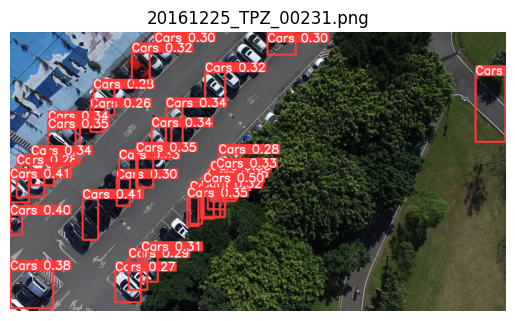

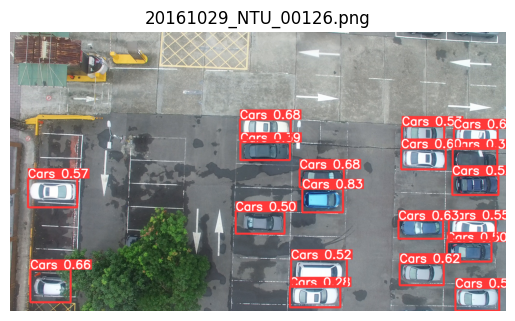

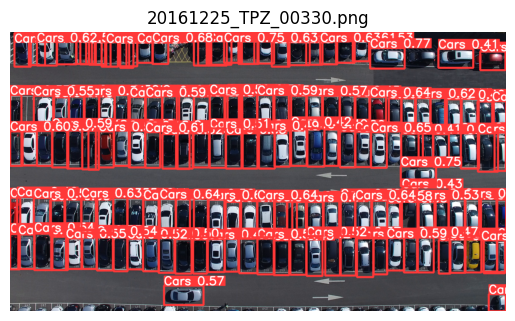

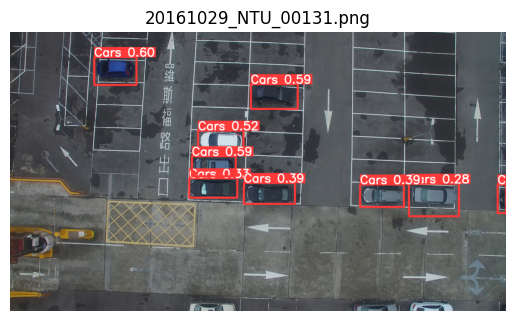

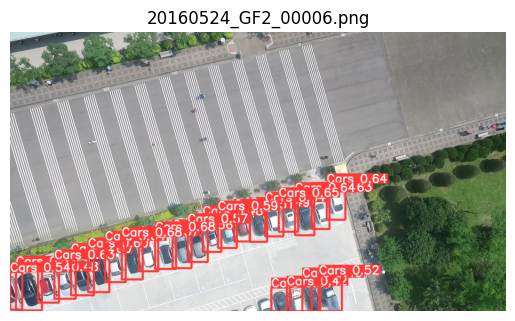

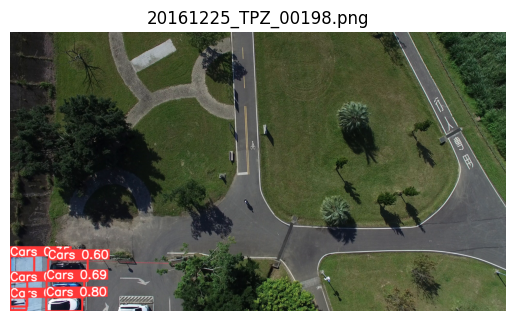

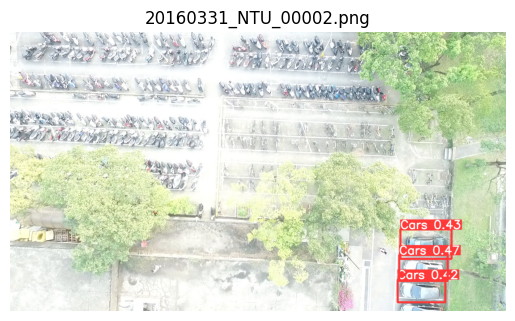

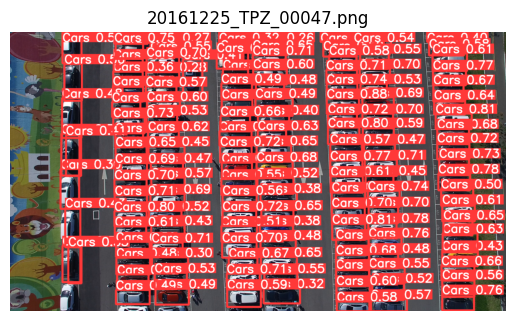

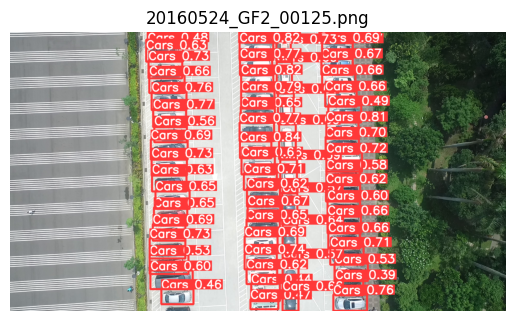

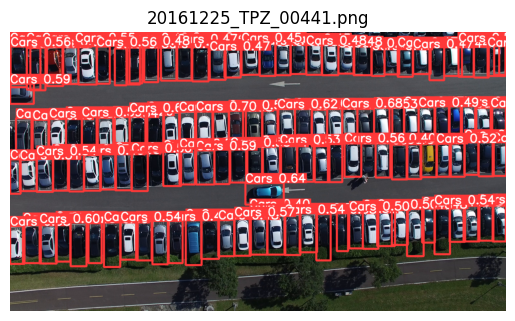

In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

def display_images_from_folder(folder_path, limit=10):
    # Get a list of files in the folder
    files = os.listdir(folder_path)

    # Filter out non-image files if needed
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # Limit the number of displayed images
    image_files = image_files[:limit]

    # Display each image
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = imread(image_path)
        plt.imshow(image)
        plt.title(image_file)
        plt.axis('off')  # Hide axis
        plt.show()

# Example usage
folder_path = "/content/runs/detect/predict2"
display_images_from_folder(folder_path, limit=10)


In [ ]:
import os

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            lines = f.readlines()
        annotations[filename] = len(lines)
    return annotations

def create_ground_truth_file(annotations, output_file):
    with open(output_file, 'w') as f:
        for filename, num_annotations in annotations.items():
            f.write(f"{filename}: {num_annotations}\n")
    print(f"Ground truth file created: {output_file}")

# Example usage
annotations_dir = '/content/datasets/CARPK_devkit/data/Annotations'
output_file = 'groundtruth_carpk.txt'

ground_truth_annotations = parse_ground_truth_annotations(annotations_dir)
create_ground_truth_file(ground_truth_annotations, output_file)


Ground truth file created: groundtruth_carpk.txt


RMSE and MAE for CarPK

In [ ]:
import os
import numpy as np
import re

def parse_yolov8_predictions(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            num_cars = int(parts[1].strip())
            predictions[os.path.basename(image_path)] = num_cars
    return predictions

def parse_ground_truth_annotations(annotations_dir):
    annotations = {}
    for filename in os.listdir(annotations_dir):
        with open(os.path.join(annotations_dir, filename)) as f:
            num_cars = sum(1 for _ in f)  # Count the lines in the file to get the number of cars
        annotations[filename.replace('.txt', '.png')] = num_cars
    return annotations

def create_comparison_file(yolo_predictions, ground_truth_annotations, output_file):
    with open(output_file, 'w') as f:
        f.write("Image Name\tYolo Prediction\tGround Truth\n")
        for image_name, yolo_count in yolo_predictions.items():
            gt_count = ground_truth_annotations.get(image_name, 'N/A')
            f.write(f"{image_name}\t{yolo_count}\t{gt_count}\n")

# Example usage
predictions_file = '/content/predictions_carpk.txt'
ground_truth_dir = '/content/datasets/CARPK_devkit/data/Annotations'
comparison_file = '/content/comparison_carpk.txt'

yolov8_predictions = parse_yolov8_predictions(open(predictions_file).read())
ground_truth_annotations = parse_ground_truth_annotations(ground_truth_dir)

create_comparison_file(yolov8_predictions, ground_truth_annotations, comparison_file)
print("Comparison file created:", comparison_file)


Comparison file created: /content/comparison_carpk.txt


###CARPK TEST SET.

In [ ]:
import os
import shutil

def filter_images(image_folder, image_names, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    print("Image names:", image_names)

    # Loop through the images in the folder
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        print("Checking image:", image_name, "Full path:", image_path)

        # Check if the image name is in the list
        if image_name[:-4] in image_names:
            print("Copying image:", image_name)
            try:
                # Copy the image to the output folder
                shutil.copy(image_path, output_folder)
            except Exception as e:
                print("Error copying image:", e)

# Example usage:
image_folder = '/content/datasets/CARPK_devkit/data/Images'
image_names = [
    "20161225_TPZ_00071",
    "20161225_TPZ_00075",
    "20161225_TPZ_00454",
    "20161225_TPZ_00229",
    "20161225_TPZ_00295",
    "20161225_TPZ_00217",
    "20161225_TPZ_00420",
    "20161225_TPZ_00364",
    "20161225_TPZ_00186",
    "20161225_TPZ_00444",
    "20161225_TPZ_00335",
    "20161225_TPZ_00036",
    "20161225_TPZ_00176",
    "20161225_TPZ_00194",
    "20161225_TPZ_00066",
    "20161225_TPZ_00251",
    "20161225_TPZ_00097",
    "20161225_TPZ_00115",
    "20161225_TPZ_00233",
    "20161225_TPZ_00166",
    "20161225_TPZ_00250",
    "20161225_TPZ_00360",
    "20161225_TPZ_00207",
    "20161225_TPZ_00052",
    "20161225_TPZ_00269",
    "20161225_TPZ_00425",
    "20161225_TPZ_00069",
    "20161225_TPZ_00347",
    "20161225_TPZ_00315",
    "20161225_TPZ_00368",
    "20161225_TPZ_00426",
    "20161225_TPZ_00073",
    "20161225_TPZ_00254",
    "20161225_TPZ_00121",
    "20161225_TPZ_00035",
    "20161225_TPZ_00447",
    "20161225_TPZ_00160",
    "20161225_TPZ_00253",
    "20161225_TPZ_00276",
    "20161225_TPZ_00303",
    "20161225_TPZ_00415",
    "20161225_TPZ_00117",
    "20161225_TPZ_00450",
    "20161225_TPZ_00046",
    "20161225_TPZ_00348",
    "20161225_TPZ_00169",
    "20161225_TPZ_00223",
    "20161225_TPZ_00203",
    "20161225_TPZ_00274",
    "20161225_TPZ_00137",
    "20161225_TPZ_00189",
    "20161225_TPZ_00261",
    "20161225_TPZ_00064",
    "20161225_TPZ_00273",
    "20161225_TPZ_00408",
    "20161225_TPZ_00063",
    "20161225_TPZ_00206",
    "20161225_TPZ_00127",
    "20161225_TPZ_00238",
    "20161225_TPZ_00288",
    "20161225_TPZ_00319",
    "20161225_TPZ_00244",
    "20161225_TPZ_00023",
    "20161225_TPZ_00299",
    "20161225_TPZ_00330",
    "20161225_TPZ_00391",
    "20161225_TPZ_00102",
    "20161225_TPZ_00165",
    "20161225_TPZ_00181",
    "20161225_TPZ_00103",
    "20161225_TPZ_00143",
    "20161225_TPZ_00320",
    "20161225_TPZ_00197",
    "20161225_TPZ_00298",
    "20161225_TPZ_00359",
    "20161225_TPZ_00031",
    "20161225_TPZ_00192",
    "20161225_TPZ_00259",
    "20161225_TPZ_00012",
    "20161225_TPZ_00054",
    "20161225_TPZ_00356",
    "20161225_TPZ_00018",
    "20161225_TPZ_00446",
    "20161225_TPZ_00086",
    "20161225_TPZ_00361",
    "20161225_TPZ_00227",
    "20161225_TPZ_00222",
    "20161225_TPZ_00201",
    "20161225_TPZ_00265",
    "20161225_TPZ_00205",
    "20161225_TPZ_00286",
    "20161225_TPZ_00370",
    "20161225_TPZ_00151",
    "20161225_TPZ_00350",
    "20161225_TPZ_00358",
    "20161225_TPZ_00449",
    "20161225_TPZ_00202",
    "20161225_TPZ_00083",
    "20161225_TPZ_00363",
    "20161225_TPZ_00309",
    "20161225_TPZ_00065",
    "20161225_TPZ_00459",
    "20161225_TPZ_00256",
    "20161225_TPZ_00218",
    "20161225_TPZ_00082",
    "20161225_TPZ_00068",
    "20161225_TPZ_00395",
    "20161225_TPZ_00116",
    "20161225_TPZ_00133",
    "20161225_TPZ_00003",
    "20161225_TPZ_00004",
    "20161225_TPZ_00173",
    "20161225_TPZ_00105",
    "20161225_TPZ_00282",
    "20161225_TPZ_00387",
    "20161225_TPZ_00182",
    "20161225_TPZ_00372",
    "20161225_TPZ_00291",
    "20161225_TPZ_00362",
    "20161225_TPZ_00293",
    "20161225_TPZ_00394",
    "20161225_TPZ_00210",
    "20161225_TPZ_00294",
    "20161225_TPZ_00386",
    "20161225_TPZ_00414",
    "20161225_TPZ_00096",
    "20161225_TPZ_00183",
    "20161225_TPZ_00416",
    "20161225_TPZ_00215",
    "20161225_TPZ_00333",
    "20161225_TPZ_00443",
    "20161225_TPZ_00323",
    "20161225_TPZ_00236",
    "20161225_TPZ_00422",
    "20161225_TPZ_00292",
    "20161225_TPZ_00094",
    "20161225_TPZ_00123",
    "20161225_TPZ_00125",
    "20161225_TPZ_00290",
    "20161225_TPZ_00100",
    "20161225_TPZ_00043",
    "20161225_TPZ_00346",
    "20161225_TPZ_00268",
    "20161225_TPZ_00404",
    "20161225_TPZ_00445",
    "20161225_TPZ_00130",
    "20161225_TPZ_00397",
    "20161225_TPZ_00310",
    "20161225_TPZ_00287",
    "20161225_TPZ_00199",
    "20161225_TPZ_00314",
    "20161225_TPZ_00284",
    "20161225_TPZ_00424",
    "20161225_TPZ_00305",
    "20161225_TPZ_00174",
    "20161225_TPZ_00392",
    "20161225_TPZ_00349",
    "20161225_TPZ_00342",
    "20161225_TPZ_00451",
    "20161225_TPZ_00409",
    "20161225_TPZ_00301",
    "20161225_TPZ_00138",
    "20161225_TPZ_00275",
    "20161225_TPZ_00101",
    "20161225_TPZ_00124",
    "20161225_TPZ_00171",
    "20161225_TPZ_00339",
    "20161225_TPZ_00345",
    "20161225_TPZ_00193",
    "20161225_TPZ_00371",
    "20161225_TPZ_00053",
    "20161225_TPZ_00226",
    "20161225_TPZ_00332",
    "20161225_TPZ_00367",
    "20161225_TPZ_00107",
    "20161225_TPZ_00393",
    "20161225_TPZ_00388",
    "20161225_TPZ_00061",
    "20161225_TPZ_00281",
    "20161225_TPZ_00365",
    "20161225_TPZ_00028",
    "20161225_TPZ_00307",
    "20161225_TPZ_00019",
    "20161225_TPZ_00146",
    "20161225_TPZ_00448",
    "20161225_TPZ_00145",
    "20161225_TPZ_00055",
    "20161225_TPZ_00453",
    "20161225_TPZ_00084",
    "20161225_TPZ_00196",
    "20161225_TPZ_00272",
    "20161225_TPZ_00090",
    "20161225_TPZ_00455",
    "20161225_TPZ_00091",
    "20161225_TPZ_00024",
    "20161225_TPZ_00237",
    "20161225_TPZ_00021",
    "20161225_TPZ_00153",
    "20161225_TPZ_00300",
    "20161225_TPZ_00377",
    "20161225_TPZ_00277",
    "20161225_TPZ_00059",
    "20161225_TPZ_00419",
    "20161225_TPZ_00077",
    "20161225_TPZ_00242",
    "20161225_TPZ_00384",
    "20161225_TPZ_00148",
    "20161225_TPZ_00343",
    "20161225_TPZ_00369",
    "20161225_TPZ_00170",
    "20161225_TPZ_00011",
    "20161225_TPZ_00271",
    "20161225_TPZ_00312",
    "20161225_TPZ_00221",
    "20161225_TPZ_00214",
    "20161225_TPZ_00030",
    "20161225_TPZ_00045",
    "20161225_TPZ_00220",
    "20161225_TPZ_00316",
    "20161225_TPZ_00267",
    "20161225_TPZ_00099",
    "20161225_TPZ_00155",
    "20161225_TPZ_00158",
    "20161225_TPZ_00417",
    "20161225_TPZ_00184",
    "20161225_TPZ_00433",
    "20161225_TPZ_00113",
    "20161225_TPZ_00429",
    "20161225_TPZ_00385",
    "20161225_TPZ_00430",
    "20161225_TPZ_00136",
    "20161225_TPZ_00087",
    "20161225_TPZ_00020",
    "20161225_TPZ_00355",
    "20161225_TPZ_00266",
    "20161225_TPZ_00050",
    "20161225_TPZ_00152",
    "20161225_TPZ_00245",
    "20161225_TPZ_00383",
    "20161225_TPZ_00413",
    "20161225_TPZ_00104",
    "20161225_TPZ_00219",
    "20161225_TPZ_00403",
    "20161225_TPZ_00442",
    "20161225_TPZ_00092",
    "20161225_TPZ_00157",
    "20161225_TPZ_00149",
    "20161225_TPZ_00010",
    "20161225_TPZ_00224",
    "20161225_TPZ_00225",
    "20161225_TPZ_00381",
    "20161225_TPZ_00039",
    "20161225_TPZ_00321",
    "20161225_TPZ_00216",
    "20161225_TPZ_00248",
    "20161225_TPZ_00156",
    "20161225_TPZ_00122",
    "20161225_TPZ_00132",
    "20161225_TPZ_00191",
    "20161225_TPZ_00327",
    "20161225_TPZ_00313",
    "20161225_TPZ_00172",
    "20161225_TPZ_00062",
    "20161225_TPZ_00311",
    "20161225_TPZ_00239",
    "20161225_TPZ_00017",
    "20161225_TPZ_00180",
    "20161225_TPZ_00308",
    "20161225_TPZ_00344",
    "20161225_TPZ_00129",
    "20161225_TPZ_00081",
    "20161225_TPZ_00088",
    "20161225_TPZ_00213",
    "20161225_TPZ_00079",
    "20161225_TPZ_00340",
    "20161225_TPZ_00029",
    "20161225_TPZ_00278",
    "20161225_TPZ_00334",
    "20161225_TPZ_00060",
    "20161225_TPZ_00283",
    "20161225_TPZ_00258",
    "20161225_TPZ_00366",
    "20161225_TPZ_00260",
    "20161225_TPZ_00112",
    "20161225_TPZ_00428",
    "20161225_TPZ_00209",
    "20161225_TPZ_00198",
    "20161225_TPZ_00089",
    "20161225_TPZ_00014",
    "20161225_TPZ_00074",
    "20161225_TPZ_00108",
    "20161225_TPZ_00016",
    "20161225_TPZ_00041",
    "20161225_TPZ_00249",
    "20161225_TPZ_00441",
    "20161225_TPZ_00038",
    "20161225_TPZ_00095",
    "20161225_TPZ_00436",
    "20161225_TPZ_00240",
    "20161225_TPZ_00318",
    "20161225_TPZ_00106",
    "20161225_TPZ_00376",
    "20161225_TPZ_00120",
    "20161225_TPZ_00302",
    "20161225_TPZ_00390",
    "20161225_TPZ_00167",
    "20161225_TPZ_00163",
    "20161225_TPZ_00072",
    "20161225_TPZ_00044",
    "20161225_TPZ_00119",
    "20161225_TPZ_00232",
    "20161225_TPZ_00399",
    "20161225_TPZ_00204",
    "20161225_TPZ_00093",
    "20161225_TPZ_00013",
    "20161225_TPZ_00257",
    "20161225_TPZ_00135",
    "20161225_TPZ_00034",
    "20161225_TPZ_00427",
    "20161225_TPZ_00353",
    "20161225_TPZ_00354",
    "20161225_TPZ_00142",
    "20161225_TPZ_00154",
    "20161225_TPZ_00247",
    "20161225_TPZ_00150",
    "20161225_TPZ_00164",
    "20161225_TPZ_00022",
    "20161225_TPZ_00296",
    "20161225_TPZ_00411",
    "20161225_TPZ_00109",
    "20161225_TPZ_00187",
    "20161225_TPZ_00352",
    "20161225_TPZ_00406",
    "20161225_TPZ_00270",
    "20161225_TPZ_00128",
    "20161225_TPZ_00144",
    "20161225_TPZ_00262",
    "20161225_TPZ_00374",
    "20161225_TPZ_00177",
    "20161225_TPZ_00264",
    "20161225_TPZ_00325",
    "20161225_TPZ_00179",
    "20161225_TPZ_00243",
    "20161225_TPZ_00006",
    "20161225_TPZ_00405",
    "20161225_TPZ_00048",
    "20161225_TPZ_00382",
    "20161225_TPZ_00418",
    "20161225_TPZ_00326",
    "20161225_TPZ_00098",
    "20161225_TPZ_00070",
    "20161225_TPZ_00140",
    "20161225_TPZ_00008",
    "20161225_TPZ_00338",
    "20161225_TPZ_00439",
    "20161225_TPZ_00007",
    "20161225_TPZ_00252",
    "20161225_TPZ_00080",
    "20161225_TPZ_00255",
    "20161225_TPZ_00026",
    "20161225_TPZ_00159",
    "20161225_TPZ_00357",
    "20161225_TPZ_00396",
    "20161225_TPZ_00228",
    "20161225_TPZ_00280",
    "20161225_TPZ_00373",
    "20161225_TPZ_00297",
    "20161225_TPZ_00002",
    "20161225_TPZ_00037",
    "20161225_TPZ_00336",
    "20161225_TPZ_00015",
    "20161225_TPZ_00175",
    "20161225_TPZ_00324",
    "20161225_TPZ_00161",
    "20161225_TPZ_00437",
    "20161225_TPZ_00185",
    "20161225_TPZ_00051",
    "20161225_TPZ_00009",
    "20161225_TPZ_00042",
    "20161225_TPZ_00126",
    "20161225_TPZ_00056",
    "20161225_TPZ_00380",
    "20161225_TPZ_00322",
    "20161225_TPZ_00421",
    "20161225_TPZ_00208",
    "20161225_TPZ_00379",
    "20161225_TPZ_00398",
    "20161225_TPZ_00162",
    "20161225_TPZ_00234",
    "20161225_TPZ_00263",
    "20161225_TPZ_00337",
    "20161225_TPZ_00241",
    "20161225_TPZ_00306",
    "20161225_TPZ_00067",
    "20161225_TPZ_00435",
    "20161225_TPZ_00452",
    "20161225_TPZ_00401",
    "20161225_TPZ_00317",
    "20161225_TPZ_00458",
    "20161225_TPZ_00211",
    "20161225_TPZ_00005",
    "20161225_TPZ_00190",
    "20161225_TPZ_00457",
    "20161225_TPZ_00412",
    "20161225_TPZ_00375",
    "20161225_TPZ_00178",
    "20161225_TPZ_00231",
    "20161225_TPZ_00351",
    "20161225_TPZ_00188",
    "20161225_TPZ_00423",
    "20161225_TPZ_00400",
    "20161225_TPZ_00058",
    "20161225_TPZ_00032",
    "20161225_TPZ_00139",
    "20161225_TPZ_00389",
    "20161225_TPZ_00195",
    "20161225_TPZ_00410",
    "20161225_TPZ_00114",
    "20161225_TPZ_00001",
    "20161225_TPZ_00328",
    "20161225_TPZ_00025",
    "20161225_TPZ_00027",
    "20161225_TPZ_00134",
    "20161225_TPZ_00212",
    "20161225_TPZ_00438",
    "20161225_TPZ_00110",
    "20161225_TPZ_00289",
    "20161225_TPZ_00111",
    "20161225_TPZ_00235",
    "20161225_TPZ_00246",
    "20161225_TPZ_00047",
    "20161225_TPZ_00040",
    "20161225_TPZ_00118",
    "20161225_TPZ_00049",
    "20161225_TPZ_00440",
    "20161225_TPZ_00131",
    "20161225_TPZ_00407",
    "20161225_TPZ_00304",
    "20161225_TPZ_00057",
    "20161225_TPZ_00076",
    "20161225_TPZ_00331",
    "20161225_TPZ_00147",
    "20161225_TPZ_00432",
    "20161225_TPZ_00033",
    "20161225_TPZ_00168",
    "20161225_TPZ_00378",
    "20161225_TPZ_00285",
    "20161225_TPZ_00456",
    "20161225_TPZ_00078",
    "20161225_TPZ_00141",
    "20161225_TPZ_00200",
    "20161225_TPZ_00402",
    "20161225_TPZ_00431",
    "20161225_TPZ_00279",
    "20161225_TPZ_00085",
    "20161225_TPZ_00341",
    "20161225_TPZ_00434",
    "20161225_TPZ_00329",
    "20161225_TPZ_00230",
]

output_folder = '/content/carpktest'

filter_images(image_folder, image_names, output_folder)


Image names: ['20161225_TPZ_00071', '20161225_TPZ_00075', '20161225_TPZ_00454', '20161225_TPZ_00229', '20161225_TPZ_00295', '20161225_TPZ_00217', '20161225_TPZ_00420', '20161225_TPZ_00364', '20161225_TPZ_00186', '20161225_TPZ_00444', '20161225_TPZ_00335', '20161225_TPZ_00036', '20161225_TPZ_00176', '20161225_TPZ_00194', '20161225_TPZ_00066', '20161225_TPZ_00251', '20161225_TPZ_00097', '20161225_TPZ_00115', '20161225_TPZ_00233', '20161225_TPZ_00166', '20161225_TPZ_00250', '20161225_TPZ_00360', '20161225_TPZ_00207', '20161225_TPZ_00052', '20161225_TPZ_00269', '20161225_TPZ_00425', '20161225_TPZ_00069', '20161225_TPZ_00347', '20161225_TPZ_00315', '20161225_TPZ_00368', '20161225_TPZ_00426', '20161225_TPZ_00073', '20161225_TPZ_00254', '20161225_TPZ_00121', '20161225_TPZ_00035', '20161225_TPZ_00447', '20161225_TPZ_00160', '20161225_TPZ_00253', '20161225_TPZ_00276', '20161225_TPZ_00303', '20161225_TPZ_00415', '20161225_TPZ_00117', '20161225_TPZ_00450', '20161225_TPZ_00046', '20161225_TPZ_0034

In [ ]:
!pip install ultralytics lxml pascal_voc_writer

In [ ]:
import os
import numpy as np

# Function to parse ground truth text files and count objects
def count_objects_from_txt(txt_file):
    with open(txt_file, 'r') as file:
        return len(file.readlines())

# Function to parse YOLO predictions and count objects
def parse_yolo_predictions(txt_file):
    predictions = {}
    with open(txt_file, 'r') as file:
        for line in file:
            image_name, count = line.strip().split(': ')
            predictions[image_name] = int(count)
    return predictions

# Function to evaluate predictions and return the Mean Absolute Error (MAE)
def evaluate_predictions(results_file, ground_truth_dir):
    gt_files = sorted(os.listdir(ground_truth_dir))
    ground_truth_counts = {}
    for gt_file in gt_files:
        image_name = gt_file.replace('.txt', '.png')
        ground_truth_counts[image_name] = count_objects_from_txt(os.path.join(ground_truth_dir, gt_file))

    predictions = parse_yolo_predictions(results_file)

    y_true = []
    y_pred = []

    for image_name, gt_count in ground_truth_counts.items():
        if image_name in predictions:
            y_true.append(gt_count)
            y_pred.append(predictions[image_name])
        else:
            y_true.append(gt_count)
            y_pred.append(0)

    # Calculate mean absolute error
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    mae = np.mean(np.abs(y_true - y_pred))
    return mae

# Ranges of confidence and IoU thresholds to test
conf_thres_values = [0.1, 0.3, 0.5, 0.7]
iou_thres_values = [0.2, 0.3, 0.4, 0.5]

# Initialize best thresholds and MAE score
best_conf_thres = 0.5
best_iou_thres = 0.4
best_mae = float('inf')

# Iterate over each combination of thresholds
for conf_thres in conf_thres_values:
    for iou_thres in iou_thres_values:
        # Run predictions with the current thresholds
        os.system(f"yolo detect predict model='/content/carpk_10_400e.pt' source='/content/carpktest' conf={conf_thres} iou={iou_thres} save_txt=True save_conf=True project='results' name='conf_{conf_thres}_iou_{iou_thres}'")

        # Path to the results file (adjust path according to your setup)
        results_file = f"/content/yolov8_carpk10nms_400_predictions.txt"

        # Evaluate predictions and get MAE score
        mae_score = evaluate_predictions(results_file, ground_truth_dir="/content/datasets/CARPK_devkit/data/Annotations")

        # Update best thresholds if current MAE is better (lower)
        if mae_score < best_mae:
            best_mae = mae_score
            best_conf_thres = conf_thres
            best_iou_thres = iou_thres

print(f'Best conf_thres: {best_conf_thres}, Best iou_thres: {best_iou_thres}')


Best conf_thres: 0.1, Best iou_thres: 0.2


In [ ]:
!yolo detect predict model='/content/carpk30_400e.pt' source='/content/carpktest' conf=0.1 iou=0.2

Ultralytics YOLOv8.2.19 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs

image 1/459 /content/carpktest/20161225_TPZ_00001.png: 384x640 76 Carss, 96.6ms
image 2/459 /content/carpktest/20161225_TPZ_00002.png: 384x640 75 Carss, 12.3ms
image 3/459 /content/carpktest/20161225_TPZ_00003.png: 384x640 79 Carss, 9.1ms
image 4/459 /content/carpktest/20161225_TPZ_00004.png: 384x640 86 Carss, 9.4ms
image 5/459 /content/carpktest/20161225_TPZ_00005.png: 384x640 95 Carss, 8.8ms
image 6/459 /content/carpktest/20161225_TPZ_00006.png: 384x640 97 Carss, 9.1ms
image 7/459 /content/carpktest/20161225_TPZ_00007.png: 384x640 102 Carss, 8.8ms
image 8/459 /content/carpktest/20161225_TPZ_00008.png: 384x640 93 Carss, 11.0ms
image 9/459 /content/carpktest/20161225_TPZ_00009.png: 384x640 92 Carss, 9.7ms
image 10/459 /content/carpktest/20161225_TPZ_00010.png: 384x640 98 Carss, 9.2ms
image 11/459 /content/carpktest/201612

In [ ]:
import os
import re

def parse_yolov8_output(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            match = re.search(r'\d+\sCars', parts[1])
            if match:
                num_cars = int(match.group(0).split(' ')[0])
                predictions[os.path.basename(image_path)] = num_cars
    return predictions

def write_predictions_to_file(predictions, output_file):
    with open(output_file, 'w') as f:
        for image_name, count in predictions.items():
            f.write(f"{image_name}: {count}\n")

# Example usage
yolov8_output = """
image 1/459 /content/carpktest/20161225_TPZ_00001.png: 384x640 76 Carss, 96.6ms
image 2/459 /content/carpktest/20161225_TPZ_00002.png: 384x640 75 Carss, 12.3ms
image 3/459 /content/carpktest/20161225_TPZ_00003.png: 384x640 79 Carss, 9.1ms
image 4/459 /content/carpktest/20161225_TPZ_00004.png: 384x640 86 Carss, 9.4ms
image 5/459 /content/carpktest/20161225_TPZ_00005.png: 384x640 95 Carss, 8.8ms
image 6/459 /content/carpktest/20161225_TPZ_00006.png: 384x640 97 Carss, 9.1ms
image 7/459 /content/carpktest/20161225_TPZ_00007.png: 384x640 102 Carss, 8.8ms
image 8/459 /content/carpktest/20161225_TPZ_00008.png: 384x640 93 Carss, 11.0ms
image 9/459 /content/carpktest/20161225_TPZ_00009.png: 384x640 92 Carss, 9.7ms
image 10/459 /content/carpktest/20161225_TPZ_00010.png: 384x640 98 Carss, 9.2ms
image 11/459 /content/carpktest/20161225_TPZ_00011.png: 384x640 99 Carss, 10.2ms
image 12/459 /content/carpktest/20161225_TPZ_00012.png: 384x640 104 Carss, 9.7ms
image 13/459 /content/carpktest/20161225_TPZ_00013.png: 384x640 108 Carss, 8.6ms
image 14/459 /content/carpktest/20161225_TPZ_00014.png: 384x640 114 Carss, 8.8ms
image 15/459 /content/carpktest/20161225_TPZ_00015.png: 384x640 109 Carss, 8.9ms
image 16/459 /content/carpktest/20161225_TPZ_00016.png: 384x640 108 Carss, 10.3ms
image 17/459 /content/carpktest/20161225_TPZ_00017.png: 384x640 110 Carss, 11.9ms
image 18/459 /content/carpktest/20161225_TPZ_00018.png: 384x640 115 Carss, 11.3ms
image 19/459 /content/carpktest/20161225_TPZ_00019.png: 384x640 108 Carss, 10.0ms
image 20/459 /content/carpktest/20161225_TPZ_00020.png: 384x640 106 Carss, 10.1ms
image 21/459 /content/carpktest/20161225_TPZ_00021.png: 384x640 108 Carss, 12.6ms
image 22/459 /content/carpktest/20161225_TPZ_00022.png: 384x640 106 Carss, 13.8ms
image 23/459 /content/carpktest/20161225_TPZ_00023.png: 384x640 111 Carss, 11.5ms
image 24/459 /content/carpktest/20161225_TPZ_00024.png: 384x640 106 Carss, 7.1ms
image 25/459 /content/carpktest/20161225_TPZ_00025.png: 384x640 109 Carss, 7.2ms
image 26/459 /content/carpktest/20161225_TPZ_00026.png: 384x640 110 Carss, 7.3ms
image 27/459 /content/carpktest/20161225_TPZ_00027.png: 384x640 107 Carss, 8.2ms
image 28/459 /content/carpktest/20161225_TPZ_00028.png: 384x640 104 Carss, 7.2ms
image 29/459 /content/carpktest/20161225_TPZ_00029.png: 384x640 100 Carss, 7.1ms
image 30/459 /content/carpktest/20161225_TPZ_00030.png: 384x640 101 Carss, 6.8ms
image 31/459 /content/carpktest/20161225_TPZ_00031.png: 384x640 99 Carss, 11.6ms
image 32/459 /content/carpktest/20161225_TPZ_00032.png: 384x640 105 Carss, 7.4ms
image 33/459 /content/carpktest/20161225_TPZ_00033.png: 384x640 95 Carss, 7.0ms
image 34/459 /content/carpktest/20161225_TPZ_00034.png: 384x640 95 Carss, 7.0ms
image 35/459 /content/carpktest/20161225_TPZ_00035.png: 384x640 96 Carss, 6.9ms
image 36/459 /content/carpktest/20161225_TPZ_00036.png: 384x640 104 Carss, 8.4ms
image 37/459 /content/carpktest/20161225_TPZ_00037.png: 384x640 111 Carss, 7.5ms
image 38/459 /content/carpktest/20161225_TPZ_00038.png: 384x640 115 Carss, 7.1ms
image 39/459 /content/carpktest/20161225_TPZ_00039.png: 384x640 118 Carss, 6.9ms
image 40/459 /content/carpktest/20161225_TPZ_00040.png: 384x640 121 Carss, 7.1ms
image 41/459 /content/carpktest/20161225_TPZ_00041.png: 384x640 127 Carss, 7.1ms
image 42/459 /content/carpktest/20161225_TPZ_00042.png: 384x640 128 Carss, 7.2ms
image 43/459 /content/carpktest/20161225_TPZ_00043.png: 384x640 135 Carss, 7.3ms
image 44/459 /content/carpktest/20161225_TPZ_00044.png: 384x640 148 Carss, 7.2ms
image 45/459 /content/carpktest/20161225_TPZ_00045.png: 384x640 146 Carss, 7.2ms
image 46/459 /content/carpktest/20161225_TPZ_00046.png: 384x640 147 Carss, 7.1ms
image 47/459 /content/carpktest/20161225_TPZ_00047.png: 384x640 152 Carss, 7.3ms
image 48/459 /content/carpktest/20161225_TPZ_00048.png: 384x640 151 Carss, 7.4ms
image 49/459 /content/carpktest/20161225_TPZ_00049.png: 384x640 149 Carss, 7.2ms
image 50/459 /content/carpktest/20161225_TPZ_00050.png: 384x640 148 Carss, 7.6ms
image 51/459 /content/carpktest/20161225_TPZ_00051.png: 384x640 146 Carss, 7.1ms
image 52/459 /content/carpktest/20161225_TPZ_00052.png: 384x640 134 Carss, 7.4ms
image 53/459 /content/carpktest/20161225_TPZ_00053.png: 384x640 131 Carss, 9.7ms
image 54/459 /content/carpktest/20161225_TPZ_00054.png: 384x640 127 Carss, 7.2ms
image 55/459 /content/carpktest/20161225_TPZ_00055.png: 384x640 124 Carss, 6.9ms
image 56/459 /content/carpktest/20161225_TPZ_00056.png: 384x640 124 Carss, 7.0ms
image 57/459 /content/carpktest/20161225_TPZ_00057.png: 384x640 120 Carss, 7.9ms
image 58/459 /content/carpktest/20161225_TPZ_00058.png: 384x640 119 Carss, 7.0ms
image 59/459 /content/carpktest/20161225_TPZ_00059.png: 384x640 120 Carss, 7.3ms
image 60/459 /content/carpktest/20161225_TPZ_00060.png: 384x640 117 Carss, 7.1ms
image 61/459 /content/carpktest/20161225_TPZ_00061.png: 384x640 112 Carss, 6.6ms
image 62/459 /content/carpktest/20161225_TPZ_00062.png: 384x640 105 Carss, 6.8ms
image 63/459 /content/carpktest/20161225_TPZ_00063.png: 384x640 110 Carss, 12.8ms
image 64/459 /content/carpktest/20161225_TPZ_00064.png: 384x640 111 Carss, 6.7ms
image 65/459 /content/carpktest/20161225_TPZ_00065.png: 384x640 117 Carss, 6.8ms
image 66/459 /content/carpktest/20161225_TPZ_00066.png: 384x640 118 Carss, 8.7ms
image 67/459 /content/carpktest/20161225_TPZ_00067.png: 384x640 115 Carss, 6.9ms
image 68/459 /content/carpktest/20161225_TPZ_00068.png: 384x640 112 Carss, 10.5ms
image 69/459 /content/carpktest/20161225_TPZ_00069.png: 384x640 112 Carss, 6.9ms
image 70/459 /content/carpktest/20161225_TPZ_00070.png: 384x640 118 Carss, 6.8ms
image 71/459 /content/carpktest/20161225_TPZ_00071.png: 384x640 116 Carss, 7.2ms
image 72/459 /content/carpktest/20161225_TPZ_00072.png: 384x640 112 Carss, 7.3ms
image 73/459 /content/carpktest/20161225_TPZ_00073.png: 384x640 114 Carss, 7.1ms
image 74/459 /content/carpktest/20161225_TPZ_00074.png: 384x640 114 Carss, 7.0ms
image 75/459 /content/carpktest/20161225_TPZ_00075.png: 384x640 113 Carss, 7.1ms
image 76/459 /content/carpktest/20161225_TPZ_00076.png: 384x640 108 Carss, 6.9ms
image 77/459 /content/carpktest/20161225_TPZ_00077.png: 384x640 111 Carss, 8.9ms
image 78/459 /content/carpktest/20161225_TPZ_00078.png: 384x640 105 Carss, 6.7ms
image 79/459 /content/carpktest/20161225_TPZ_00079.png: 384x640 109 Carss, 9.6ms
image 80/459 /content/carpktest/20161225_TPZ_00080.png: 384x640 106 Carss, 7.0ms
image 81/459 /content/carpktest/20161225_TPZ_00081.png: 384x640 109 Carss, 7.0ms
image 82/459 /content/carpktest/20161225_TPZ_00082.png: 384x640 106 Carss, 6.8ms
image 83/459 /content/carpktest/20161225_TPZ_00083.png: 384x640 106 Carss, 7.3ms
image 84/459 /content/carpktest/20161225_TPZ_00084.png: 384x640 104 Carss, 6.8ms
image 85/459 /content/carpktest/20161225_TPZ_00085.png: 384x640 105 Carss, 6.9ms
image 86/459 /content/carpktest/20161225_TPZ_00086.png: 384x640 104 Carss, 7.3ms
image 87/459 /content/carpktest/20161225_TPZ_00087.png: 384x640 110 Carss, 6.9ms
image 88/459 /content/carpktest/20161225_TPZ_00088.png: 384x640 111 Carss, 6.9ms
image 89/459 /content/carpktest/20161225_TPZ_00089.png: 384x640 115 Carss, 7.0ms
image 90/459 /content/carpktest/20161225_TPZ_00090.png: 384x640 110 Carss, 7.7ms
image 91/459 /content/carpktest/20161225_TPZ_00091.png: 384x640 116 Carss, 6.7ms
image 92/459 /content/carpktest/20161225_TPZ_00092.png: 384x640 115 Carss, 6.7ms
image 93/459 /content/carpktest/20161225_TPZ_00093.png: 384x640 112 Carss, 6.9ms
image 94/459 /content/carpktest/20161225_TPZ_00094.png: 384x640 111 Carss, 6.9ms
image 95/459 /content/carpktest/20161225_TPZ_00095.png: 384x640 121 Carss, 7.0ms
image 96/459 /content/carpktest/20161225_TPZ_00096.png: 384x640 117 Carss, 7.0ms
image 97/459 /content/carpktest/20161225_TPZ_00097.png: 384x640 114 Carss, 11.9ms
image 98/459 /content/carpktest/20161225_TPZ_00098.png: 384x640 117 Carss, 12.7ms
image 99/459 /content/carpktest/20161225_TPZ_00099.png: 384x640 114 Carss, 9.0ms
image 100/459 /content/carpktest/20161225_TPZ_00100.png: 384x640 107 Carss, 9.0ms
image 101/459 /content/carpktest/20161225_TPZ_00101.png: 384x640 105 Carss, 8.8ms
image 102/459 /content/carpktest/20161225_TPZ_00102.png: 384x640 99 Carss, 8.5ms
image 103/459 /content/carpktest/20161225_TPZ_00103.png: 384x640 87 Carss, 14.2ms
image 104/459 /content/carpktest/20161225_TPZ_00104.png: 384x640 87 Carss, 8.6ms
image 105/459 /content/carpktest/20161225_TPZ_00105.png: 384x640 79 Carss, 9.0ms
image 106/459 /content/carpktest/20161225_TPZ_00106.png: 384x640 74 Carss, 9.0ms
image 107/459 /content/carpktest/20161225_TPZ_00107.png: 384x640 77 Carss, 8.6ms
image 108/459 /content/carpktest/20161225_TPZ_00108.png: 384x640 74 Carss, 11.1ms
image 109/459 /content/carpktest/20161225_TPZ_00109.png: 384x640 81 Carss, 8.4ms
image 110/459 /content/carpktest/20161225_TPZ_00110.png: 384x640 76 Carss, 8.8ms
image 111/459 /content/carpktest/20161225_TPZ_00111.png: 384x640 75 Carss, 11.4ms
image 112/459 /content/carpktest/20161225_TPZ_00112.png: 384x640 70 Carss, 13.8ms
image 113/459 /content/carpktest/20161225_TPZ_00113.png: 384x640 73 Carss, 10.2ms
image 114/459 /content/carpktest/20161225_TPZ_00114.png: 384x640 74 Carss, 13.3ms
image 115/459 /content/carpktest/20161225_TPZ_00115.png: 384x640 72 Carss, 12.2ms
image 116/459 /content/carpktest/20161225_TPZ_00116.png: 384x640 68 Carss, 11.0ms
image 117/459 /content/carpktest/20161225_TPZ_00117.png: 384x640 72 Carss, 10.6ms
image 118/459 /content/carpktest/20161225_TPZ_00118.png: 384x640 71 Carss, 11.2ms
image 119/459 /content/carpktest/20161225_TPZ_00119.png: 384x640 69 Carss, 11.8ms
image 120/459 /content/carpktest/20161225_TPZ_00120.png: 384x640 72 Carss, 12.5ms
image 121/459 /content/carpktest/20161225_TPZ_00121.png: 384x640 72 Carss, 12.9ms
image 122/459 /content/carpktest/20161225_TPZ_00122.png: 384x640 72 Carss, 7.1ms
image 123/459 /content/carpktest/20161225_TPZ_00123.png: 384x640 79 Carss, 7.0ms
image 124/459 /content/carpktest/20161225_TPZ_00124.png: 384x640 87 Carss, 6.9ms
image 125/459 /content/carpktest/20161225_TPZ_00125.png: 384x640 95 Carss, 6.8ms
image 126/459 /content/carpktest/20161225_TPZ_00126.png: 384x640 105 Carss, 6.8ms
image 127/459 /content/carpktest/20161225_TPZ_00127.png: 384x640 116 Carss, 6.7ms
image 128/459 /content/carpktest/20161225_TPZ_00128.png: 384x640 113 Carss, 7.2ms
image 129/459 /content/carpktest/20161225_TPZ_00129.png: 384x640 111 Carss, 7.0ms
image 130/459 /content/carpktest/20161225_TPZ_00130.png: 384x640 101 Carss, 6.9ms
image 131/459 /content/carpktest/20161225_TPZ_00131.png: 384x640 103 Carss, 9.8ms
image 132/459 /content/carpktest/20161225_TPZ_00132.png: 384x640 112 Carss, 7.1ms
image 133/459 /content/carpktest/20161225_TPZ_00133.png: 384x640 117 Carss, 6.9ms
image 134/459 /content/carpktest/20161225_TPZ_00134.png: 384x640 118 Carss, 6.9ms
image 135/459 /content/carpktest/20161225_TPZ_00135.png: 384x640 119 Carss, 9.1ms
image 136/459 /content/carpktest/20161225_TPZ_00136.png: 384x640 105 Carss, 10.1ms
image 137/459 /content/carpktest/20161225_TPZ_00137.png: 384x640 108 Carss, 7.1ms
image 138/459 /content/carpktest/20161225_TPZ_00138.png: 384x640 116 Carss, 7.0ms
image 139/459 /content/carpktest/20161225_TPZ_00139.png: 384x640 112 Carss, 7.2ms
image 140/459 /content/carpktest/20161225_TPZ_00140.png: 384x640 136 Carss, 7.6ms
image 141/459 /content/carpktest/20161225_TPZ_00141.png: 384x640 145 Carss, 7.5ms
image 142/459 /content/carpktest/20161225_TPZ_00142.png: 384x640 141 Carss, 8.0ms
image 143/459 /content/carpktest/20161225_TPZ_00143.png: 384x640 129 Carss, 7.2ms
image 144/459 /content/carpktest/20161225_TPZ_00144.png: 384x640 124 Carss, 9.6ms
image 145/459 /content/carpktest/20161225_TPZ_00145.png: 384x640 119 Carss, 7.0ms
image 146/459 /content/carpktest/20161225_TPZ_00146.png: 384x640 122 Carss, 6.9ms
image 147/459 /content/carpktest/20161225_TPZ_00147.png: 384x640 125 Carss, 7.9ms
image 148/459 /content/carpktest/20161225_TPZ_00148.png: 384x640 120 Carss, 7.5ms
image 149/459 /content/carpktest/20161225_TPZ_00149.png: 384x640 122 Carss, 7.5ms
image 150/459 /content/carpktest/20161225_TPZ_00150.png: 384x640 121 Carss, 11.8ms
image 151/459 /content/carpktest/20161225_TPZ_00151.png: 384x640 120 Carss, 10.7ms
image 152/459 /content/carpktest/20161225_TPZ_00152.png: 384x640 123 Carss, 6.8ms
image 153/459 /content/carpktest/20161225_TPZ_00153.png: 384x640 122 Carss, 7.1ms
image 154/459 /content/carpktest/20161225_TPZ_00154.png: 384x640 129 Carss, 7.0ms
image 155/459 /content/carpktest/20161225_TPZ_00155.png: 384x640 138 Carss, 7.1ms
image 156/459 /content/carpktest/20161225_TPZ_00156.png: 384x640 136 Carss, 7.0ms
image 157/459 /content/carpktest/20161225_TPZ_00157.png: 384x640 140 Carss, 7.9ms
image 158/459 /content/carpktest/20161225_TPZ_00158.png: 384x640 137 Carss, 7.1ms
image 159/459 /content/carpktest/20161225_TPZ_00159.png: 384x640 131 Carss, 8.0ms
image 160/459 /content/carpktest/20161225_TPZ_00160.png: 384x640 114 Carss, 7.0ms
image 161/459 /content/carpktest/20161225_TPZ_00161.png: 384x640 104 Carss, 11.5ms
image 162/459 /content/carpktest/20161225_TPZ_00162.png: 384x640 102 Carss, 7.2ms
image 163/459 /content/carpktest/20161225_TPZ_00163.png: 384x640 111 Carss, 7.3ms
image 164/459 /content/carpktest/20161225_TPZ_00164.png: 384x640 112 Carss, 7.4ms
image 165/459 /content/carpktest/20161225_TPZ_00165.png: 384x640 108 Carss, 7.5ms
image 166/459 /content/carpktest/20161225_TPZ_00166.png: 384x640 111 Carss, 7.2ms
image 167/459 /content/carpktest/20161225_TPZ_00167.png: 384x640 119 Carss, 7.4ms
image 168/459 /content/carpktest/20161225_TPZ_00168.png: 384x640 115 Carss, 6.9ms
image 169/459 /content/carpktest/20161225_TPZ_00169.png: 384x640 120 Carss, 7.2ms
image 170/459 /content/carpktest/20161225_TPZ_00170.png: 384x640 121 Carss, 6.9ms
image 171/459 /content/carpktest/20161225_TPZ_00171.png: 384x640 120 Carss, 7.2ms
image 172/459 /content/carpktest/20161225_TPZ_00172.png: 384x640 116 Carss, 11.6ms
image 173/459 /content/carpktest/20161225_TPZ_00173.png: 384x640 117 Carss, 9.8ms
image 174/459 /content/carpktest/20161225_TPZ_00174.png: 384x640 120 Carss, 7.1ms
image 175/459 /content/carpktest/20161225_TPZ_00175.png: 384x640 119 Carss, 7.2ms
image 176/459 /content/carpktest/20161225_TPZ_00176.png: 384x640 119 Carss, 7.2ms
image 177/459 /content/carpktest/20161225_TPZ_00177.png: 384x640 116 Carss, 7.0ms
image 178/459 /content/carpktest/20161225_TPZ_00178.png: 384x640 119 Carss, 7.4ms
image 179/459 /content/carpktest/20161225_TPZ_00179.png: 384x640 115 Carss, 7.0ms
image 180/459 /content/carpktest/20161225_TPZ_00180.png: 384x640 113 Carss, 7.2ms
image 181/459 /content/carpktest/20161225_TPZ_00181.png: 384x640 113 Carss, 6.8ms
image 182/459 /content/carpktest/20161225_TPZ_00182.png: 384x640 106 Carss, 7.0ms
image 183/459 /content/carpktest/20161225_TPZ_00183.png: 384x640 104 Carss, 7.2ms
image 184/459 /content/carpktest/20161225_TPZ_00184.png: 384x640 102 Carss, 11.1ms
image 185/459 /content/carpktest/20161225_TPZ_00185.png: 384x640 102 Carss, 6.8ms
image 186/459 /content/carpktest/20161225_TPZ_00186.png: 384x640 112 Carss, 7.0ms
image 187/459 /content/carpktest/20161225_TPZ_00187.png: 384x640 114 Carss, 12.2ms
image 188/459 /content/carpktest/20161225_TPZ_00188.png: 384x640 108 Carss, 7.4ms
image 189/459 /content/carpktest/20161225_TPZ_00189.png: 384x640 101 Carss, 7.3ms
image 190/459 /content/carpktest/20161225_TPZ_00190.png: 384x640 81 Carss, 7.0ms
image 191/459 /content/carpktest/20161225_TPZ_00191.png: 384x640 65 Carss, 7.2ms
image 192/459 /content/carpktest/20161225_TPZ_00192.png: 384x640 58 Carss, 6.8ms
image 193/459 /content/carpktest/20161225_TPZ_00193.png: 384x640 36 Carss, 7.1ms
image 194/459 /content/carpktest/20161225_TPZ_00194.png: 384x640 29 Carss, 10.3ms
image 195/459 /content/carpktest/20161225_TPZ_00195.png: 384x640 24 Carss, 12.2ms
image 196/459 /content/carpktest/20161225_TPZ_00196.png: 384x640 20 Carss, 9.0ms
image 197/459 /content/carpktest/20161225_TPZ_00197.png: 384x640 15 Carss, 14.0ms
image 198/459 /content/carpktest/20161225_TPZ_00198.png: 384x640 7 Carss, 9.5ms
image 199/459 /content/carpktest/20161225_TPZ_00199.png: 384x640 7 Carss, 9.2ms
image 200/459 /content/carpktest/20161225_TPZ_00200.png: 384x640 10 Carss, 8.7ms
image 201/459 /content/carpktest/20161225_TPZ_00201.png: 384x640 10 Carss, 8.6ms
image 202/459 /content/carpktest/20161225_TPZ_00202.png: 384x640 10 Carss, 8.7ms
image 203/459 /content/carpktest/20161225_TPZ_00203.png: 384x640 11 Carss, 9.0ms
image 204/459 /content/carpktest/20161225_TPZ_00204.png: 384x640 11 Carss, 11.1ms
image 205/459 /content/carpktest/20161225_TPZ_00205.png: 384x640 13 Carss, 12.7ms
image 206/459 /content/carpktest/20161225_TPZ_00206.png: 384x640 12 Carss, 8.6ms
image 207/459 /content/carpktest/20161225_TPZ_00207.png: 384x640 13 Carss, 8.8ms
image 208/459 /content/carpktest/20161225_TPZ_00208.png: 384x640 17 Carss, 8.9ms
image 209/459 /content/carpktest/20161225_TPZ_00209.png: 384x640 21 Carss, 8.8ms
image 210/459 /content/carpktest/20161225_TPZ_00210.png: 384x640 24 Carss, 8.6ms
image 211/459 /content/carpktest/20161225_TPZ_00211.png: 384x640 28 Carss, 9.3ms
image 212/459 /content/carpktest/20161225_TPZ_00212.png: 384x640 31 Carss, 8.8ms
image 213/459 /content/carpktest/20161225_TPZ_00213.png: 384x640 31 Carss, 8.4ms
image 214/459 /content/carpktest/20161225_TPZ_00214.png: 384x640 33 Carss, 13.8ms
image 215/459 /content/carpktest/20161225_TPZ_00215.png: 384x640 36 Carss, 10.2ms
image 216/459 /content/carpktest/20161225_TPZ_00216.png: 384x640 40 Carss, 12.1ms
image 217/459 /content/carpktest/20161225_TPZ_00217.png: 384x640 46 Carss, 12.2ms
image 218/459 /content/carpktest/20161225_TPZ_00218.png: 384x640 42 Carss, 10.5ms
image 219/459 /content/carpktest/20161225_TPZ_00219.png: 384x640 44 Carss, 11.2ms
image 220/459 /content/carpktest/20161225_TPZ_00220.png: 384x640 45 Carss, 10.0ms
image 221/459 /content/carpktest/20161225_TPZ_00221.png: 384x640 42 Carss, 11.9ms
image 222/459 /content/carpktest/20161225_TPZ_00222.png: 384x640 41 Carss, 11.7ms
image 223/459 /content/carpktest/20161225_TPZ_00223.png: 384x640 36 Carss, 11.9ms
image 224/459 /content/carpktest/20161225_TPZ_00224.png: 384x640 40 Carss, 11.3ms
image 225/459 /content/carpktest/20161225_TPZ_00225.png: 384x640 34 Carss, 7.3ms
image 226/459 /content/carpktest/20161225_TPZ_00226.png: 384x640 35 Carss, 8.5ms
image 227/459 /content/carpktest/20161225_TPZ_00227.png: 384x640 40 Carss, 8.0ms
image 228/459 /content/carpktest/20161225_TPZ_00228.png: 384x640 42 Carss, 7.0ms
image 229/459 /content/carpktest/20161225_TPZ_00229.png: 384x640 37 Carss, 6.9ms
image 230/459 /content/carpktest/20161225_TPZ_00230.png: 384x640 42 Carss, 6.8ms
image 231/459 /content/carpktest/20161225_TPZ_00231.png: 384x640 41 Carss, 7.1ms
image 232/459 /content/carpktest/20161225_TPZ_00232.png: 384x640 44 Carss, 6.9ms
image 233/459 /content/carpktest/20161225_TPZ_00233.png: 384x640 48 Carss, 7.1ms
image 234/459 /content/carpktest/20161225_TPZ_00234.png: 384x640 52 Carss, 6.5ms
image 235/459 /content/carpktest/20161225_TPZ_00235.png: 384x640 62 Carss, 6.4ms
image 236/459 /content/carpktest/20161225_TPZ_00236.png: 384x640 80 Carss, 6.4ms
image 237/459 /content/carpktest/20161225_TPZ_00237.png: 384x640 84 Carss, 6.9ms
image 238/459 /content/carpktest/20161225_TPZ_00238.png: 384x640 86 Carss, 6.7ms
image 239/459 /content/carpktest/20161225_TPZ_00239.png: 384x640 89 Carss, 7.0ms
image 240/459 /content/carpktest/20161225_TPZ_00240.png: 384x640 76 Carss, 6.6ms
image 241/459 /content/carpktest/20161225_TPZ_00241.png: 384x640 63 Carss, 6.3ms
image 242/459 /content/carpktest/20161225_TPZ_00242.png: 384x640 59 Carss, 7.3ms
image 243/459 /content/carpktest/20161225_TPZ_00243.png: 384x640 60 Carss, 6.3ms
image 244/459 /content/carpktest/20161225_TPZ_00244.png: 384x640 63 Carss, 6.6ms
image 245/459 /content/carpktest/20161225_TPZ_00245.png: 384x640 65 Carss, 7.0ms
image 246/459 /content/carpktest/20161225_TPZ_00246.png: 384x640 78 Carss, 7.1ms
image 247/459 /content/carpktest/20161225_TPZ_00247.png: 384x640 88 Carss, 8.9ms
image 248/459 /content/carpktest/20161225_TPZ_00248.png: 384x640 92 Carss, 7.3ms
image 249/459 /content/carpktest/20161225_TPZ_00249.png: 384x640 99 Carss, 6.8ms
image 250/459 /content/carpktest/20161225_TPZ_00250.png: 384x640 91 Carss, 6.6ms
image 251/459 /content/carpktest/20161225_TPZ_00251.png: 384x640 87 Carss, 11.5ms
image 252/459 /content/carpktest/20161225_TPZ_00252.png: 384x640 82 Carss, 6.7ms
image 253/459 /content/carpktest/20161225_TPZ_00253.png: 384x640 84 Carss, 6.9ms
image 254/459 /content/carpktest/20161225_TPZ_00254.png: 384x640 90 Carss, 7.2ms
image 255/459 /content/carpktest/20161225_TPZ_00255.png: 384x640 88 Carss, 7.7ms
image 256/459 /content/carpktest/20161225_TPZ_00256.png: 384x640 93 Carss, 7.1ms
image 257/459 /content/carpktest/20161225_TPZ_00257.png: 384x640 96 Carss, 7.3ms
image 258/459 /content/carpktest/20161225_TPZ_00258.png: 384x640 94 Carss, 7.0ms
image 259/459 /content/carpktest/20161225_TPZ_00259.png: 384x640 100 Carss, 7.0ms
image 260/459 /content/carpktest/20161225_TPZ_00260.png: 384x640 105 Carss, 11.4ms
image 261/459 /content/carpktest/20161225_TPZ_00261.png: 384x640 97 Carss, 6.7ms
image 262/459 /content/carpktest/20161225_TPZ_00262.png: 384x640 106 Carss, 10.0ms
image 263/459 /content/carpktest/20161225_TPZ_00263.png: 384x640 101 Carss, 7.0ms
image 264/459 /content/carpktest/20161225_TPZ_00264.png: 384x640 103 Carss, 6.9ms
image 265/459 /content/carpktest/20161225_TPZ_00265.png: 384x640 96 Carss, 6.9ms
image 266/459 /content/carpktest/20161225_TPZ_00266.png: 384x640 101 Carss, 7.1ms
image 267/459 /content/carpktest/20161225_TPZ_00267.png: 384x640 100 Carss, 6.8ms
image 268/459 /content/carpktest/20161225_TPZ_00268.png: 384x640 102 Carss, 6.8ms
image 269/459 /content/carpktest/20161225_TPZ_00269.png: 384x640 93 Carss, 7.1ms
image 270/459 /content/carpktest/20161225_TPZ_00270.png: 384x640 99 Carss, 7.1ms
image 271/459 /content/carpktest/20161225_TPZ_00271.png: 384x640 90 Carss, 7.0ms
image 272/459 /content/carpktest/20161225_TPZ_00272.png: 384x640 91 Carss, 6.9ms
image 273/459 /content/carpktest/20161225_TPZ_00273.png: 384x640 89 Carss, 7.2ms
image 274/459 /content/carpktest/20161225_TPZ_00274.png: 384x640 93 Carss, 7.0ms
image 275/459 /content/carpktest/20161225_TPZ_00275.png: 384x640 89 Carss, 7.3ms
image 276/459 /content/carpktest/20161225_TPZ_00276.png: 384x640 85 Carss, 6.9ms
image 277/459 /content/carpktest/20161225_TPZ_00277.png: 384x640 82 Carss, 6.6ms
image 278/459 /content/carpktest/20161225_TPZ_00278.png: 384x640 86 Carss, 6.9ms
image 279/459 /content/carpktest/20161225_TPZ_00279.png: 384x640 77 Carss, 6.8ms
image 280/459 /content/carpktest/20161225_TPZ_00280.png: 384x640 76 Carss, 6.9ms
image 281/459 /content/carpktest/20161225_TPZ_00281.png: 384x640 70 Carss, 7.2ms
image 282/459 /content/carpktest/20161225_TPZ_00282.png: 384x640 74 Carss, 8.2ms
image 283/459 /content/carpktest/20161225_TPZ_00283.png: 384x640 84 Carss, 6.9ms
image 284/459 /content/carpktest/20161225_TPZ_00284.png: 384x640 78 Carss, 7.1ms
image 285/459 /content/carpktest/20161225_TPZ_00285.png: 384x640 88 Carss, 7.0ms
image 286/459 /content/carpktest/20161225_TPZ_00286.png: 384x640 78 Carss, 6.9ms
image 287/459 /content/carpktest/20161225_TPZ_00287.png: 384x640 89 Carss, 7.3ms
image 288/459 /content/carpktest/20161225_TPZ_00288.png: 384x640 81 Carss, 7.3ms
image 289/459 /content/carpktest/20161225_TPZ_00289.png: 384x640 80 Carss, 7.0ms
image 290/459 /content/carpktest/20161225_TPZ_00290.png: 384x640 75 Carss, 7.4ms
image 291/459 /content/carpktest/20161225_TPZ_00291.png: 384x640 79 Carss, 7.5ms
image 292/459 /content/carpktest/20161225_TPZ_00292.png: 384x640 78 Carss, 7.4ms
image 293/459 /content/carpktest/20161225_TPZ_00293.png: 384x640 70 Carss, 7.2ms
image 294/459 /content/carpktest/20161225_TPZ_00294.png: 384x640 61 Carss, 7.0ms
image 295/459 /content/carpktest/20161225_TPZ_00295.png: 384x640 60 Carss, 8.3ms
image 296/459 /content/carpktest/20161225_TPZ_00296.png: 384x640 52 Carss, 9.0ms
image 297/459 /content/carpktest/20161225_TPZ_00297.png: 384x640 47 Carss, 9.6ms
image 298/459 /content/carpktest/20161225_TPZ_00298.png: 384x640 51 Carss, 10.0ms
image 299/459 /content/carpktest/20161225_TPZ_00299.png: 384x640 66 Carss, 7.1ms
image 300/459 /content/carpktest/20161225_TPZ_00300.png: 384x640 68 Carss, 7.3ms
image 301/459 /content/carpktest/20161225_TPZ_00301.png: 384x640 74 Carss, 7.1ms
image 302/459 /content/carpktest/20161225_TPZ_00302.png: 384x640 86 Carss, 7.0ms
image 303/459 /content/carpktest/20161225_TPZ_00303.png: 384x640 83 Carss, 7.1ms
image 304/459 /content/carpktest/20161225_TPZ_00304.png: 384x640 77 Carss, 6.9ms
image 305/459 /content/carpktest/20161225_TPZ_00305.png: 384x640 74 Carss, 7.2ms
image 306/459 /content/carpktest/20161225_TPZ_00306.png: 384x640 77 Carss, 7.2ms
image 307/459 /content/carpktest/20161225_TPZ_00307.png: 384x640 78 Carss, 7.1ms
image 308/459 /content/carpktest/20161225_TPZ_00308.png: 384x640 81 Carss, 7.3ms
image 309/459 /content/carpktest/20161225_TPZ_00309.png: 384x640 76 Carss, 7.1ms
image 310/459 /content/carpktest/20161225_TPZ_00310.png: 384x640 75 Carss, 7.1ms
image 311/459 /content/carpktest/20161225_TPZ_00311.png: 384x640 76 Carss, 10.3ms
image 312/459 /content/carpktest/20161225_TPZ_00312.png: 384x640 78 Carss, 10.5ms
image 313/459 /content/carpktest/20161225_TPZ_00313.png: 384x640 80 Carss, 12.8ms
image 314/459 /content/carpktest/20161225_TPZ_00314.png: 384x640 79 Carss, 9.2ms
image 315/459 /content/carpktest/20161225_TPZ_00315.png: 384x640 83 Carss, 9.5ms
image 316/459 /content/carpktest/20161225_TPZ_00316.png: 384x640 82 Carss, 9.9ms
image 317/459 /content/carpktest/20161225_TPZ_00317.png: 384x640 88 Carss, 10.3ms
image 318/459 /content/carpktest/20161225_TPZ_00318.png: 384x640 75 Carss, 13.5ms
image 319/459 /content/carpktest/20161225_TPZ_00319.png: 384x640 76 Carss, 12.3ms
image 320/459 /content/carpktest/20161225_TPZ_00320.png: 384x640 78 Carss, 8.8ms
image 321/459 /content/carpktest/20161225_TPZ_00321.png: 384x640 75 Carss, 9.2ms
image 322/459 /content/carpktest/20161225_TPZ_00322.png: 384x640 89 Carss, 9.3ms
image 323/459 /content/carpktest/20161225_TPZ_00323.png: 384x640 97 Carss, 8.8ms
image 324/459 /content/carpktest/20161225_TPZ_00324.png: 384x640 99 Carss, 8.5ms
image 325/459 /content/carpktest/20161225_TPZ_00325.png: 384x640 109 Carss, 11.0ms
image 326/459 /content/carpktest/20161225_TPZ_00326.png: 384x640 109 Carss, 11.6ms
image 327/459 /content/carpktest/20161225_TPZ_00327.png: 384x640 110 Carss, 8.9ms
image 328/459 /content/carpktest/20161225_TPZ_00328.png: 384x640 125 Carss, 13.5ms
image 329/459 /content/carpktest/20161225_TPZ_00329.png: 384x640 132 Carss, 11.5ms
image 330/459 /content/carpktest/20161225_TPZ_00330.png: 384x640 133 Carss, 10.3ms
image 331/459 /content/carpktest/20161225_TPZ_00331.png: 384x640 150 Carss, 16.0ms
image 332/459 /content/carpktest/20161225_TPZ_00332.png: 384x640 155 Carss, 11.5ms
image 333/459 /content/carpktest/20161225_TPZ_00333.png: 384x640 150 Carss, 13.5ms
image 334/459 /content/carpktest/20161225_TPZ_00334.png: 384x640 144 Carss, 6.7ms
image 335/459 /content/carpktest/20161225_TPZ_00335.png: 384x640 123 Carss, 7.8ms
image 336/459 /content/carpktest/20161225_TPZ_00336.png: 384x640 109 Carss, 7.1ms
image 337/459 /content/carpktest/20161225_TPZ_00337.png: 384x640 107 Carss, 6.8ms
image 338/459 /content/carpktest/20161225_TPZ_00338.png: 384x640 114 Carss, 6.7ms
image 339/459 /content/carpktest/20161225_TPZ_00339.png: 384x640 117 Carss, 10.0ms
image 340/459 /content/carpktest/20161225_TPZ_00340.png: 384x640 116 Carss, 6.9ms
image 341/459 /content/carpktest/20161225_TPZ_00341.png: 384x640 122 Carss, 10.8ms
image 342/459 /content/carpktest/20161225_TPZ_00342.png: 384x640 110 Carss, 7.5ms
image 343/459 /content/carpktest/20161225_TPZ_00343.png: 384x640 106 Carss, 6.9ms
image 344/459 /content/carpktest/20161225_TPZ_00344.png: 384x640 135 Carss, 7.1ms
image 345/459 /content/carpktest/20161225_TPZ_00345.png: 384x640 139 Carss, 6.6ms
image 346/459 /content/carpktest/20161225_TPZ_00346.png: 384x640 144 Carss, 7.3ms
image 347/459 /content/carpktest/20161225_TPZ_00347.png: 384x640 109 Carss, 6.9ms
image 348/459 /content/carpktest/20161225_TPZ_00348.png: 384x640 117 Carss, 7.4ms
image 349/459 /content/carpktest/20161225_TPZ_00349.png: 384x640 111 Carss, 7.1ms
image 350/459 /content/carpktest/20161225_TPZ_00350.png: 384x640 100 Carss, 6.9ms
image 351/459 /content/carpktest/20161225_TPZ_00351.png: 384x640 97 Carss, 9.5ms
image 352/459 /content/carpktest/20161225_TPZ_00352.png: 384x640 94 Carss, 6.8ms
image 353/459 /content/carpktest/20161225_TPZ_00353.png: 384x640 100 Carss, 6.4ms
image 354/459 /content/carpktest/20161225_TPZ_00354.png: 384x640 106 Carss, 6.5ms
image 355/459 /content/carpktest/20161225_TPZ_00355.png: 384x640 110 Carss, 7.1ms
image 356/459 /content/carpktest/20161225_TPZ_00356.png: 384x640 106 Carss, 6.9ms
image 357/459 /content/carpktest/20161225_TPZ_00357.png: 384x640 107 Carss, 6.8ms
image 358/459 /content/carpktest/20161225_TPZ_00358.png: 384x640 119 Carss, 6.9ms
image 359/459 /content/carpktest/20161225_TPZ_00359.png: 384x640 122 Carss, 7.1ms
image 360/459 /content/carpktest/20161225_TPZ_00360.png: 384x640 116 Carss, 6.7ms
image 361/459 /content/carpktest/20161225_TPZ_00361.png: 384x640 124 Carss, 6.7ms
image 362/459 /content/carpktest/20161225_TPZ_00362.png: 384x640 122 Carss, 7.1ms
image 363/459 /content/carpktest/20161225_TPZ_00363.png: 384x640 120 Carss, 7.0ms
image 364/459 /content/carpktest/20161225_TPZ_00364.png: 384x640 122 Carss, 7.0ms
image 365/459 /content/carpktest/20161225_TPZ_00365.png: 384x640 120 Carss, 7.0ms
image 366/459 /content/carpktest/20161225_TPZ_00366.png: 384x640 119 Carss, 6.9ms
image 367/459 /content/carpktest/20161225_TPZ_00367.png: 384x640 120 Carss, 7.0ms
image 368/459 /content/carpktest/20161225_TPZ_00368.png: 384x640 123 Carss, 6.9ms
image 369/459 /content/carpktest/20161225_TPZ_00369.png: 384x640 123 Carss, 7.1ms
image 370/459 /content/carpktest/20161225_TPZ_00370.png: 384x640 124 Carss, 7.3ms
image 371/459 /content/carpktest/20161225_TPZ_00371.png: 384x640 121 Carss, 7.7ms
image 372/459 /content/carpktest/20161225_TPZ_00372.png: 384x640 116 Carss, 7.0ms
image 373/459 /content/carpktest/20161225_TPZ_00373.png: 384x640 117 Carss, 6.9ms
image 374/459 /content/carpktest/20161225_TPZ_00374.png: 384x640 115 Carss, 7.0ms
image 375/459 /content/carpktest/20161225_TPZ_00375.png: 384x640 116 Carss, 7.1ms
image 376/459 /content/carpktest/20161225_TPZ_00376.png: 384x640 107 Carss, 7.1ms
image 377/459 /content/carpktest/20161225_TPZ_00377.png: 384x640 99 Carss, 8.0ms
image 378/459 /content/carpktest/20161225_TPZ_00378.png: 384x640 82 Carss, 7.0ms
image 379/459 /content/carpktest/20161225_TPZ_00379.png: 384x640 71 Carss, 10.2ms
image 380/459 /content/carpktest/20161225_TPZ_00380.png: 384x640 55 Carss, 9.6ms
image 381/459 /content/carpktest/20161225_TPZ_00381.png: 384x640 51 Carss, 6.6ms
image 382/459 /content/carpktest/20161225_TPZ_00382.png: 384x640 51 Carss, 6.8ms
image 383/459 /content/carpktest/20161225_TPZ_00383.png: 384x640 45 Carss, 6.9ms
image 384/459 /content/carpktest/20161225_TPZ_00384.png: 384x640 44 Carss, 7.2ms
image 385/459 /content/carpktest/20161225_TPZ_00385.png: 384x640 40 Carss, 7.3ms
image 386/459 /content/carpktest/20161225_TPZ_00386.png: 384x640 26 Carss, 7.2ms
image 387/459 /content/carpktest/20161225_TPZ_00387.png: 384x640 18 Carss, 6.9ms
image 388/459 /content/carpktest/20161225_TPZ_00388.png: 384x640 16 Carss, 6.8ms
image 389/459 /content/carpktest/20161225_TPZ_00389.png: 384x640 11 Carss, 7.1ms
image 390/459 /content/carpktest/20161225_TPZ_00390.png: 384x640 11 Carss, 6.8ms
image 391/459 /content/carpktest/20161225_TPZ_00391.png: 384x640 10 Carss, 6.5ms
image 392/459 /content/carpktest/20161225_TPZ_00392.png: 384x640 9 Carss, 6.8ms
image 393/459 /content/carpktest/20161225_TPZ_00393.png: 384x640 11 Carss, 7.0ms
image 394/459 /content/carpktest/20161225_TPZ_00394.png: 384x640 12 Carss, 7.0ms
image 395/459 /content/carpktest/20161225_TPZ_00395.png: 384x640 13 Carss, 7.1ms
image 396/459 /content/carpktest/20161225_TPZ_00396.png: 384x640 15 Carss, 6.8ms
image 397/459 /content/carpktest/20161225_TPZ_00397.png: 384x640 21 Carss, 6.9ms
image 398/459 /content/carpktest/20161225_TPZ_00398.png: 384x640 25 Carss, 9.8ms
image 399/459 /content/carpktest/20161225_TPZ_00399.png: 384x640 34 Carss, 7.0ms
image 400/459 /content/carpktest/20161225_TPZ_00400.png: 384x640 45 Carss, 6.9ms
image 401/459 /content/carpktest/20161225_TPZ_00401.png: 384x640 52 Carss, 6.8ms
image 402/459 /content/carpktest/20161225_TPZ_00402.png: 384x640 64 Carss, 6.9ms
image 403/459 /content/carpktest/20161225_TPZ_00403.png: 384x640 71 Carss, 7.2ms
image 404/459 /content/carpktest/20161225_TPZ_00404.png: 384x640 84 Carss, 6.9ms
image 405/459 /content/carpktest/20161225_TPZ_00405.png: 384x640 93 Carss, 7.2ms
image 406/459 /content/carpktest/20161225_TPZ_00406.png: 384x640 110 Carss, 9.3ms
image 407/459 /content/carpktest/20161225_TPZ_00407.png: 384x640 113 Carss, 8.1ms
image 408/459 /content/carpktest/20161225_TPZ_00408.png: 384x640 122 Carss, 7.1ms
image 409/459 /content/carpktest/20161225_TPZ_00409.png: 384x640 127 Carss, 7.3ms
image 410/459 /content/carpktest/20161225_TPZ_00410.png: 384x640 131 Carss, 7.1ms
image 411/459 /content/carpktest/20161225_TPZ_00411.png: 384x640 134 Carss, 7.3ms
image 412/459 /content/carpktest/20161225_TPZ_00412.png: 384x640 136 Carss, 7.4ms
image 413/459 /content/carpktest/20161225_TPZ_00413.png: 384x640 128 Carss, 6.8ms
image 414/459 /content/carpktest/20161225_TPZ_00414.png: 384x640 122 Carss, 9.8ms
image 415/459 /content/carpktest/20161225_TPZ_00415.png: 384x640 121 Carss, 10.2ms
image 416/459 /content/carpktest/20161225_TPZ_00416.png: 384x640 116 Carss, 8.9ms
image 417/459 /content/carpktest/20161225_TPZ_00417.png: 384x640 119 Carss, 11.8ms
image 418/459 /content/carpktest/20161225_TPZ_00418.png: 384x640 129 Carss, 8.8ms
image 419/459 /content/carpktest/20161225_TPZ_00419.png: 384x640 136 Carss, 18.5ms
image 420/459 /content/carpktest/20161225_TPZ_00420.png: 384x640 136 Carss, 14.2ms
image 421/459 /content/carpktest/20161225_TPZ_00421.png: 384x640 132 Carss, 9.5ms
image 422/459 /content/carpktest/20161225_TPZ_00422.png: 384x640 126 Carss, 9.2ms
image 423/459 /content/carpktest/20161225_TPZ_00423.png: 384x640 118 Carss, 9.3ms
image 424/459 /content/carpktest/20161225_TPZ_00424.png: 384x640 119 Carss, 9.4ms
image 425/459 /content/carpktest/20161225_TPZ_00425.png: 384x640 141 Carss, 9.2ms
image 426/459 /content/carpktest/20161225_TPZ_00426.png: 384x640 147 Carss, 8.9ms
image 427/459 /content/carpktest/20161225_TPZ_00427.png: 384x640 145 Carss, 12.0ms
image 428/459 /content/carpktest/20161225_TPZ_00428.png: 384x640 132 Carss, 13.9ms
image 429/459 /content/carpktest/20161225_TPZ_00429.png: 384x640 137 Carss, 14.2ms
image 430/459 /content/carpktest/20161225_TPZ_00430.png: 384x640 142 Carss, 10.9ms
image 431/459 /content/carpktest/20161225_TPZ_00431.png: 384x640 125 Carss, 10.7ms
image 432/459 /content/carpktest/20161225_TPZ_00432.png: 384x640 124 Carss, 10.7ms
image 433/459 /content/carpktest/20161225_TPZ_00433.png: 384x640 115 Carss, 12.5ms
image 434/459 /content/carpktest/20161225_TPZ_00434.png: 384x640 106 Carss, 14.7ms
image 435/459 /content/carpktest/20161225_TPZ_00435.png: 384x640 105 Carss, 7.7ms
image 436/459 /content/carpktest/20161225_TPZ_00436.png: 384x640 104 Carss, 7.6ms
image 437/459 /content/carpktest/20161225_TPZ_00437.png: 384x640 114 Carss, 7.2ms
image 438/459 /content/carpktest/20161225_TPZ_00438.png: 384x640 117 Carss, 7.9ms
image 439/459 /content/carpktest/20161225_TPZ_00439.png: 384x640 117 Carss, 8.1ms
image 440/459 /content/carpktest/20161225_TPZ_00440.png: 384x640 119 Carss, 7.0ms
image 441/459 /content/carpktest/20161225_TPZ_00441.png: 384x640 118 Carss, 7.2ms
image 442/459 /content/carpktest/20161225_TPZ_00442.png: 384x640 124 Carss, 7.0ms
image 443/459 /content/carpktest/20161225_TPZ_00443.png: 384x640 128 Carss, 7.0ms
image 444/459 /content/carpktest/20161225_TPZ_00444.png: 384x640 111 Carss, 7.1ms
image 445/459 /content/carpktest/20161225_TPZ_00445.png: 384x640 108 Carss, 7.0ms
image 446/459 /content/carpktest/20161225_TPZ_00446.png: 384x640 97 Carss, 18.9ms
image 447/459 /content/carpktest/20161225_TPZ_00447.png: 384x640 94 Carss, 7.7ms
image 448/459 /content/carpktest/20161225_TPZ_00448.png: 384x640 89 Carss, 7.4ms
image 449/459 /content/carpktest/20161225_TPZ_00449.png: 384x640 78 Carss, 6.6ms
image 450/459 /content/carpktest/20161225_TPZ_00450.png: 384x640 83 Carss, 7.0ms
image 451/459 /content/carpktest/20161225_TPZ_00451.png: 384x640 76 Carss, 6.4ms
image 452/459 /content/carpktest/20161225_TPZ_00452.png: 384x640 76 Carss, 6.9ms
image 453/459 /content/carpktest/20161225_TPZ_00453.png: 384x640 95 Carss, 6.7ms
image 454/459 /content/carpktest/20161225_TPZ_00454.png: 384x640 80 Carss, 6.9ms
image 455/459 /content/carpktest/20161225_TPZ_00455.png: 384x640 85 Carss, 6.6ms
image 456/459 /content/carpktest/20161225_TPZ_00456.png: 384x640 76 Carss, 6.3ms
image 457/459 /content/carpktest/20161225_TPZ_00457.png: 384x640 56 Carss, 6.5ms
image 458/459 /content/carpktest/20161225_TPZ_00458.png: 384x640 56 Carss, 6.7ms
image 459/459 /content/carpktest/20161225_TPZ_00459.png: 384x640 48 Carss, 7.0ms
"""

predictions = parse_yolov8_output(yolov8_output)
write_predictions_to_file(predictions, 'yolov8_carpk30nms_400_predictions.txt')


In [ ]:
import os
import numpy as np
import re

def parse_yolov8_predictions(predictions_output):
    predictions = {}
    for line in predictions_output.split('\n'):
        if line.strip() != '':
            parts = line.split(':')
            image_path = parts[0].split(' ')[-1].strip()
            num_cars = int(parts[1].strip())
            predictions[os.path.basename(image_path)] = num_cars
    return predictions

def parse_ground_truth_annotations(annotations_dir, yolov8_predictions):
    annotations = {}
    yolov8_images = set(yolov8_predictions.keys())
    for filename in os.listdir(annotations_dir):
        image_name = filename.replace('.txt', '.png')
        if image_name in yolov8_images:
            with open(os.path.join(annotations_dir, filename)) as f:
                num_cars = sum(1 for _ in f)  # Count the lines in the file to get the number of cars
            annotations[image_name] = num_cars
    return annotations


def calculate_mae_rmse(predictions, ground_truth):
    mae_values = {}
    rmse_values = {}
    for image_name, yolo_prediction in predictions.items():
        ground_truth_count = ground_truth.get(image_name, 0)
        absolute_error = np.abs(yolo_prediction - ground_truth_count)
        square_error = (yolo_prediction - ground_truth_count) ** 2
        mae_values[image_name] = absolute_error
        rmse_values[image_name] = square_error
    mae = np.mean(list(mae_values.values()))
    rmse = np.sqrt(np.mean(list(rmse_values.values())))
    return mae, rmse, mae_values, rmse_values

# Example usage
predictions_file = '/content/yolov8_carpk30nms_400_predictions.txt'
ground_truth_dir = '/content/datasets/CARPK_devkit/data/Annotations'

yolov8_predictions = parse_yolov8_predictions(open(predictions_file).read())
ground_truth_annotations = parse_ground_truth_annotations(ground_truth_dir, yolov8_predictions)

mae, rmse, mae_values, rmse_values = calculate_mae_rmse(yolov8_predictions, ground_truth_annotations)

print("Mean Absolute Error (MAE):", mae)
print("Root Mean Square Error (RMSE):", rmse)

print("\nIndividual MAE and RMSE for each image:")
for image_name, mae_value in mae_values.items():
    print(f"Image: {image_name}, Ground Truth: {ground_truth_annotations.get(image_name, 0)}, Predictions: {yolov8_predictions.get(image_name, 0)}, MAE: {mae_value}, RMSE: {rmse_values[image_name]}")


Mean Absolute Error (MAE): 14.069716775599128
Root Mean Square Error (RMSE): 22.77100170213244

Individual MAE and RMSE for each image:
Image: 20161225_TPZ_00001.png, Ground Truth: 67, Predictions: 76, MAE: 9, RMSE: 81
Image: 20161225_TPZ_00002.png, Ground Truth: 67, Predictions: 75, MAE: 8, RMSE: 64
Image: 20161225_TPZ_00003.png, Ground Truth: 67, Predictions: 79, MAE: 12, RMSE: 144
Image: 20161225_TPZ_00004.png, Ground Truth: 74, Predictions: 86, MAE: 12, RMSE: 144
Image: 20161225_TPZ_00005.png, Ground Truth: 80, Predictions: 95, MAE: 15, RMSE: 225
Image: 20161225_TPZ_00006.png, Ground Truth: 86, Predictions: 97, MAE: 11, RMSE: 121
Image: 20161225_TPZ_00007.png, Ground Truth: 86, Predictions: 102, MAE: 16, RMSE: 256
Image: 20161225_TPZ_00008.png, Ground Truth: 87, Predictions: 93, MAE: 6, RMSE: 36
Image: 20161225_TPZ_00009.png, Ground Truth: 88, Predictions: 92, MAE: 4, RMSE: 16
Image: 20161225_TPZ_00010.png, Ground Truth: 94, Predictions: 98, MAE: 4, RMSE: 16
Image: 20161225_TPZ_000

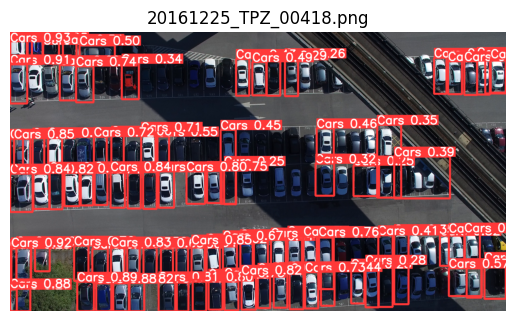

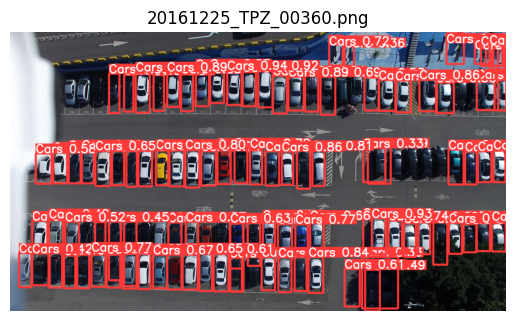

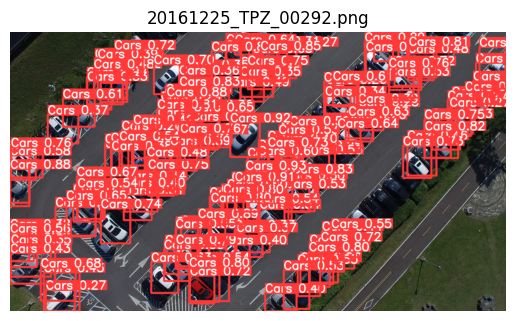

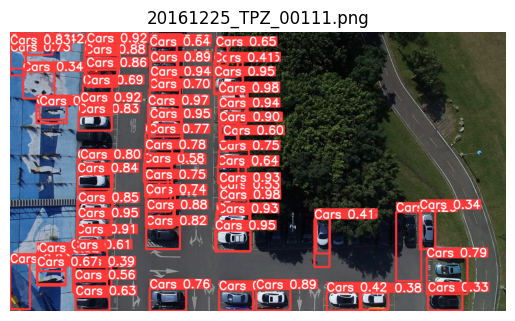

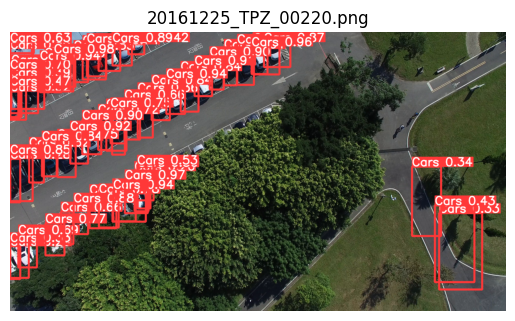

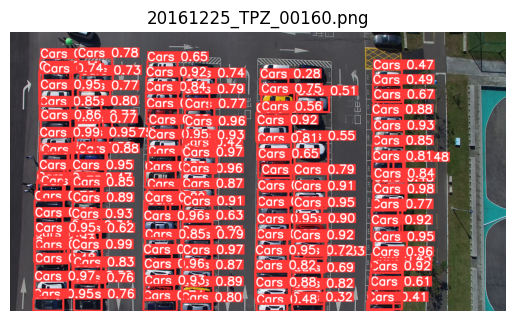

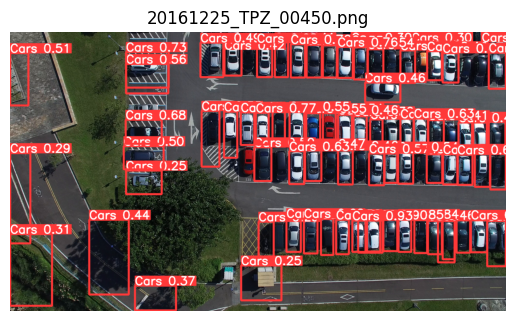

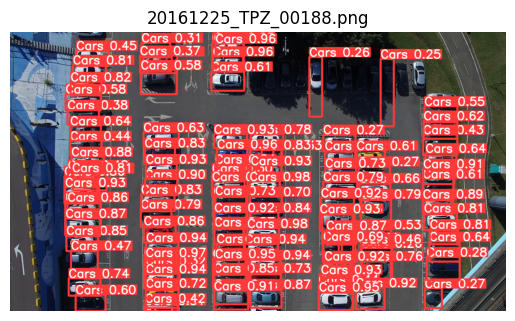

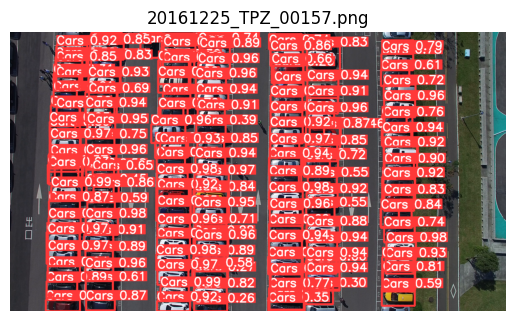

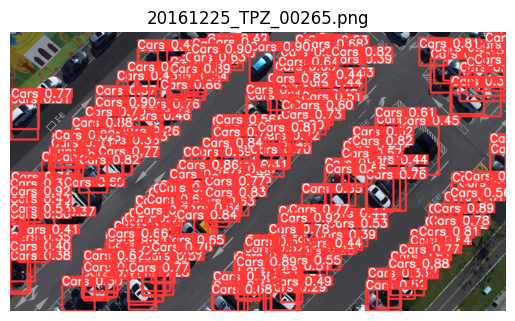

In [ ]:
import os
import matplotlib.pyplot as plt
from matplotlib.image import imread

def display_images_from_folder(folder_path, limit=15):
    # Get a list of files in the folder
    files = os.listdir(folder_path)

    # Filter out non-image files if needed
    image_files = [f for f in files if f.endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    # Limit the number of displayed images
    image_files = image_files[:limit]

    # Display each image
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = imread(image_path)
        plt.imshow(image)
        plt.title(image_file)
        plt.axis('off')  # Hide axis
        plt.show()

# Example usage
folder_path = "/content/runs/detect/predict"
display_images_from_folder(folder_path, limit=10)

